-----------

Deep Learning
------------
Assignment 3
-----

Previously in 2_fullyconnected.ipynb, you trained a logistic regression and a neural network model.
The goal of this assignment is to explore regularization techniques.

-------------

In [4]:
import numpy as np
import tensorflow as tf
import cPickle as pickle
import matplotlib.pyplot as plt
import time
%matplotlib inline

In [5]:
PKL_FILE = 'notMNIST.pickle'
IMG_WIDTH = 28
IMG_HEIGHT = 28
IMG_PIXELS = IMG_HEIGHT * IMG_WIDTH
NUM_CLASSES = 10

with open(PKL_FILE, 'rb') as f:
    save_file = pickle.load(f)
    train_dataset = save_file['train_dataset']
    train_labels  = save_file['train_labels']
    test_dataset  = save_file['test_dataset']
    test_labels   = save_file['test_labels']
    val_dataset   = save_file['valid_dataset']
    val_labels    = save_file['valid_labels']
    
    del save_file
    
print 'Training', train_dataset.shape, train_labels.shape
print 'Test', test_dataset.shape, test_labels.shape
print 'Validation', val_dataset.shape, val_labels.shape

def reformat_dataset(dataset):
    return dataset.reshape(-1, IMG_HEIGHT * IMG_WIDTH).astype(np.float32)

def one_hot_encode(labels):
    if(len(labels.shape) > 1):
        raise Exception('labels should be a vector')
    return (np.arange(NUM_CLASSES) == labels.reshape(-1, 1)).astype(np.float32)

train_dataset = reformat_dataset(train_dataset)
train_labels  = one_hot_encode(train_labels)
test_dataset  = reformat_dataset(test_dataset)
test_labels   = one_hot_encode(test_labels)
val_dataset   = reformat_dataset(val_dataset)
val_labels    = one_hot_encode(val_labels)

print 'Training', train_dataset.shape, train_labels.shape
print 'Test', test_dataset.shape, test_labels.shape
print 'Validation', val_dataset.shape, val_labels.shape

Training (200000, 28, 28) (200000,)
Test (10000, 28, 28) (10000,)
Validation (10000, 28, 28) (10000,)
Training (200000, 784) (200000, 10)
Test (10000, 784) (10000, 10)
Validation (10000, 784) (10000, 10)


In [54]:
def accuracy(predictions, labels):
  return (100.0 * np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))/ predictions.shape[0])


def train_funciton(graph, train_data, val_data, test_data, 
                   training_steps = 3500, batch_size = 128, 
                   keep_prob = 1.0,
                   loss_weight = 0.0
                  ):
    
    train_dataset, train_labels = train_data
    val_dataset, val_labels = val_data
    test_dataset, test_labels = test_data
    
    train_dataset_size = train_dataset.shape[0]

    training_hist = []
    validation_hist = []
    loss_hist = []
    start = time.time()
    with tf.Session(graph = graph) as sess:
        init = tf.initialize_all_variables()
        sess.run(init)
        for step in range(training_steps):
            sample = np.random.choice(np.arange(train_dataset_size), 128)
            data_batch = train_dataset[sample]
            label_batch = train_labels[sample]
            feed_dict = { 
                          tf_train_dataset : data_batch, 
                          tf_train_labels  : label_batch,
                          tf_loss_weight: loss_weight,
                          tf_keep_prob: keep_prob
                        }
            _, loss_score, pred = sess.run([opt, loss, predictions], feed_dict = feed_dict)
            if step % 250 == 0:
         
                #log results
                feed_dict = {
                    tf_train_dataset : val_dataset,
                    tf_keep_prob : keep_prob
                }

                valid_pred = sess.run(predictions, feed_dict = feed_dict)
                train_acc = accuracy(pred, label_batch)
                val_acc = accuracy(valid_pred, val_labels)
                training_hist.append(train_acc)
                validation_hist.append(val_acc)
                loss_hist.append(loss_score)
                
                print 'Loss at step: ', step, loss_score,
                print 'Train Acc', train_acc, #biased
                print 'Valid Acc', val_acc
                print 'Elapsed Time', time.time() - start
        feed_dict = {
            tf_train_dataset : val_dataset,
            tf_keep_prob : keep_prob
        }
        valid_pred = sess.run(predictions, feed_dict = feed_dict)
        train_acc = accuracy(pred, label_batch)
        val_acc = accuracy(valid_pred, val_labels)
        training_hist.append(train_acc)
        validation_hist.append(val_acc)
        loss_hist.append(loss_score)

        print 'Loss at step: ', step, loss_score,
        print 'Train Acc', train_acc, #biased
        print 'Valid Acc', val_acc
        print 'Elapsed Time', time.time() - start
                
        feed_dict = {
            tf_train_dataset : test_dataset,
            tf_keep_prob : 1.0
        }
        test_pred = sess.run(predictions, feed_dict = feed_dict)  
        test_acc = accuracy(test_pred, test_labels)
        print 'Test Accuracy', accuracy(test_pred, test_labels)
        final_w1 = w1.eval()
        final_w2 = w2.eval()
    print 'Runtime', time.time() - start
    return test_acc, training_hist,  validation_hist, loss_hist, [final_w1, final_w2]


In [18]:
# minibatch training with SGD and xavier_initializer
# adding l2_loss

layer_1_size = 1024
layer_2_size = 1024


minibatch_graph = tf.Graph()
with minibatch_graph.as_default():
    
    tf_train_dataset = tf.placeholder(tf.float32, shape = (None, IMG_PIXELS))
    tf_train_labels  = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))
    tf_keep_prob = tf.placeholder(tf.float32, name = "tf_keep_prob")
    tf_loss_weight = tf.placeholder(tf.float32, name="tf_loss_weight")
    
    tf_train_dataset_drop = tf.nn.dropout(tf_train_dataset, tf_keep_prob)
    
    w1 = tf.get_variable("w1", shape = (IMG_PIXELS, layer_1_size), initializer=tf.contrib.layers.xavier_initializer())
    b1 = tf.Variable(tf.truncated_normal(shape = [layer_1_size], mean = 0.1, stddev=0.05))
    h1 = tf.nn.relu(tf.matmul(tf_train_dataset, w1) + b1)
    h1_drop = tf.nn.dropout(h1, tf_keep_prob)
    
    w2 = tf.get_variable("w2", shape = (layer_1_size, layer_2_size), initializer=tf.contrib.layers.xavier_initializer())
    b2 = tf.Variable(tf.truncated_normal(shape = [layer_2_size], mean = 0.1, stddev=0.05))
    h2 = tf.nn.relu(tf.matmul(h1_drop, w2) + b2)
    h2_drop = tf.nn.dropout(h2, tf_keep_prob)
    
    w3 = tf.get_variable("w3", shape = (layer_2_size, NUM_CLASSES), initializer=tf.contrib.layers.xavier_initializer())
    b3 = tf.Variable(tf.truncated_normal(shape = [NUM_CLASSES], mean = 0.1, stddev=0.05))
    logits = tf.matmul(h2_drop, w3) + b3
    
    
    loss = tf.reduce_mean(
                tf.nn.softmax_cross_entropy_with_logits(labels = tf_train_labels, logits = logits)
                + sum([tf_loss_weight*tf.nn.l2_loss(var) for var in [w1, b1, w2, b2, w3, b3]])
    ) 
    opt = tf.train.AdamOptimizer().minimize(loss)
    predictions = tf.nn.softmax(logits)

print 'model rendered'


model rendered


In [30]:
keep_prob_arr = [1.0, 0.25, 0.5, 0.75]
loss_weight_arr = [0.0, 1e-4, 1e-5, 1e-6]
results = {}
for keep_prob in keep_prob_arr:
    for loss_weight in loss_weight_arr:
        print 'starting with keep prob', keep_prob, 'loss wt', loss_weight
        test_acc, training_hist,  validation_hist, loss_hist, _ = train_funciton(minibatch_graph, 
                                                                    (train_dataset, train_labels), 
                                                                    (val_dataset, val_labels), 
                                                                    (test_dataset, test_labels), 
                                                                    training_steps = 2500,
                                                                    loss_weight = loss_weight,
                                                                    keep_prob = keep_prob)
        results[(keep_prob, loss_weight)] = (test_acc, training_hist, validation_hist)
        print 'completed keep prob: ', keep_prob, 'loss wt: ', loss_weight, 'test_acc: ', test_acc
        print '-------------------------------------------'

starting with keep prob 1.0 loss wt 0.0
Loss at step:  0 2.30298 Train Acc 19.53125 Valid Acc 37.62
Elapsed Time 1.5033288002
Loss at step:  1000 0.456925 Train Acc 85.9375 Valid Acc 87.19
Elapsed Time 52.2656757832
Loss at step:  2000 0.372377 Train Acc 88.28125 Valid Acc 88.22
Elapsed Time 103.913458824
Test Accuracy 94.55
Runtime 130.221535921
completed keep prob:  1.0 loss wt:  0.0 test_acc:  94.55
-------------------------------------------
starting with keep prob 1.0 loss wt 0.0001
Loss at step:  0 2.5699 Train Acc 2.34375 Valid Acc 34.17
Elapsed Time 1.48008418083
Loss at step:  1000 0.497172 Train Acc 88.28125 Valid Acc 87.18
Elapsed Time 53.7906441689
Loss at step:  2000 0.461573 Train Acc 87.5 Valid Acc 88.2
Elapsed Time 104.231021166
Test Accuracy 94.81
Runtime 129.923328161
completed keep prob:  1.0 loss wt:  0.0001 test_acc:  94.81
-------------------------------------------
starting with keep prob 1.0 loss wt 1e-05
Loss at step:  0 2.3222 Train Acc 13.28125 Valid Acc 38.8

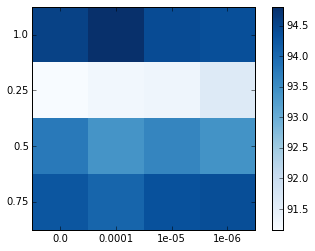

In [38]:
out_matrix = np.zeros((len(keep_prob_arr), len(loss_weight_arr)))
for idx1, kp in enumerate(keep_prob_arr):
    for idx2, lw in enumerate(loss_weight_arr):
        out_matrix[idx1, idx2] = results[(kp, lw)][0]

plt.imshow(out_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
plt.xticks(range(4), loss_weight_arr)
plt.yticks(range(4), keep_prob_arr)
plt.show()

In [44]:
# minibatch training with SGD and xavier_initializer
# adding l2_loss

layer_1_size = 1024
layer_2_size = 1024


minibatch_graph = tf.Graph()
with minibatch_graph.as_default():
    
    tf_train_dataset = tf.placeholder(tf.float32, shape = (None, IMG_PIXELS))
    tf_train_labels  = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))
    tf_keep_prob = tf.placeholder(tf.float32, name = "tf_keep_prob")
    tf_loss_weight = tf.placeholder(tf.float32, name="tf_loss_weight")
    
    tf_train_dataset_drop = tf.nn.dropout(tf_train_dataset, tf_keep_prob)
    
    w1 = tf.get_variable("w1", shape = (IMG_PIXELS, layer_1_size), initializer=tf.contrib.layers.xavier_initializer())
    b1 = tf.Variable(tf.truncated_normal(shape = [layer_1_size], mean = 0.1, stddev=0.05))
    h1 = tf.nn.relu(tf.matmul(tf_train_dataset, w1) + b1)
    h1_drop = tf.nn.dropout(h1, tf_keep_prob)
    
    w2 = tf.get_variable("w2", shape = (layer_1_size, layer_2_size), initializer=tf.contrib.layers.xavier_initializer())
    b2 = tf.Variable(tf.truncated_normal(shape = [layer_2_size], mean = 0.1, stddev=0.05))
    h2 = tf.nn.relu(tf.matmul(h1_drop, w2) + b2)
    h2_drop = tf.nn.dropout(h2, tf_keep_prob)
    
    w3 = tf.get_variable("w3", shape = (layer_2_size, NUM_CLASSES), initializer=tf.contrib.layers.xavier_initializer())
    b3 = tf.Variable(tf.truncated_normal(shape = [NUM_CLASSES], mean = 0.1, stddev=0.05))
    logits = tf.matmul(h2_drop, w3) + b3
    
    
    loss = tf.reduce_mean(
                tf.nn.softmax_cross_entropy_with_logits(labels = tf_train_labels, logits = logits)
                + sum([tf_loss_weight*tf.nn.l2_loss(var) for var in [w1, b1, w2, b2, w3, b3]])
    ) 
    opt = tf.train.AdamOptimizer().minimize(loss)
    predictions = tf.nn.softmax(logits)

print 'model rendered'

test_acc, training_hist,  validation_hist, loss_hist, _ = train_funciton(minibatch_graph, 
                                                                        (train_dataset, train_labels), 
                                                                        (val_dataset, val_labels), 
                                                                        (test_dataset, test_labels), 
                                                                        training_steps = 15000,
                                                                        loss_weight = 0.0001,
                                                                        keep_prob = 1.0)


model rendered
Loss at step:  0 2.44393 Train Acc 13.28125 Valid Acc 29.25
Elapsed Time 1.63785004616
Loss at step:  1000 0.358167 Train Acc 91.40625 Valid Acc 86.86
Elapsed Time 56.3808131218
Loss at step:  2000 0.537983 Train Acc 87.5 Valid Acc 87.85
Elapsed Time 110.455722094
Loss at step:  3000 0.554219 Train Acc 87.5 Valid Acc 89.04
Elapsed Time 162.973975897
Loss at step:  4000 0.561887 Train Acc 89.84375 Valid Acc 88.98
Elapsed Time 218.533764124
Loss at step:  5000 0.381677 Train Acc 91.40625 Valid Acc 89.46
Elapsed Time 270.519726992
Loss at step:  6000 0.36012 Train Acc 92.96875 Valid Acc 89.38
Elapsed Time 325.225172043
Loss at step:  7000 0.422913 Train Acc 89.84375 Valid Acc 89.59
Elapsed Time 377.404019117
Loss at step:  8000 0.277553 Train Acc 95.3125 Valid Acc 89.84
Elapsed Time 433.59900403
Loss at step:  9000 0.286564 Train Acc 93.75 Valid Acc 89.74
Elapsed Time 486.595948935
Loss at step:  10000 0.436801 Train Acc 89.84375 Valid Acc 89.86
Elapsed Time 538.644500017
L

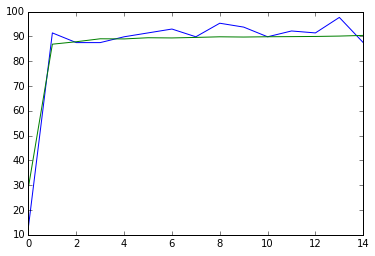

In [46]:
plt.plot(training_hist)
plt.plot(validation_hist)
plt.show()

In [57]:
# minibatch training with SGD and xavier_initializer
# adding l2_loss

layer_1_size = 1024
layer_2_size = 1024
layer_3_size = 512


minibatch_graph = tf.Graph()
with minibatch_graph.as_default():
    
    tf_train_dataset = tf.placeholder(tf.float32, shape = (None, IMG_PIXELS))
    tf_train_labels  = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))
    tf_keep_prob = tf.placeholder(tf.float32, name = "tf_keep_prob")
    tf_loss_weight = tf.placeholder(tf.float32, name="tf_loss_weight")
    
    tf_train_dataset_drop = tf.nn.dropout(tf_train_dataset, tf_keep_prob)
    
    w1 = tf.get_variable("w1", shape = (IMG_PIXELS, layer_1_size), initializer=tf.contrib.layers.xavier_initializer())
    b1 = tf.Variable(tf.truncated_normal(shape = [layer_1_size], mean = 0.1, stddev=0.05))
    h1 = tf.nn.relu(tf.matmul(tf_train_dataset, w1) + b1)
    h1_drop = tf.nn.dropout(h1, tf_keep_prob)
    
    w2 = tf.get_variable("w2", shape = (layer_1_size, layer_2_size), initializer=tf.contrib.layers.xavier_initializer())
    b2 = tf.Variable(tf.truncated_normal(shape = [layer_2_size], mean = 0.1, stddev=0.05))
    h2 = tf.nn.relu(tf.matmul(h1_drop, w2) + b2)
    h2_drop = tf.nn.dropout(h2, tf_keep_prob)
    
    w3 = tf.get_variable("w3", shape = (layer_2_size, layer_3_size), initializer=tf.contrib.layers.xavier_initializer())
    b3 = tf.Variable(tf.truncated_normal(shape = [layer_3_size], mean = 0.1, stddev=0.05))
    h3 = tf.nn.relu(tf.matmul(h2_drop, w3) + b3)
    h3_drop = tf.nn.dropout(h3, tf_keep_prob)
    
    w4 = tf.get_variable("w4", shape = (layer_3_size, NUM_CLASSES), initializer=tf.contrib.layers.xavier_initializer())
    b4 = tf.Variable(tf.truncated_normal(shape = [NUM_CLASSES], mean = 0.1, stddev=0.05))
    logits = tf.matmul(h3_drop, w4) + b4
    
    
    loss = tf.reduce_mean(
                tf.nn.softmax_cross_entropy_with_logits(labels = tf_train_labels, logits = logits)
                + sum([tf_loss_weight*tf.nn.l2_loss(var) for var in [w1, b1, w2, b2, w3, b3, w4, b4]])
    ) 
    opt = tf.train.AdamOptimizer().minimize(loss)
    predictions = tf.nn.softmax(logits)

print 'model rendered'

test_acc, training_hist,  validation_hist, loss_hist, [local_w1, local_w2] = train_funciton(minibatch_graph, 
                                                                        (train_dataset, train_labels), 
                                                                        (val_dataset, val_labels), 
                                                                        (test_dataset, test_labels), 
                                                                        training_steps = 15000,
                                                                        loss_weight = 1e-6,
                                                                        keep_prob = 1.0,
                                                                        batch_size=512)


model rendered
Loss at step:  0 2.3737 Train Acc 10.9375 Valid Acc 38.51
Elapsed Time 1.81596899033
Loss at step:  250 0.392907 Train Acc 88.28125 Valid Acc 84.69
Elapsed Time 18.9639220238
Loss at step:  500 0.271615 Train Acc 92.1875 Valid Acc 85.56
Elapsed Time 37.0489079952
Loss at step:  750 0.236629 Train Acc 91.40625 Valid Acc 85.95
Elapsed Time 54.7499790192
Loss at step:  1000 0.382713 Train Acc 89.84375 Valid Acc 87.5
Elapsed Time 72.4478039742
Loss at step:  1250 0.289957 Train Acc 90.625 Valid Acc 87.48
Elapsed Time 90.3904759884
Loss at step:  1500 0.496251 Train Acc 85.15625 Valid Acc 87.95
Elapsed Time 108.304320097
Loss at step:  1750 0.347806 Train Acc 88.28125 Valid Acc 88.04
Elapsed Time 126.018242121
Loss at step:  2000 0.238258 Train Acc 92.96875 Valid Acc 88.44
Elapsed Time 143.836029053
Loss at step:  2250 0.282008 Train Acc 91.40625 Valid Acc 88.63
Elapsed Time 161.500925064
Loss at step:  2500 0.408955 Train Acc 89.0625 Valid Acc 88.61
Elapsed Time 179.26151800

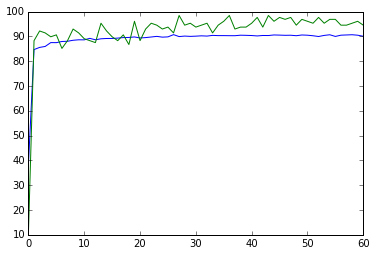

In [59]:
plt.plot(validation_hist); plt.plot(training_hist);  plt.show()

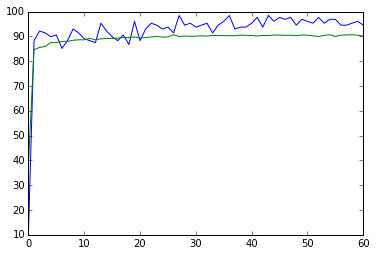

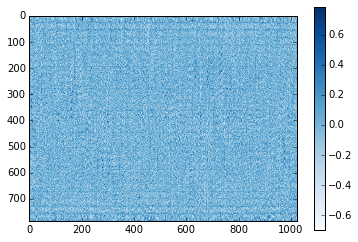

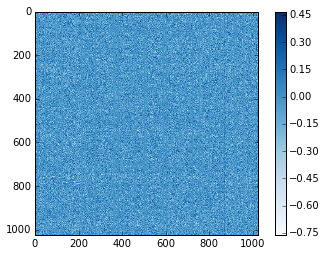

In [60]:
plt.plot(training_hist)
plt.plot(validation_hist)
plt.show()



plt.imshow(local_w1, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
plt.show()

plt.imshow(local_w2, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
plt.show()

element 0


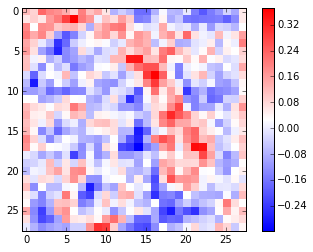

element 1


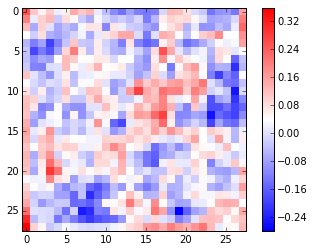

element 2


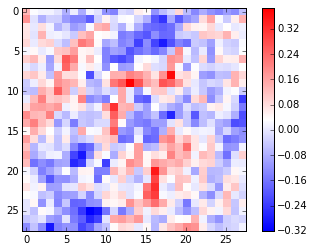

element 3


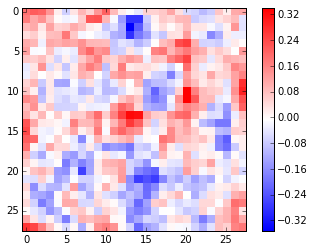

element 4


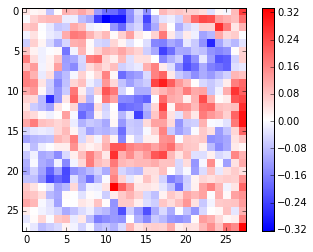

element 5


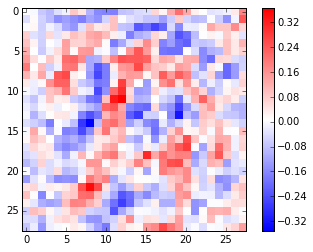

element 6


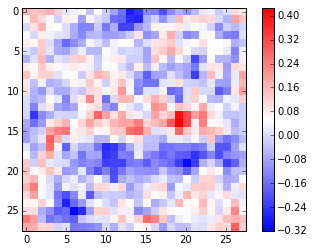

element 7


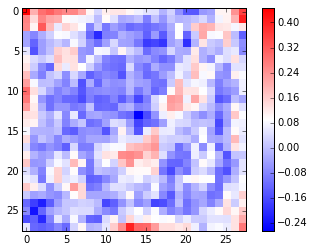

element 8


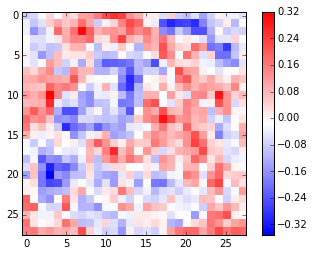

element 9


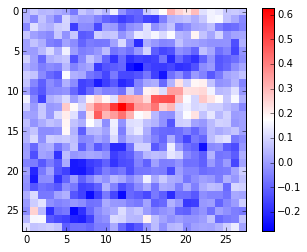

element 10


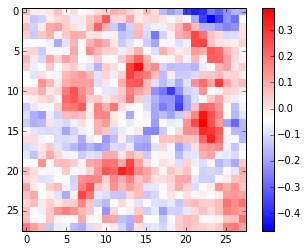

element 11


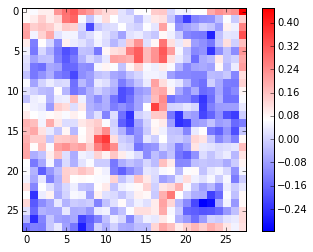

element 12


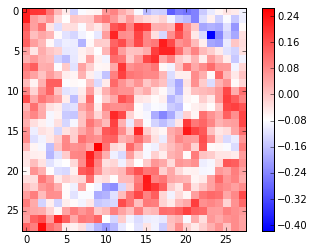

element 13


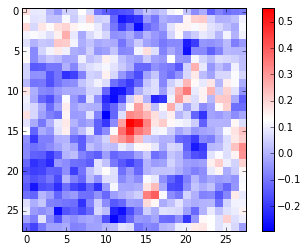

element 14


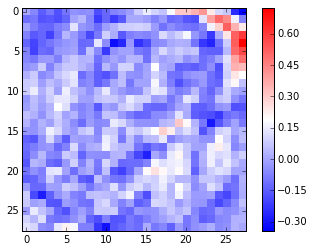

element 15


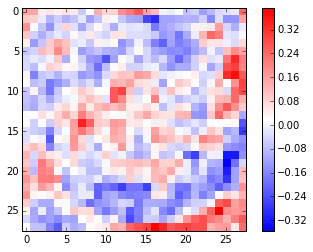

element 16


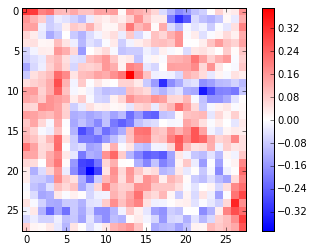

element 17


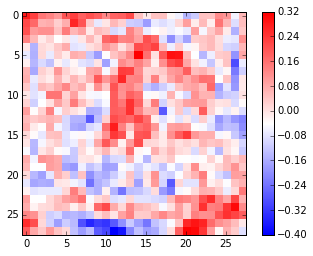

element 18


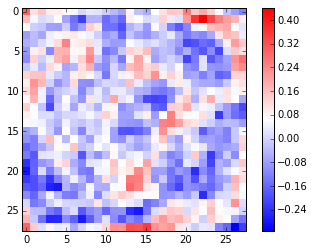

element 19


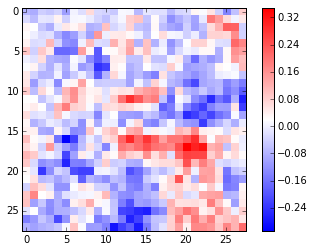

element 20


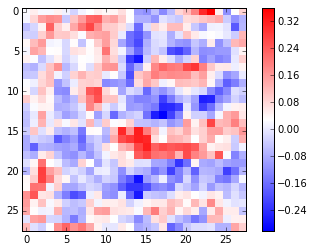

element 21


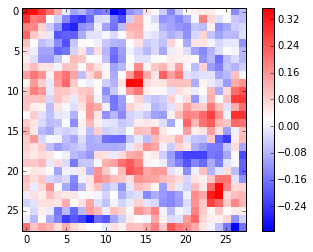

element 22


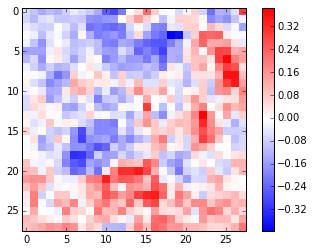

element 23


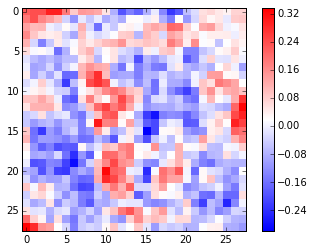

element 24


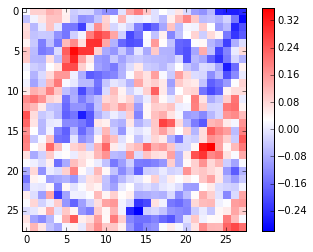

element 25


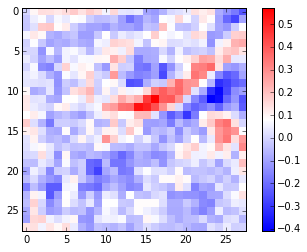

element 26


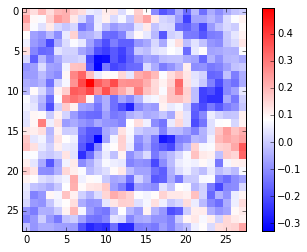

element 27


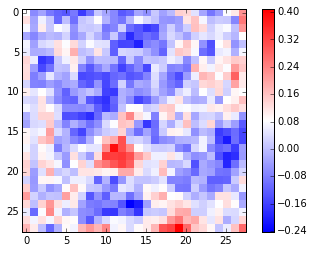

element 28


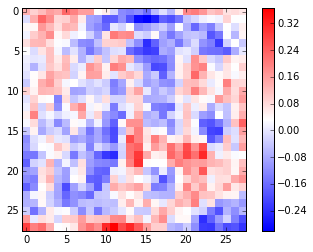

element 29


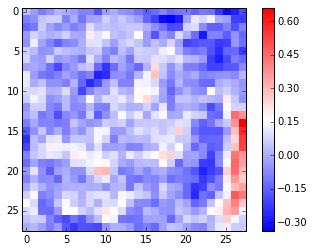

element 30


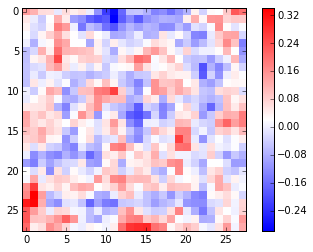

element 31


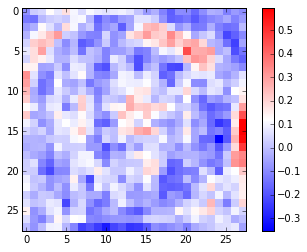

element 32


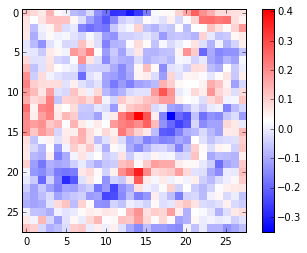

element 33


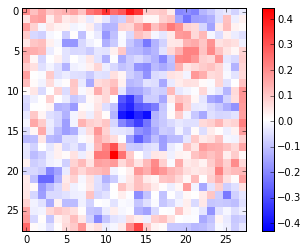

element 34


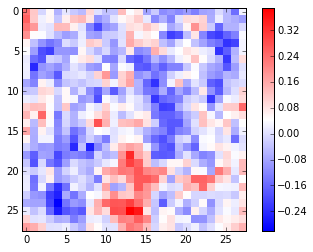

element 35


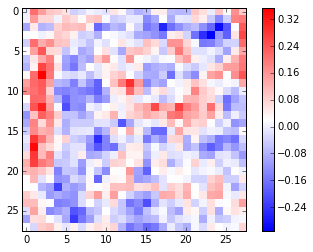

element 36


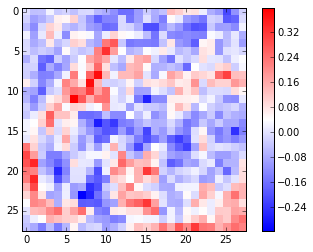

element 37


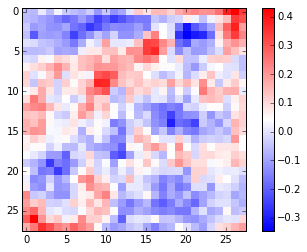

element 38


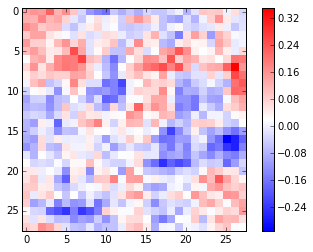

element 39


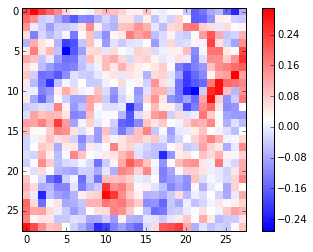

element 40


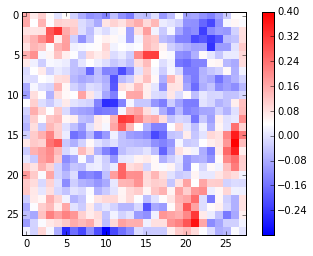

element 41


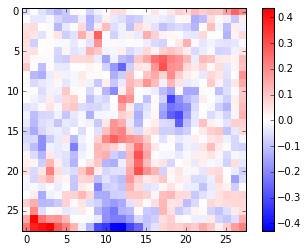

element 42


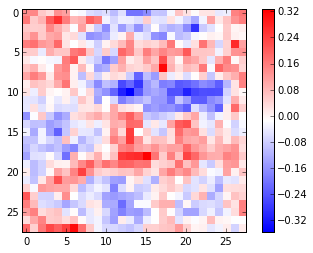

element 43


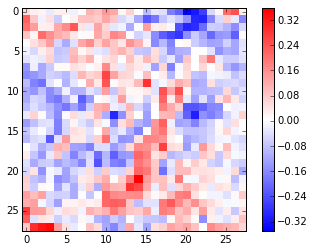

element 44


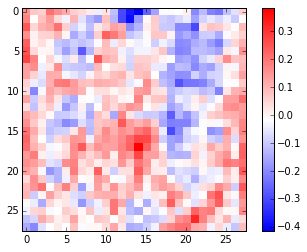

element 45


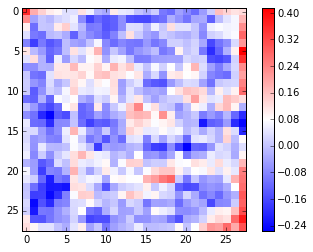

element 46


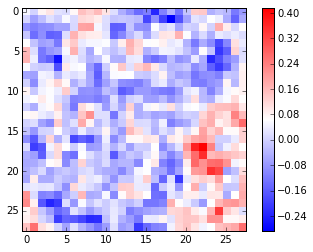

element 47


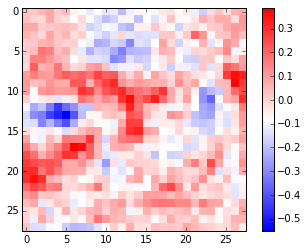

element 48


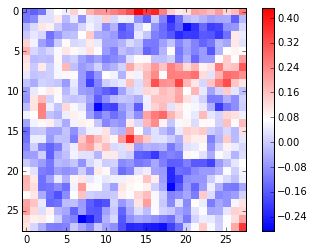

element 49


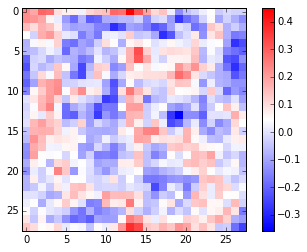

element 50


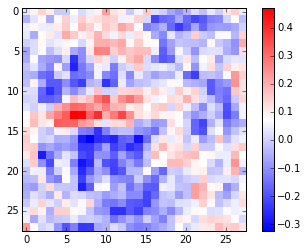

element 51


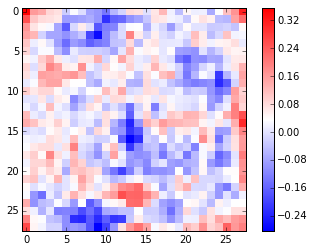

element 52


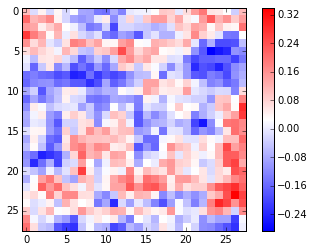

element 53


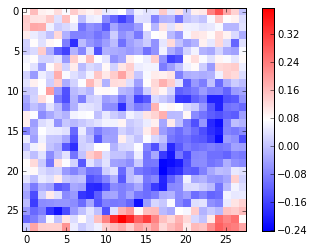

element 54


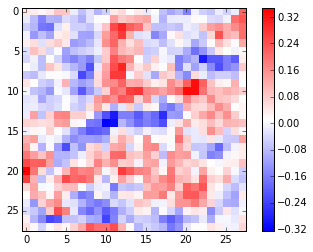

element 55


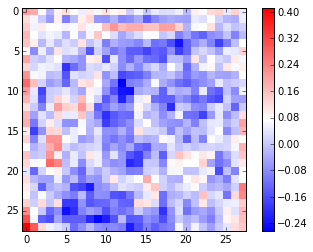

element 56


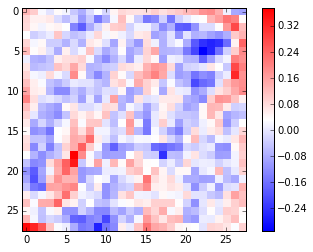

element 57


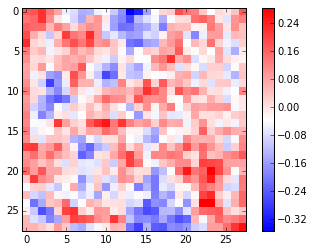

element 58


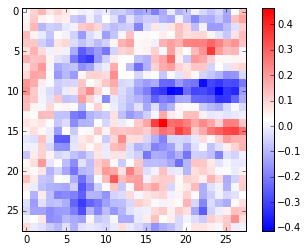

element 59


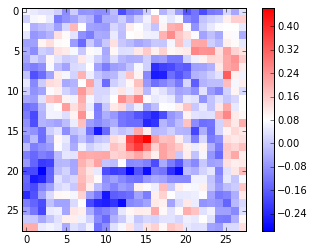

element 60


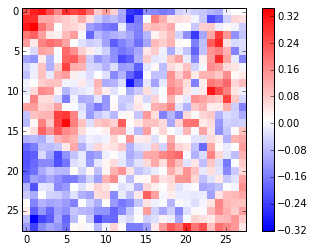

element 61


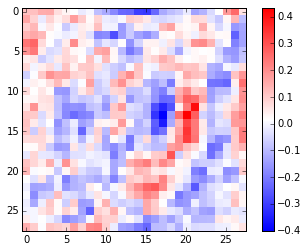

element 62


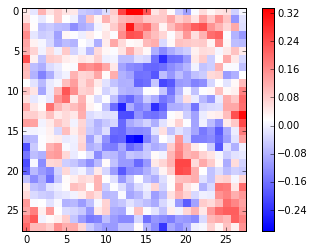

element 63


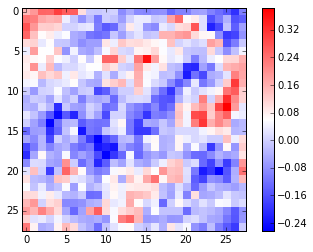

element 64


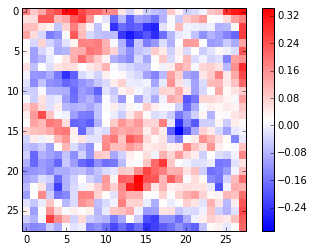

element 65


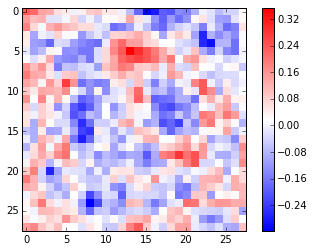

element 66


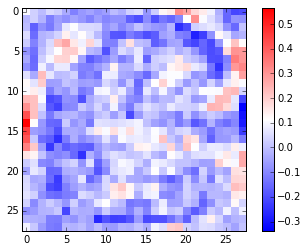

element 67


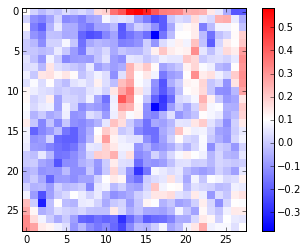

element 68


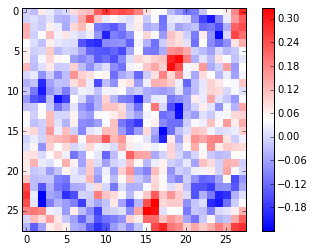

element 69


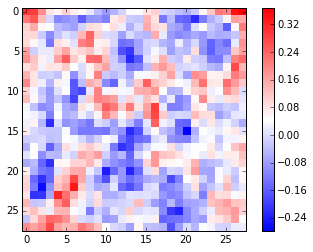

element 70


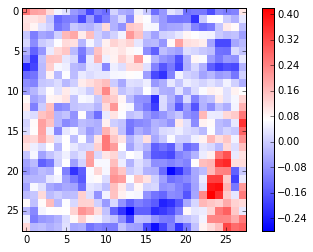

element 71


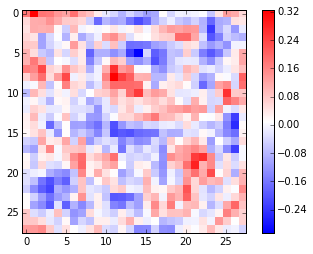

element 72


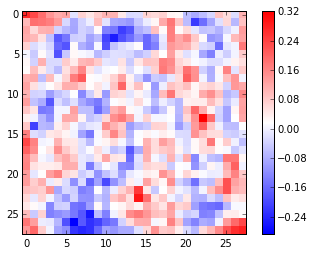

element 73


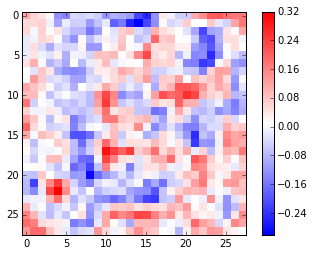

element 74


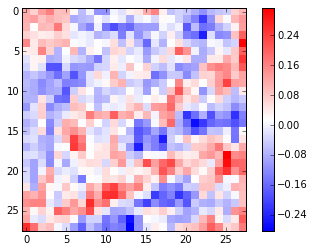

element 75


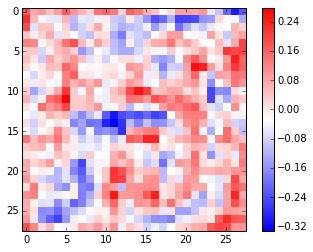

element 76


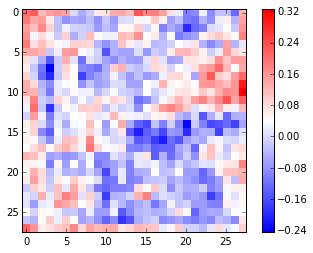

element 77


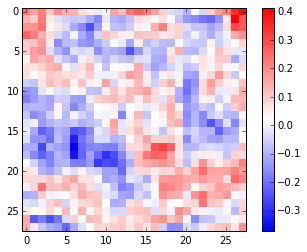

element 78


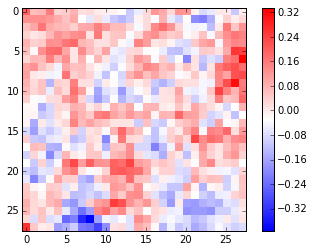

element 79


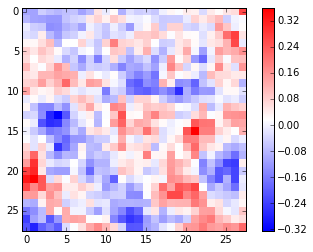

element 80


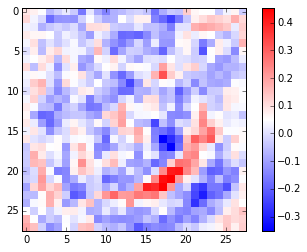

element 81


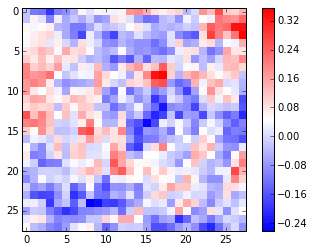

element 82


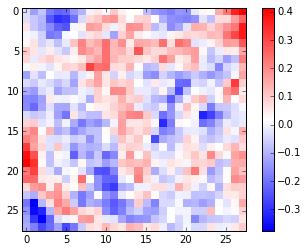

element 83


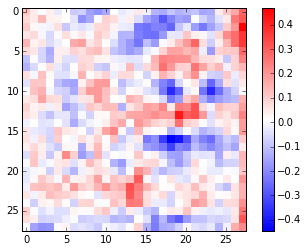

element 84


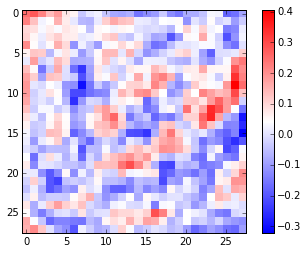

element 85


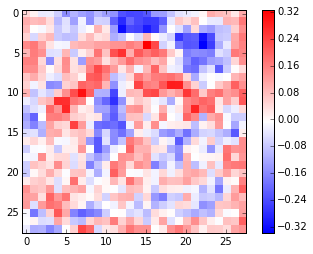

element 86


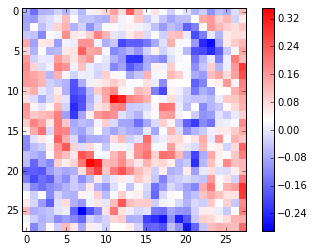

element 87


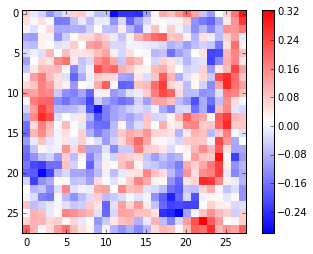

element 88


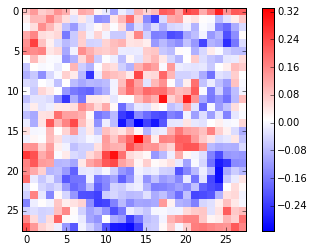

element 89


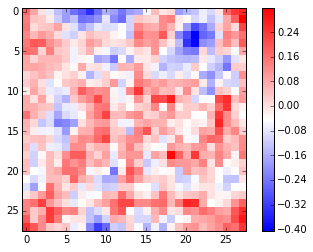

element 90


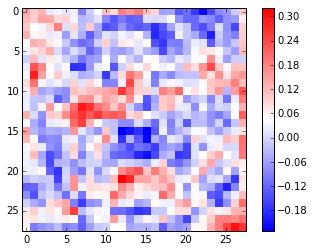

element 91


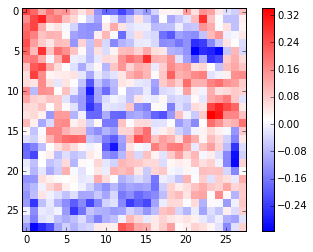

element 92


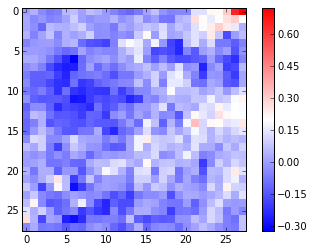

element 93


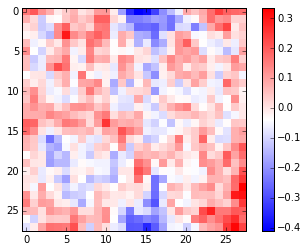

element 94


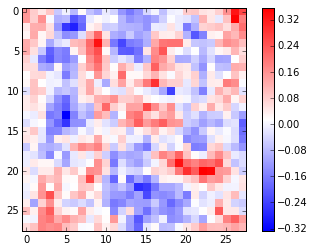

element 95


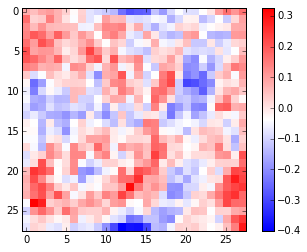

element 96


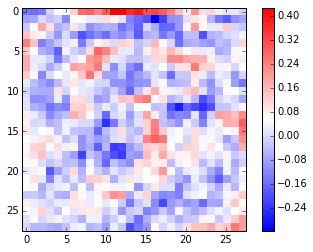

element 97


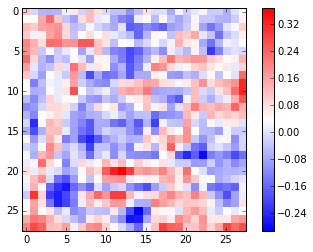

element 98


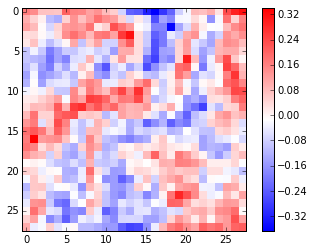

element 99


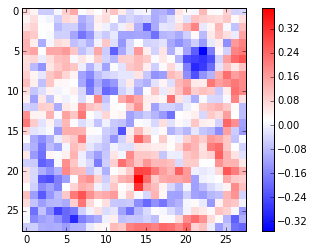

element 100


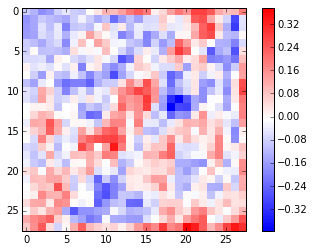

element 101


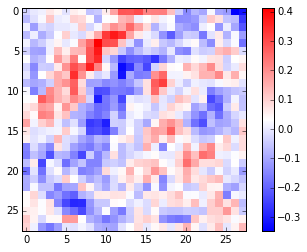

element 102


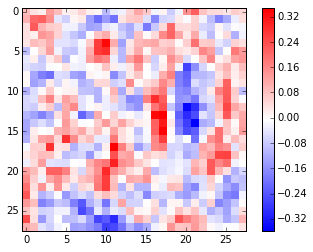

element 103


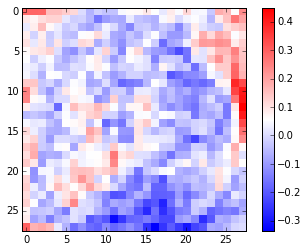

element 104


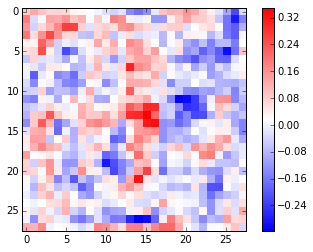

element 105


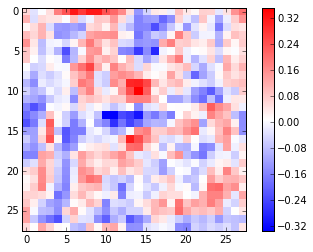

element 106


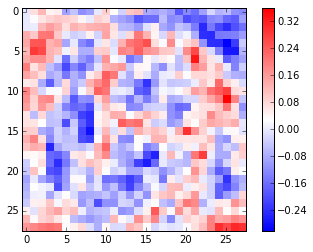

element 107


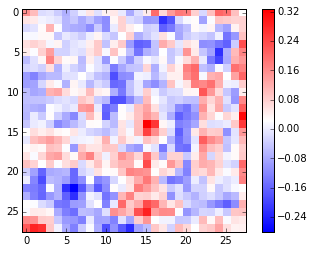

element 108


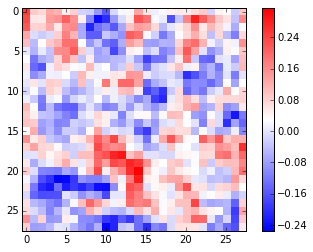

element 109


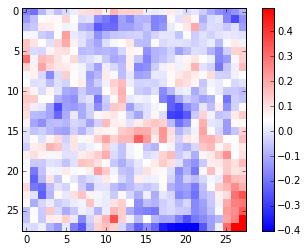

element 110


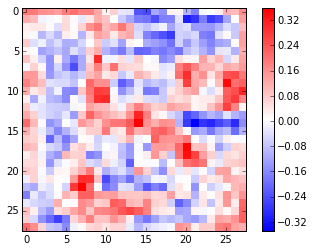

element 111


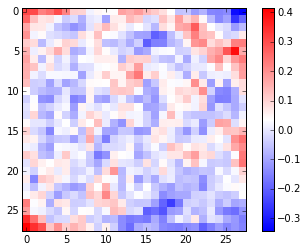

element 112


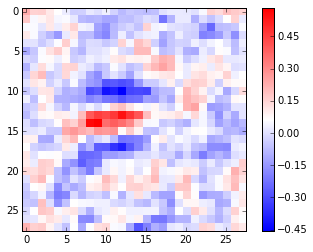

element 113


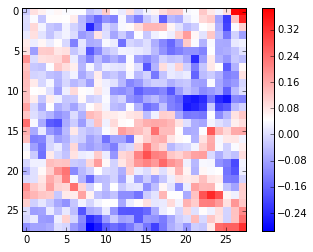

element 114


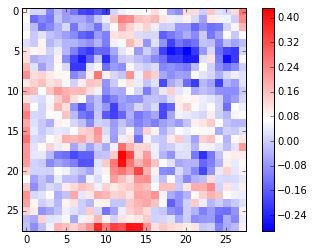

element 115


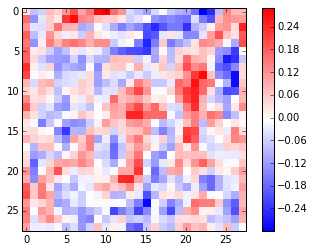

element 116


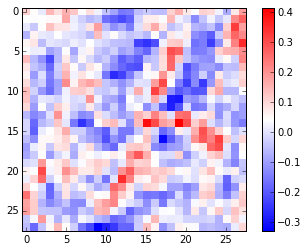

element 117


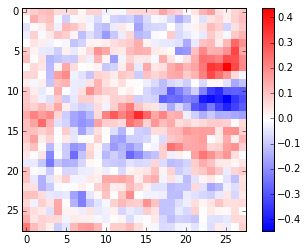

element 118


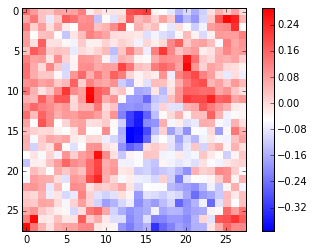

element 119


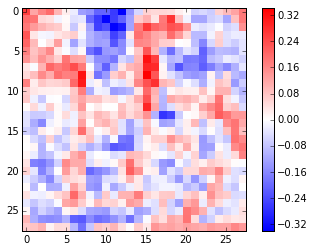

element 120


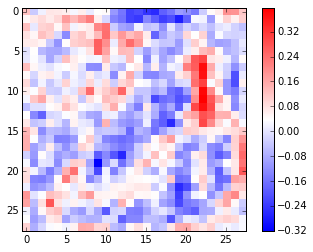

element 121


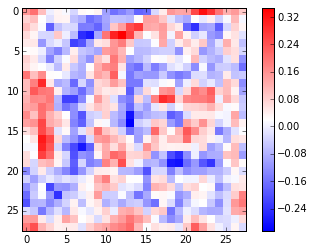

element 122


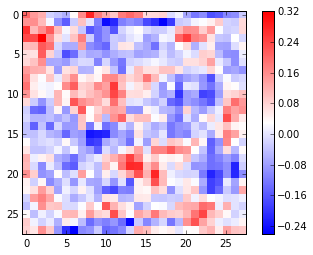

element 123


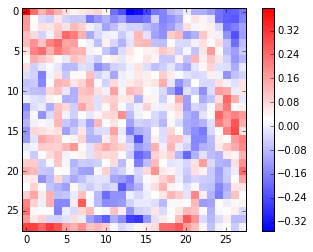

element 124


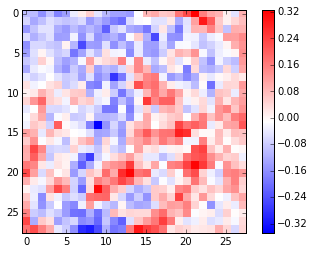

element 125


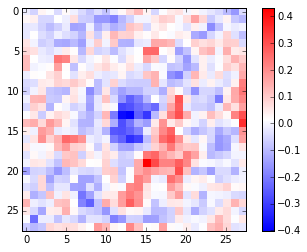

element 126


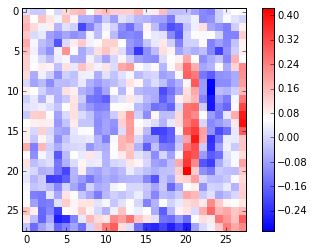

element 127


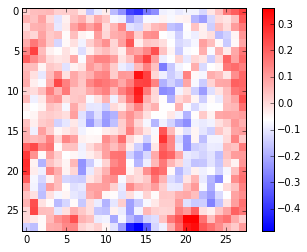

element 128


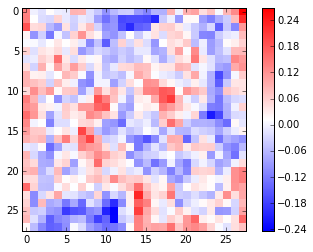

element 129


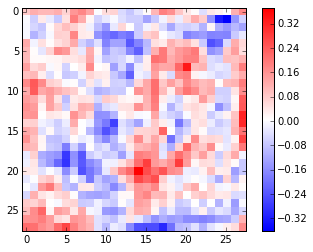

element 130


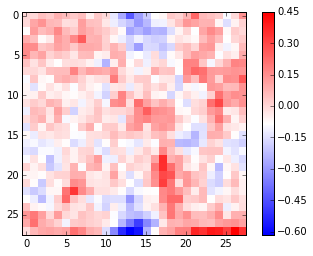

element 131


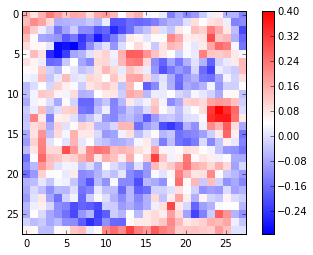

element 132


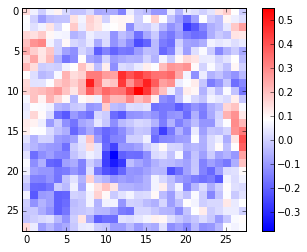

element 133


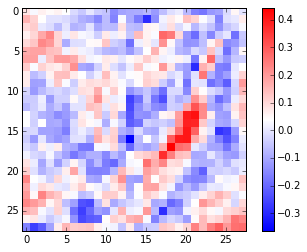

element 134


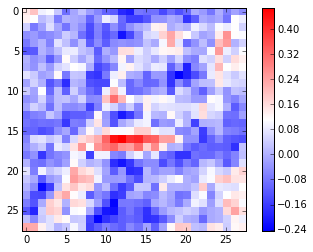

element 135


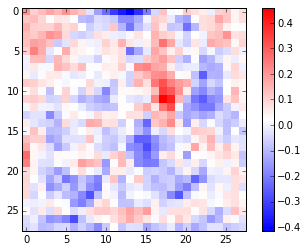

element 136


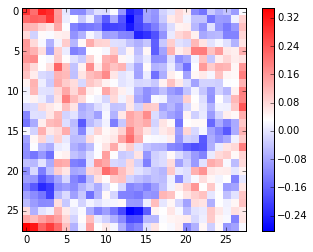

element 137


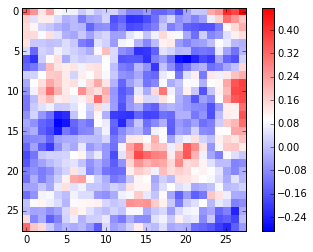

element 138


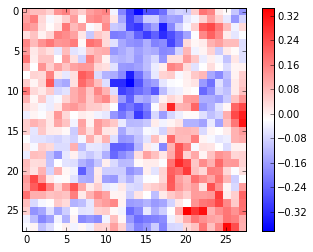

element 139


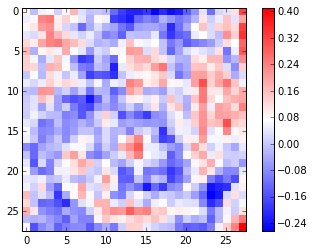

element 140


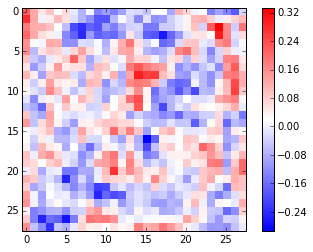

element 141


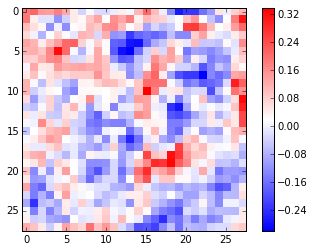

element 142


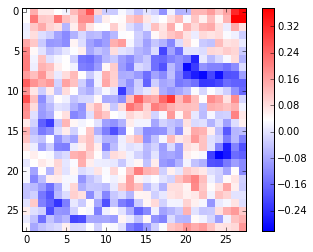

element 143


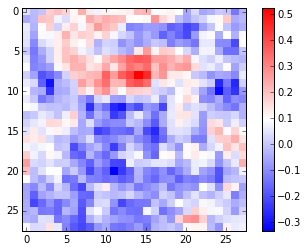

element 144


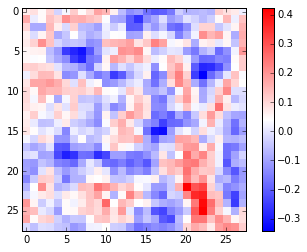

element 145


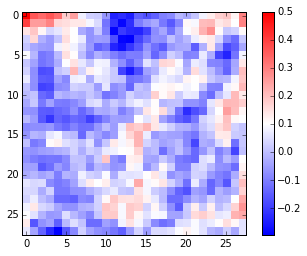

element 146


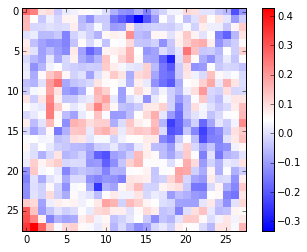

element 147


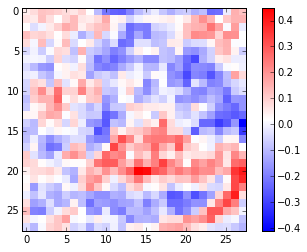

element 148


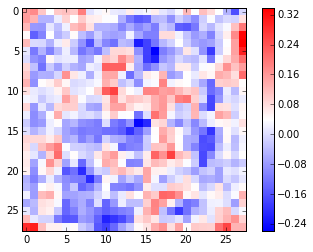

element 149


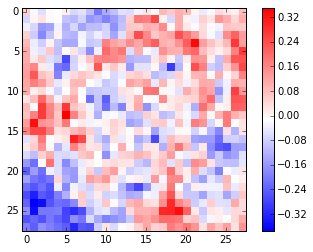

element 150


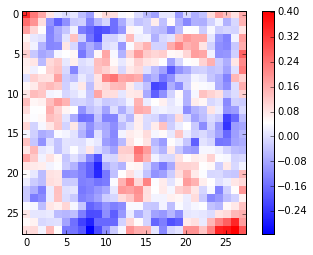

element 151


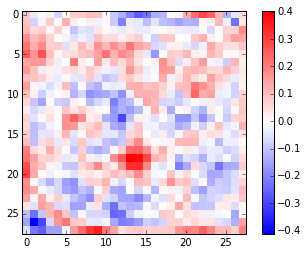

element 152


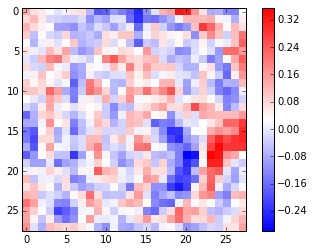

element 153


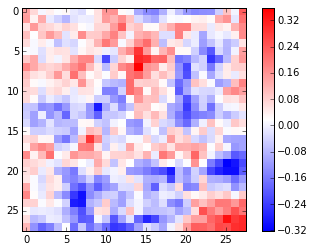

element 154


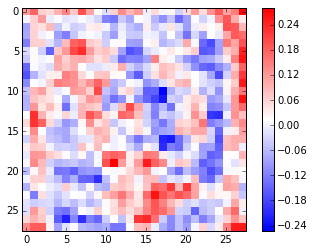

element 155


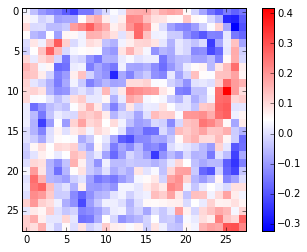

element 156


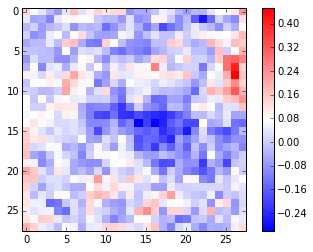

element 157


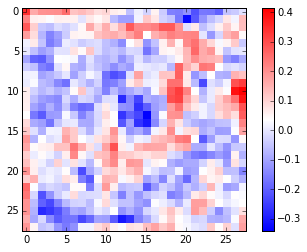

element 158


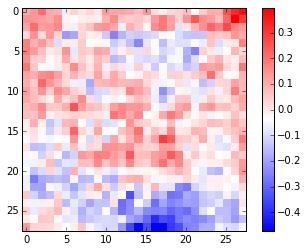

element 159


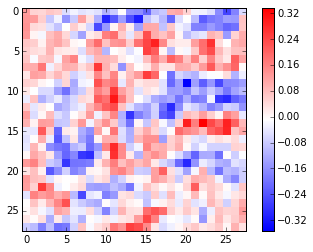

element 160


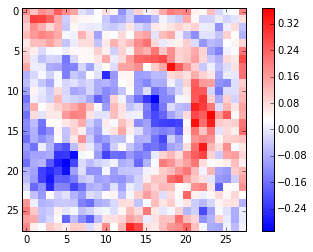

element 161


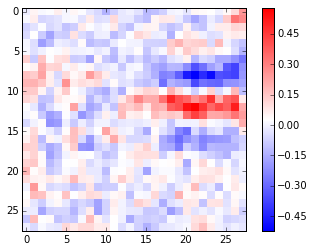

element 162


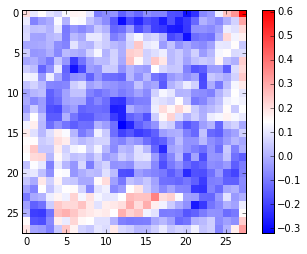

element 163


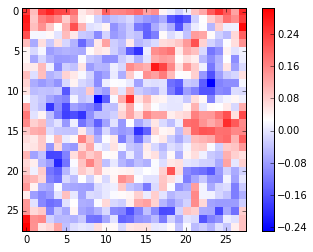

element 164


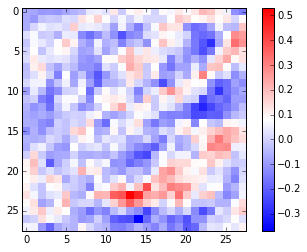

element 165


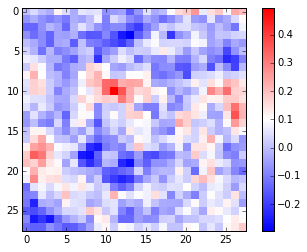

element 166


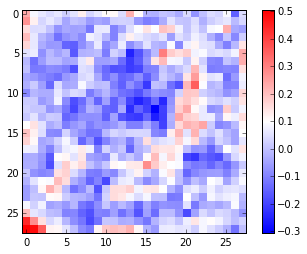

element 167


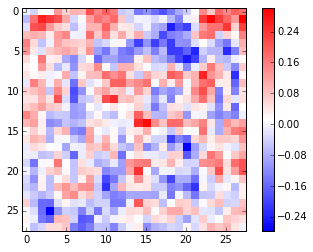

element 168


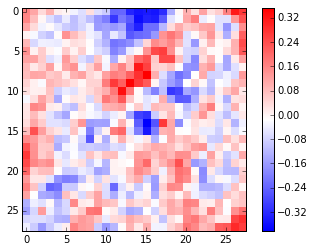

element 169


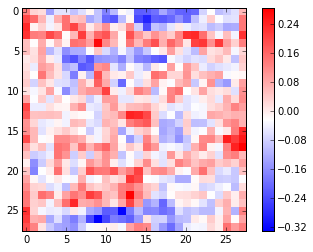

element 170


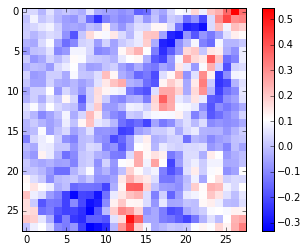

element 171


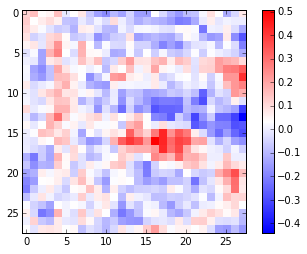

element 172


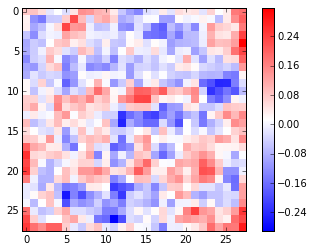

element 173


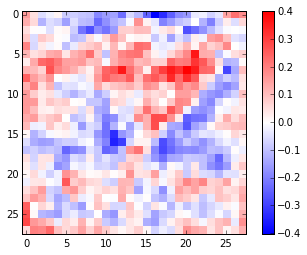

element 174


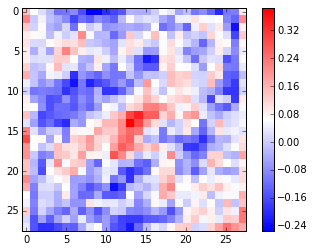

element 175


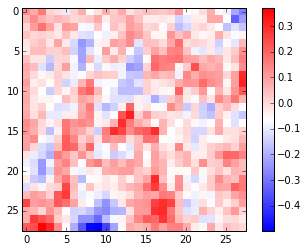

element 176


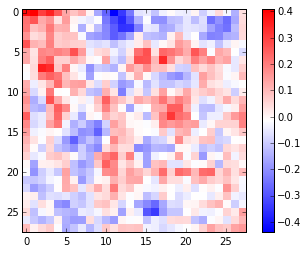

element 177


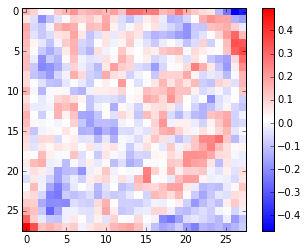

element 178


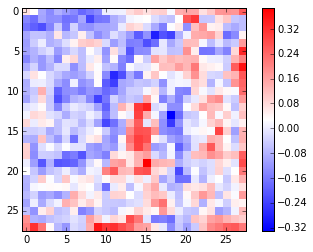

element 179


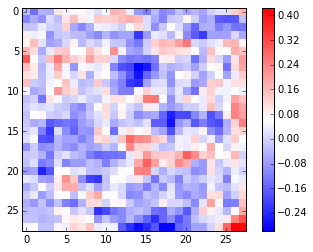

element 180


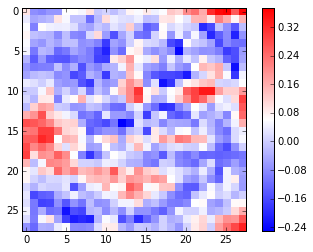

element 181


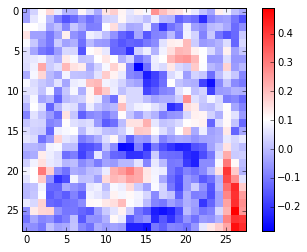

element 182


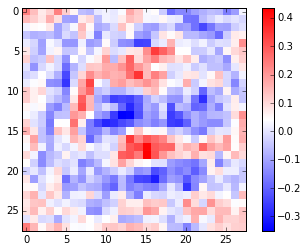

element 183


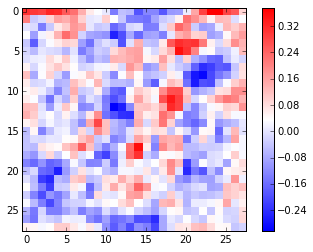

element 184


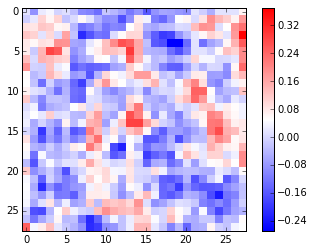

element 185


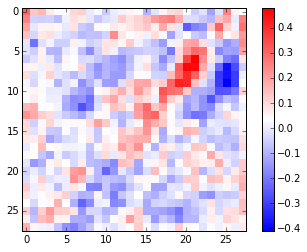

element 186


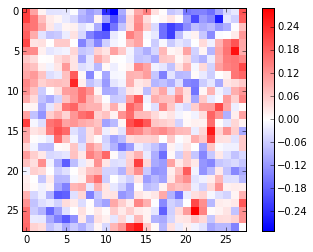

element 187


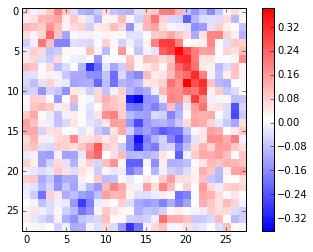

element 188


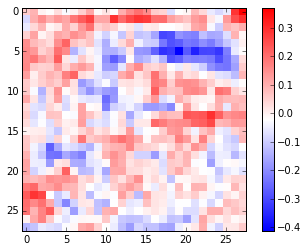

element 189


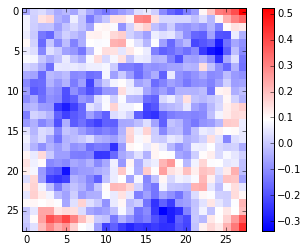

element 190


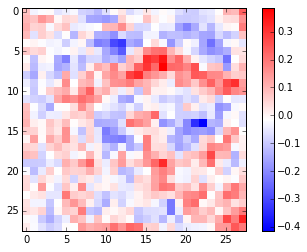

element 191


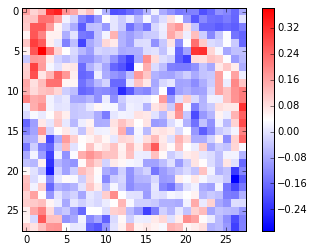

element 192


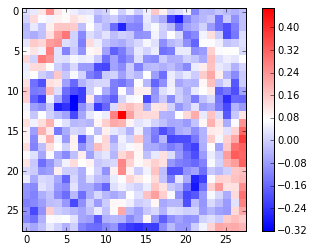

element 193


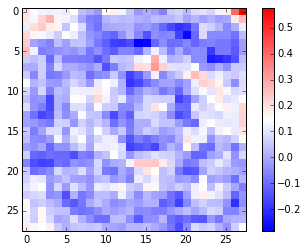

element 194


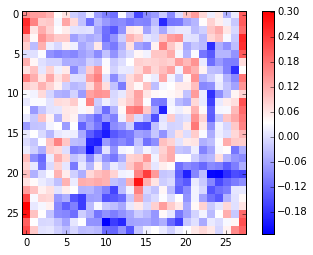

element 195


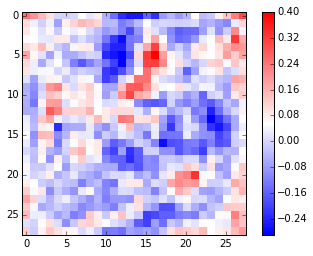

element 196


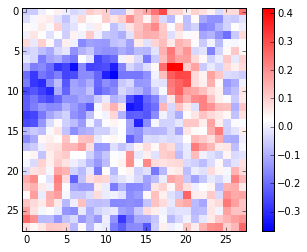

element 197


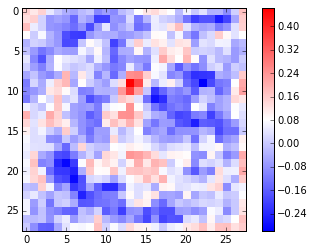

element 198


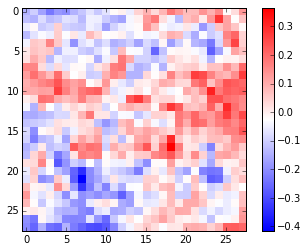

element 199


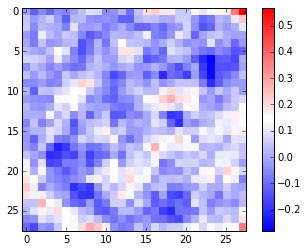

element 200


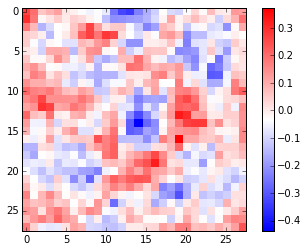

element 201


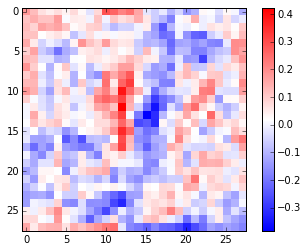

element 202


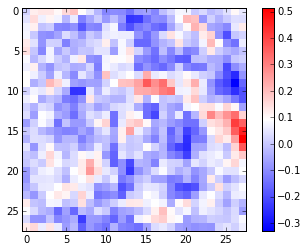

element 203


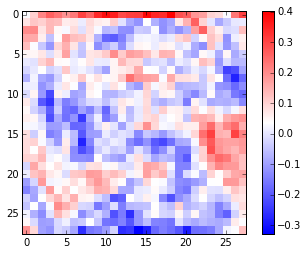

element 204


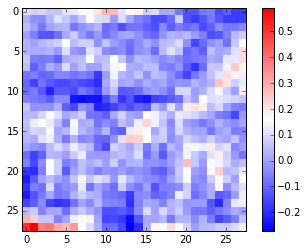

element 205


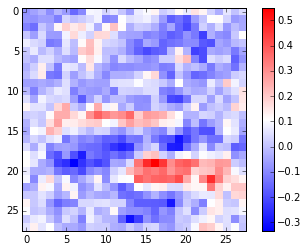

element 206


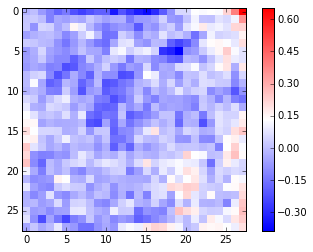

element 207


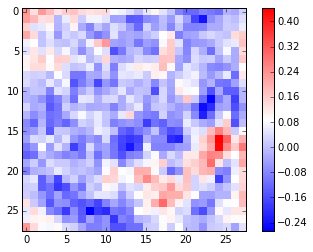

element 208


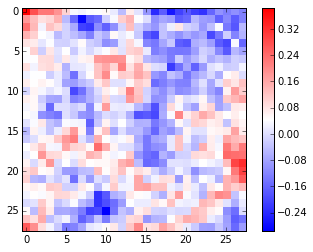

element 209


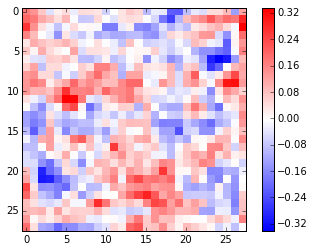

element 210


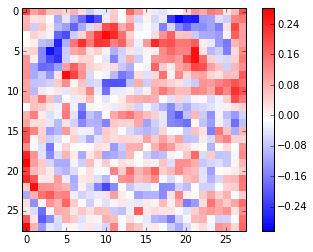

element 211


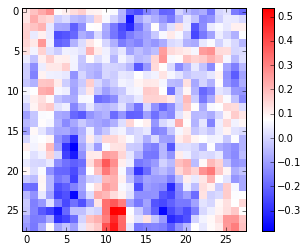

element 212


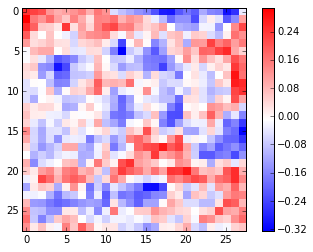

element 213


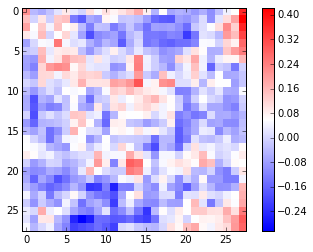

element 214


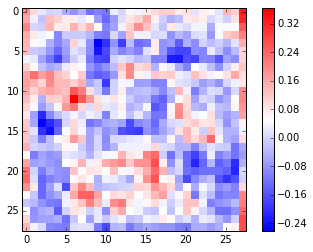

element 215


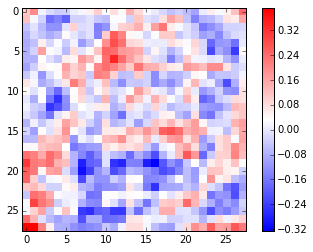

element 216


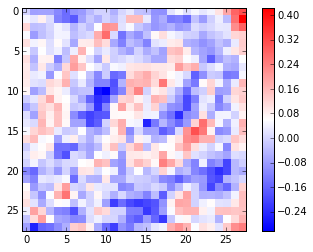

element 217


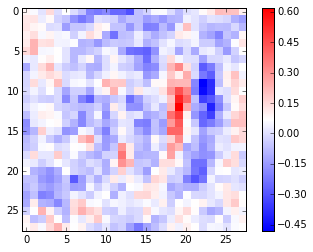

element 218


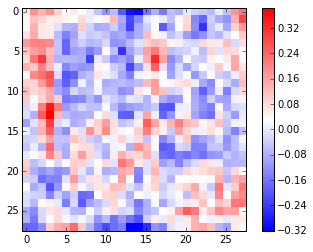

element 219


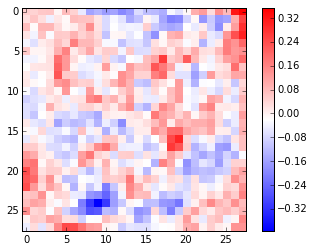

element 220


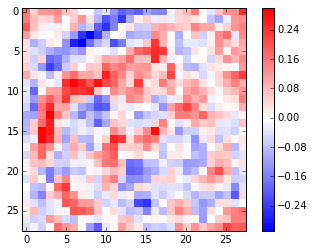

element 221


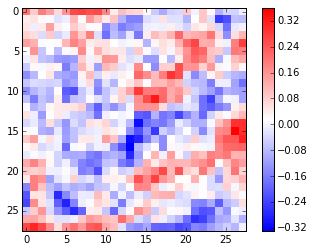

element 222


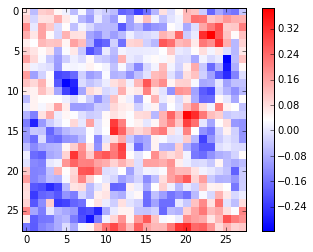

element 223


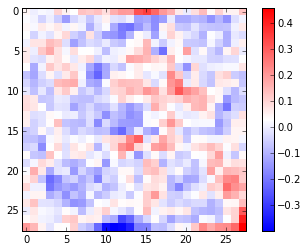

element 224


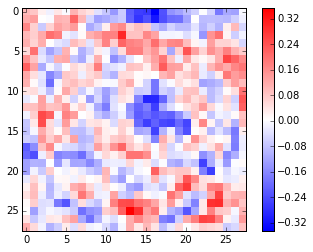

element 225


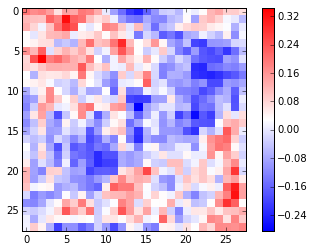

element 226


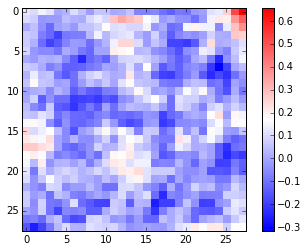

element 227


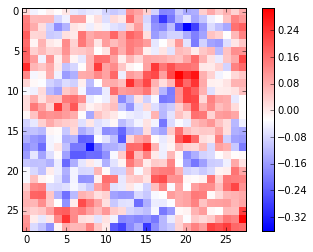

element 228


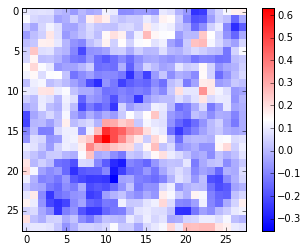

element 229


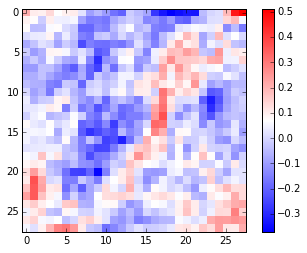

element 230


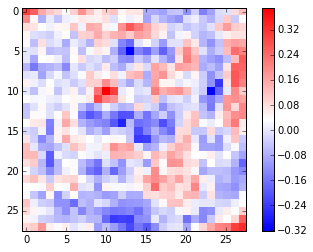

element 231


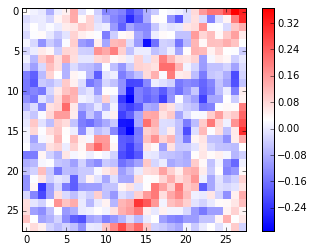

element 232


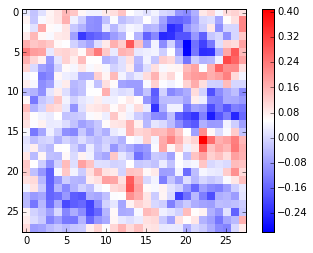

element 233


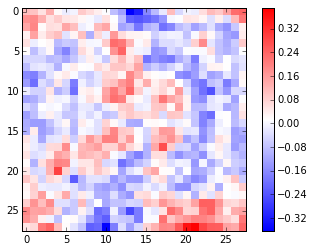

element 234


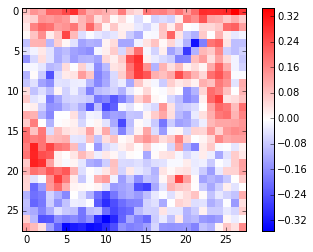

element 235


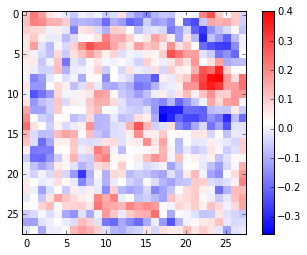

element 236


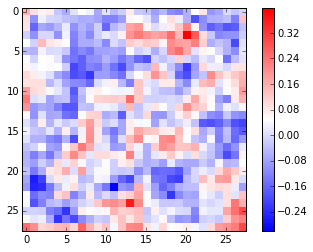

element 237


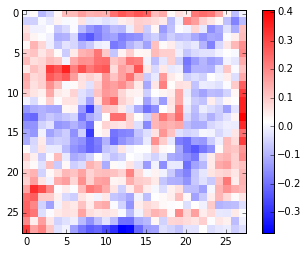

element 238


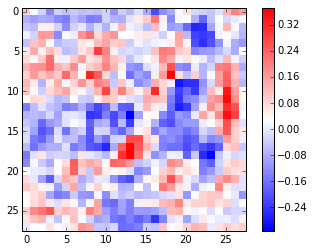

element 239


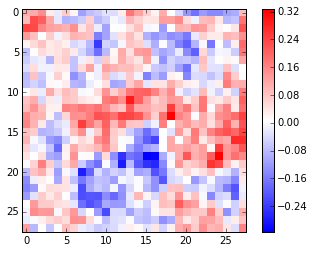

element 240


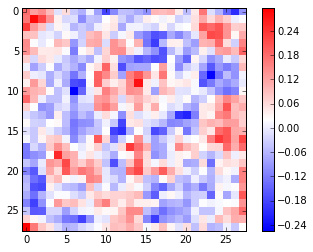

element 241


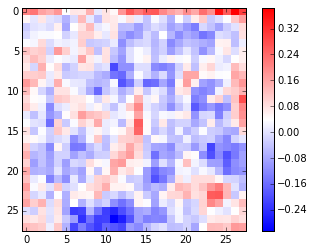

element 242


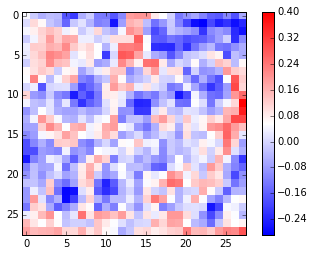

element 243


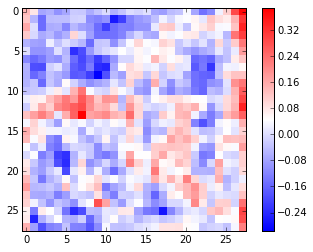

element 244


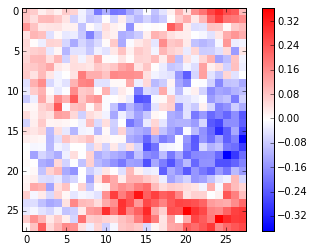

element 245


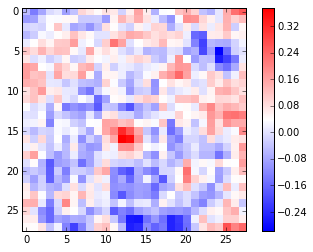

element 246


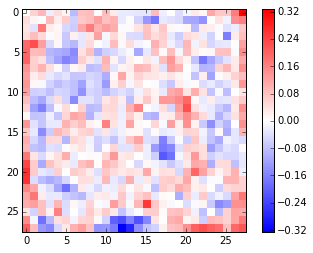

element 247


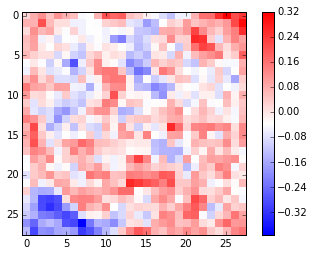

element 248


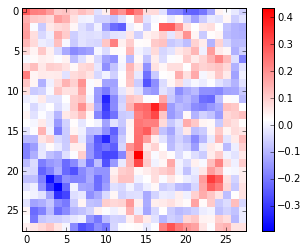

element 249


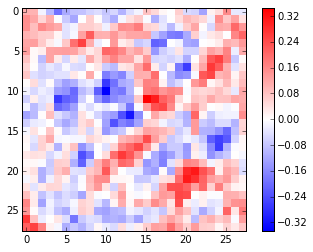

element 250


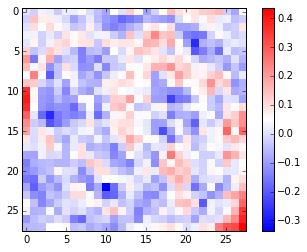

element 251


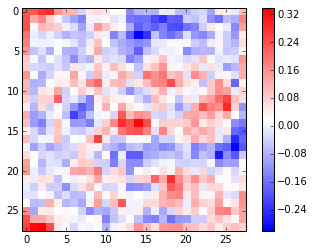

element 252


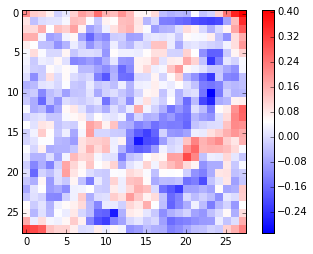

element 253


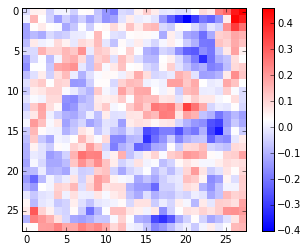

element 254


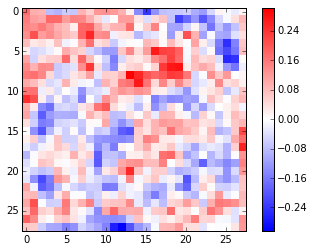

element 255


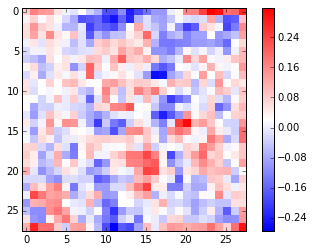

element 256


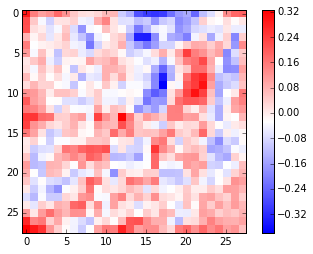

element 257


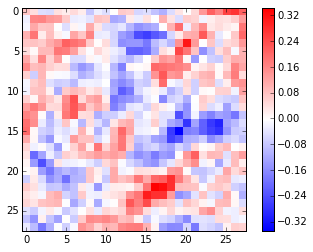

element 258


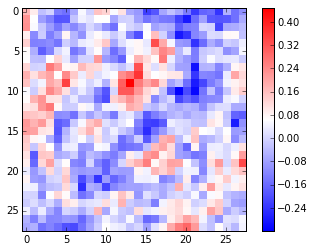

element 259


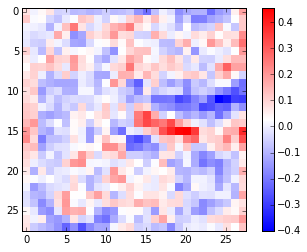

element 260


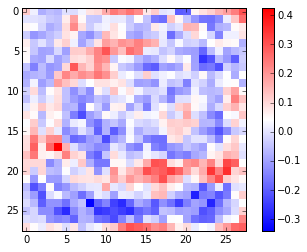

element 261


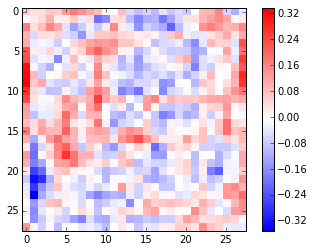

element 262


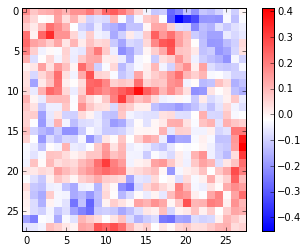

element 263


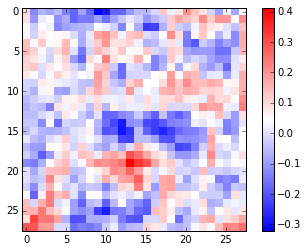

element 264


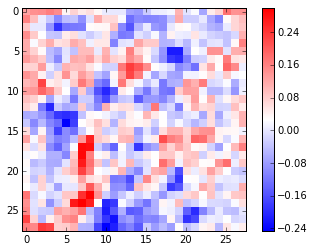

element 265


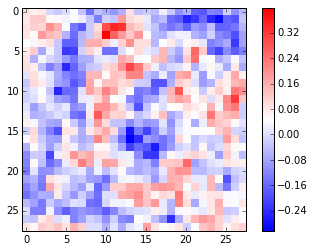

element 266


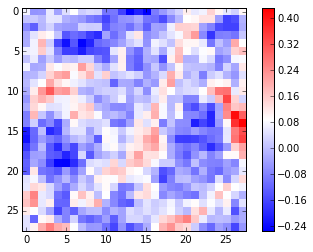

element 267


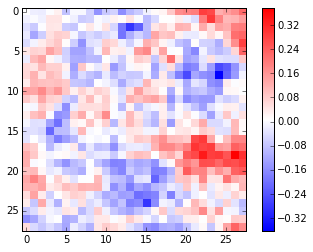

element 268


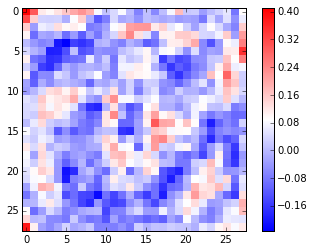

element 269


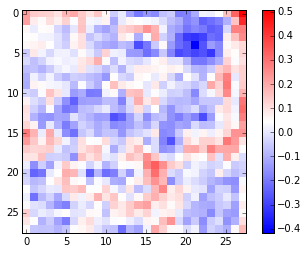

element 270


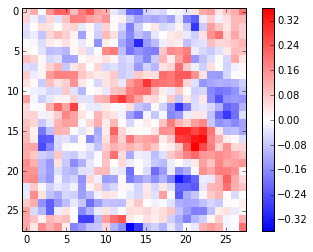

element 271


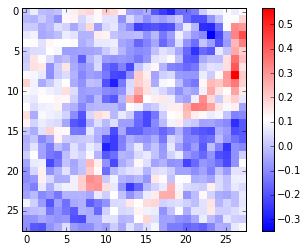

element 272


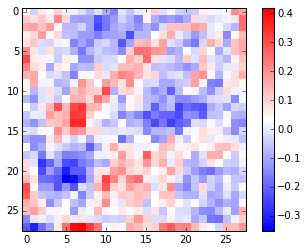

element 273


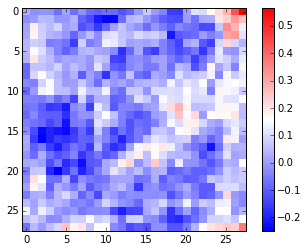

element 274


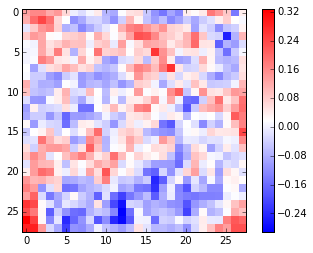

element 275


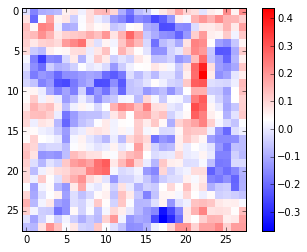

element 276


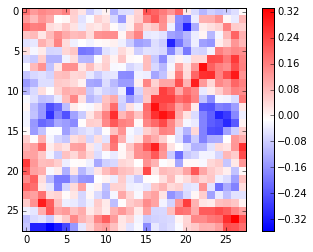

element 277


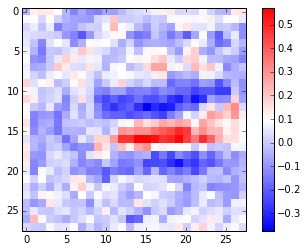

element 278


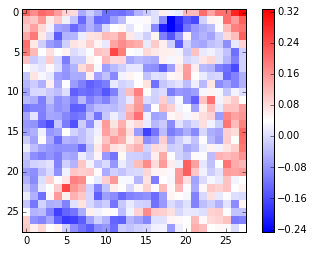

element 279


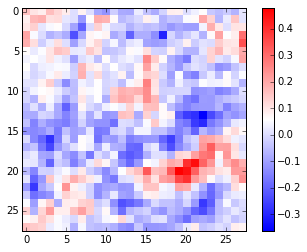

element 280


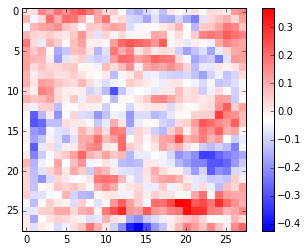

element 281


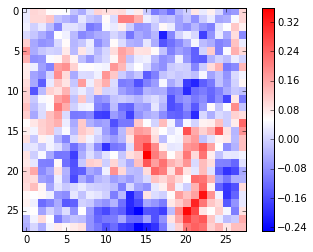

element 282


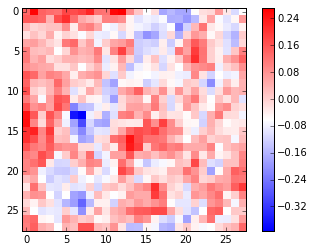

element 283


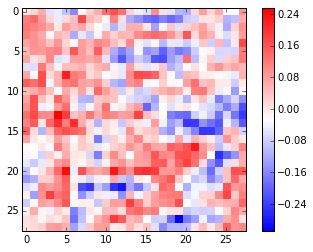

element 284


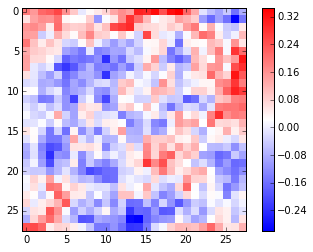

element 285


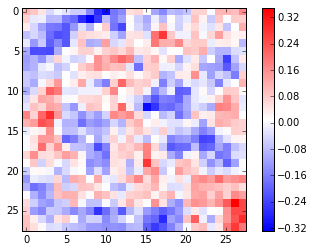

element 286


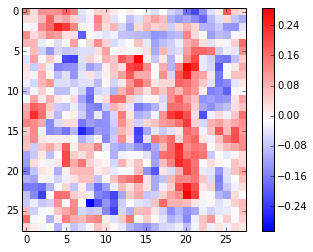

element 287


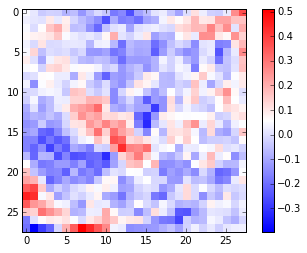

element 288


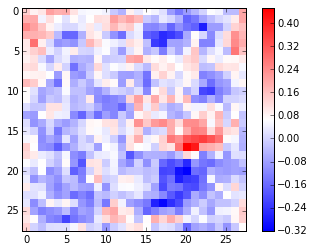

element 289


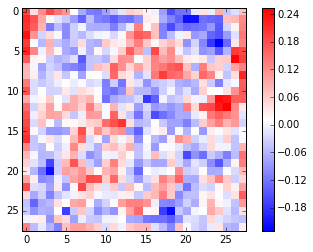

element 290


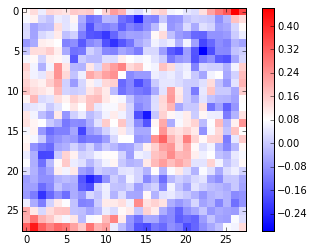

element 291


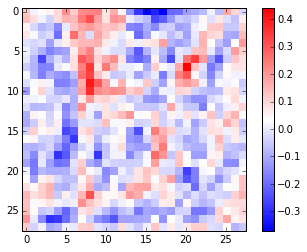

element 292


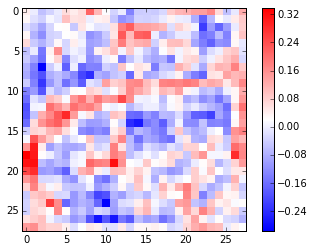

element 293


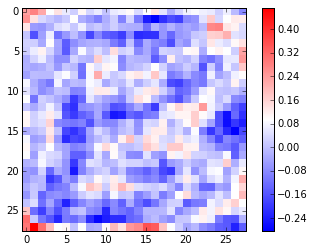

element 294


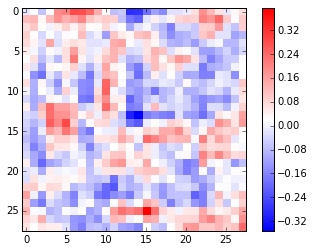

element 295


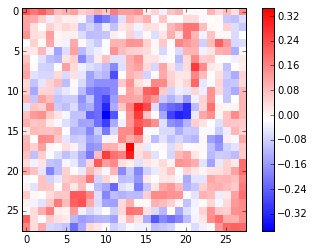

element 296


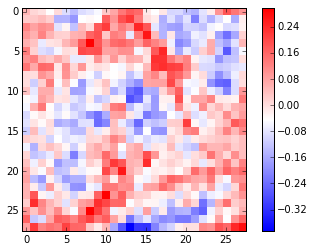

element 297


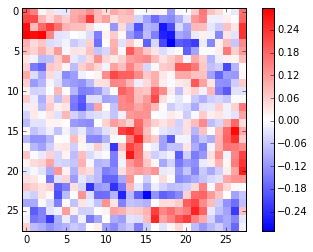

element 298


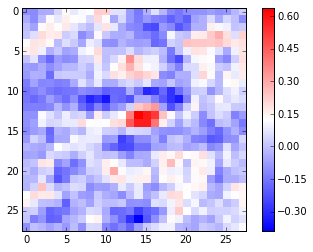

element 299


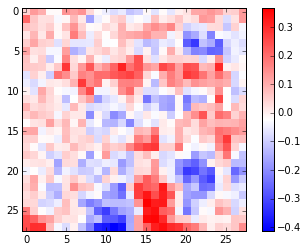

element 300


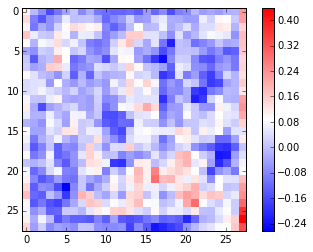

element 301


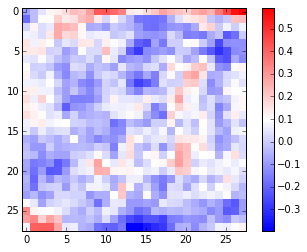

element 302


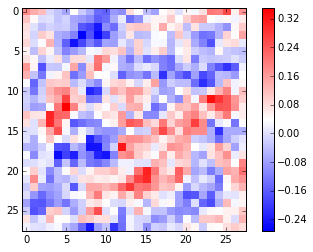

element 303


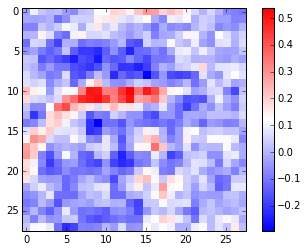

element 304


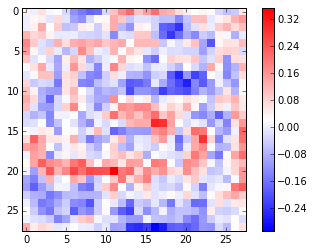

element 305


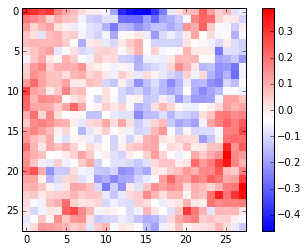

element 306


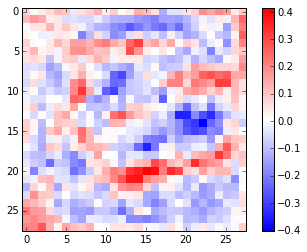

element 307


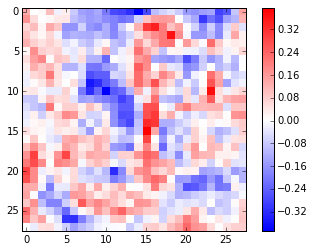

element 308


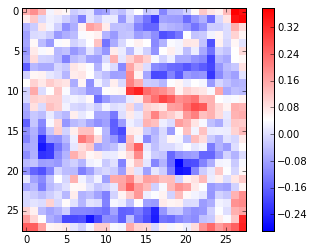

element 309


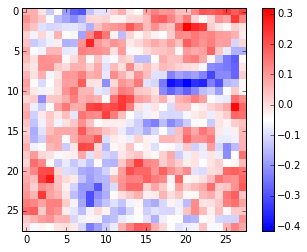

element 310


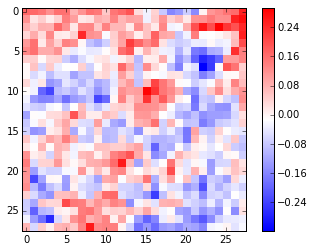

element 311


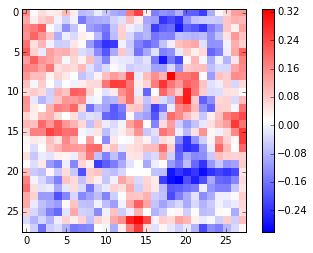

element 312


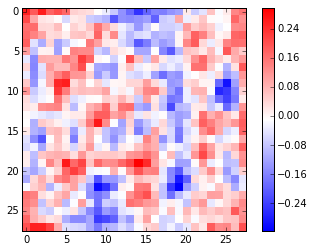

element 313


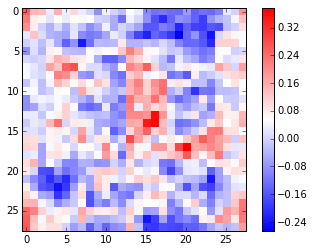

element 314


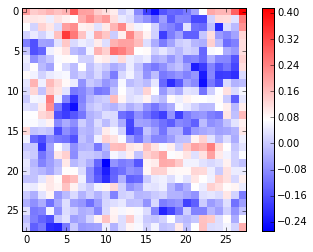

element 315


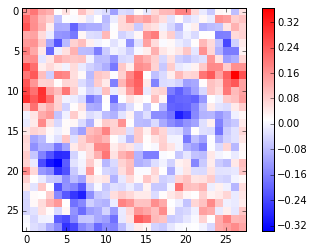

element 316


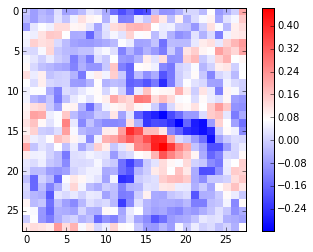

element 317


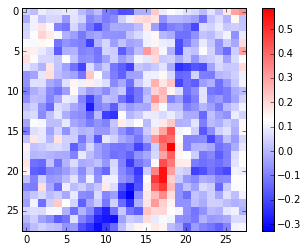

element 318


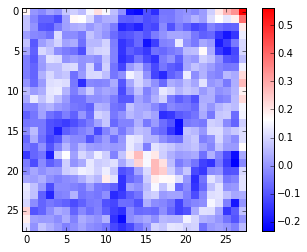

element 319


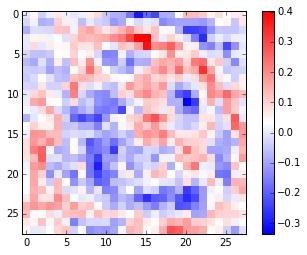

element 320


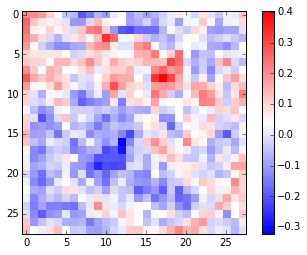

element 321


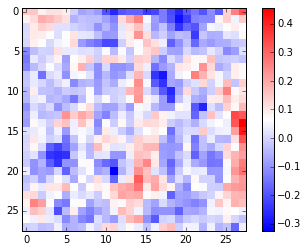

element 322


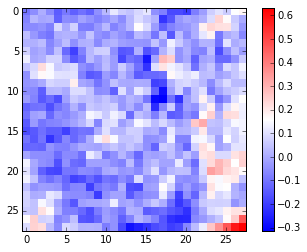

element 323


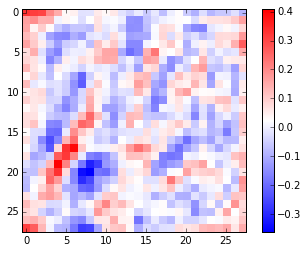

element 324


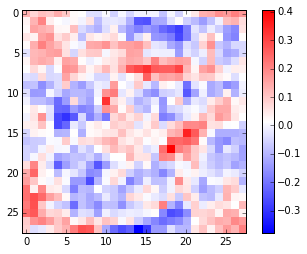

element 325


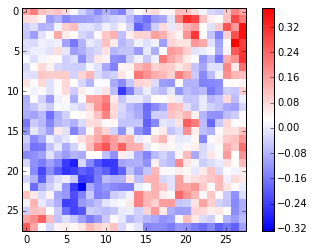

element 326


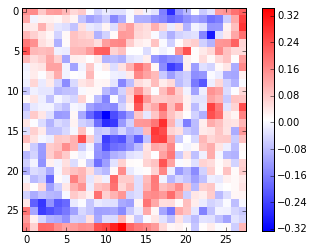

element 327


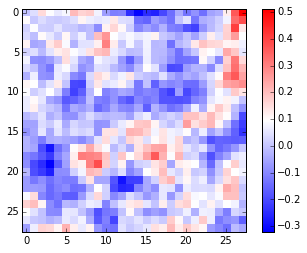

element 328


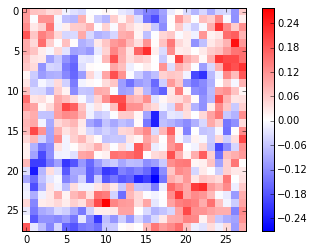

element 329


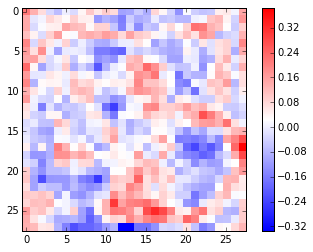

element 330


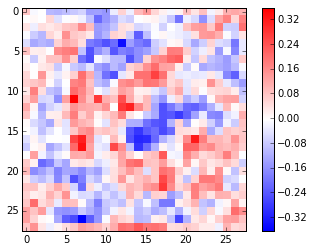

element 331


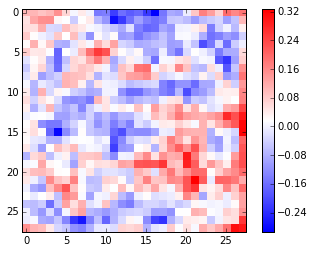

element 332


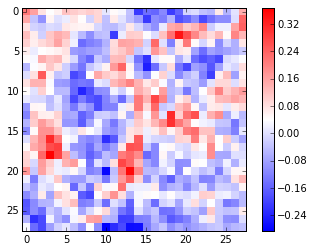

element 333


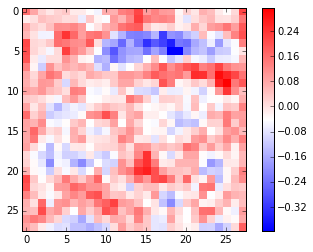

element 334


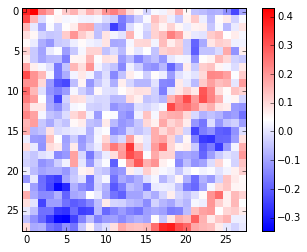

element 335


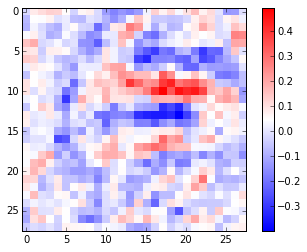

element 336


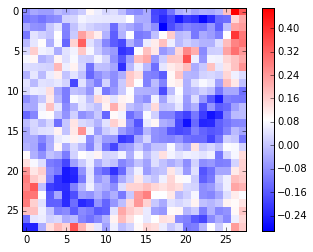

element 337


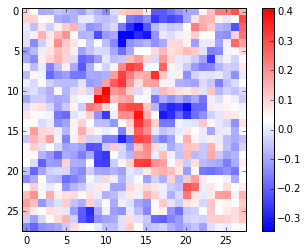

element 338


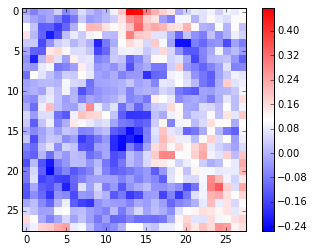

element 339


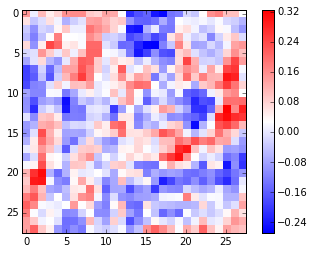

element 340


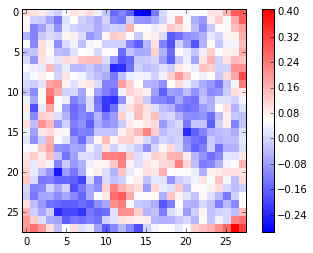

element 341


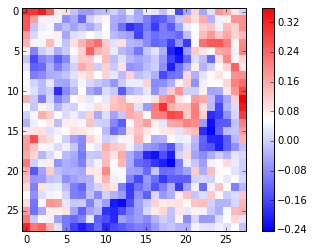

element 342


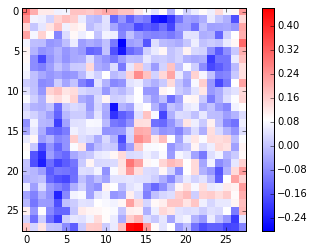

element 343


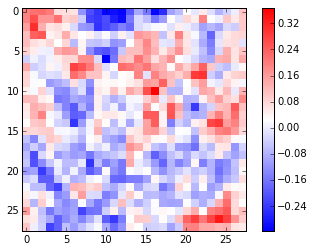

element 344


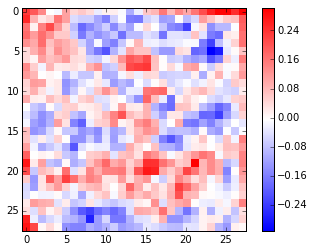

element 345


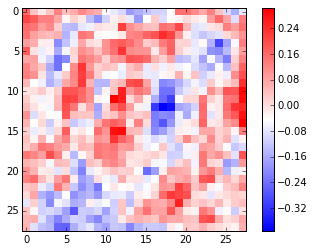

element 346


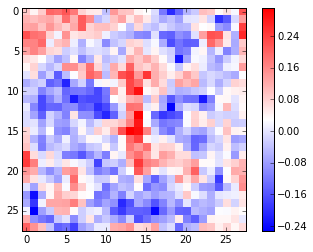

element 347


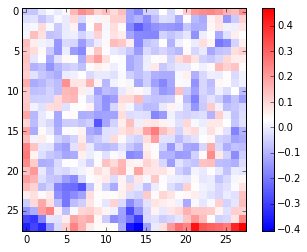

element 348


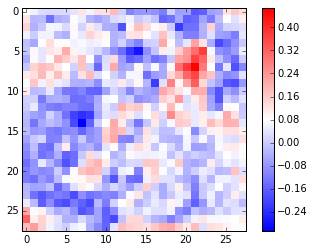

element 349


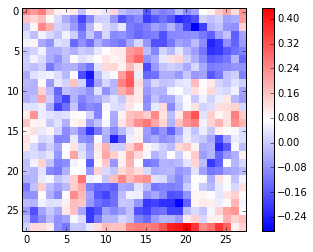

element 350


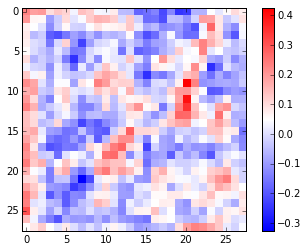

element 351


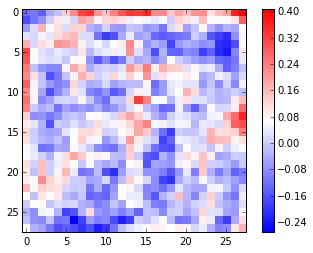

element 352


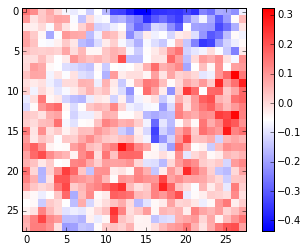

element 353


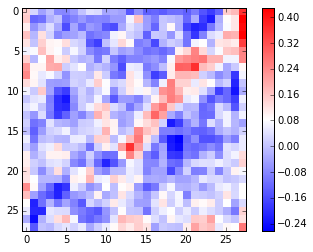

element 354


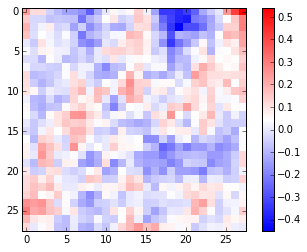

element 355


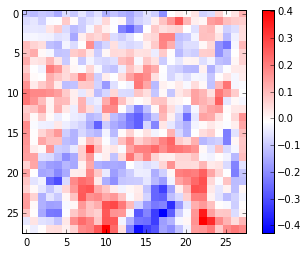

element 356


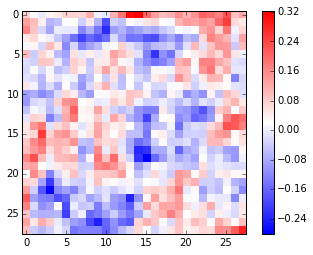

element 357


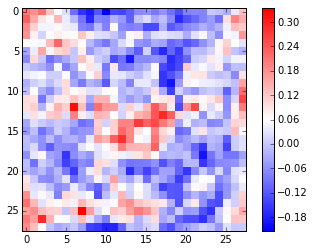

element 358


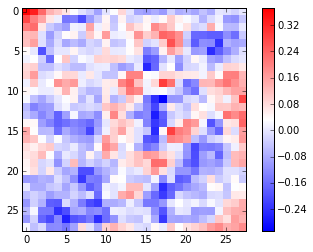

element 359


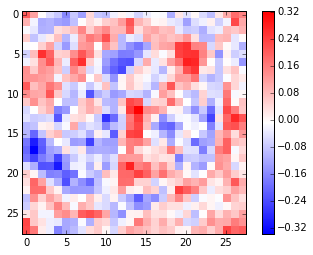

element 360


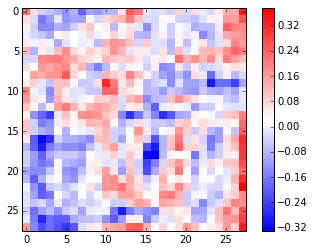

element 361


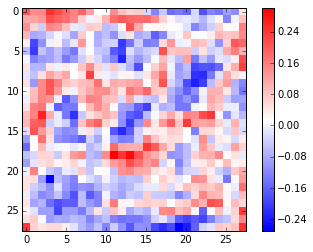

element 362


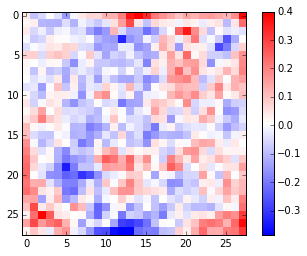

element 363


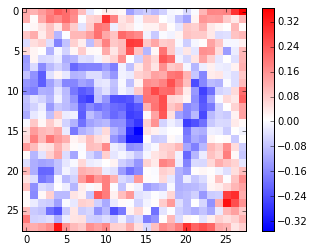

element 364


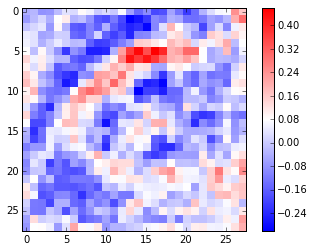

element 365


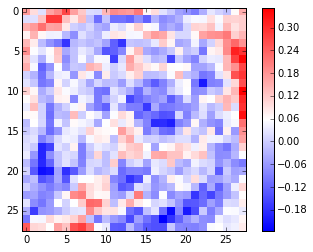

element 366


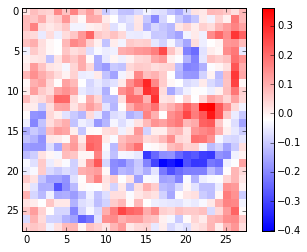

element 367


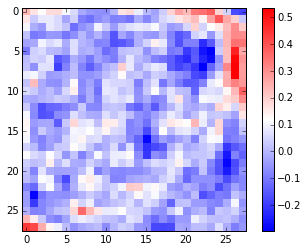

element 368


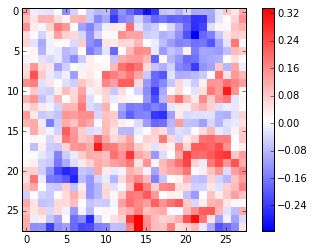

element 369


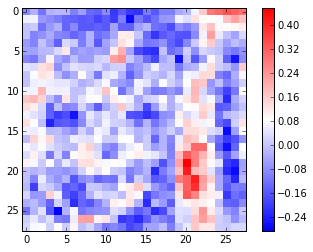

element 370


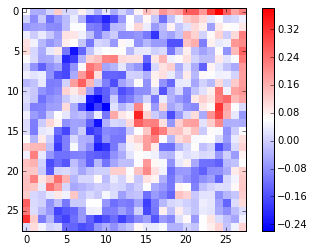

element 371


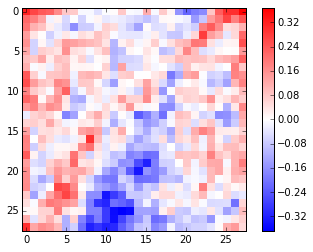

element 372


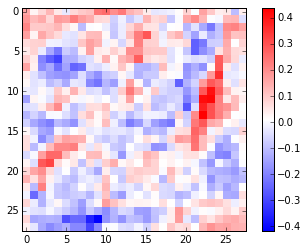

element 373


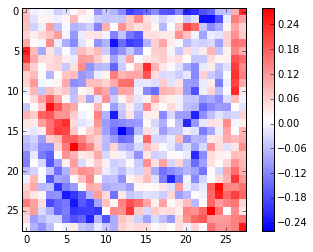

element 374


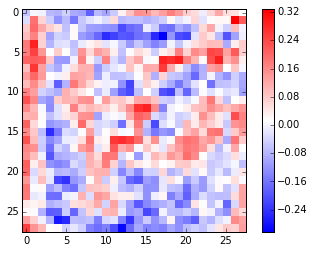

element 375


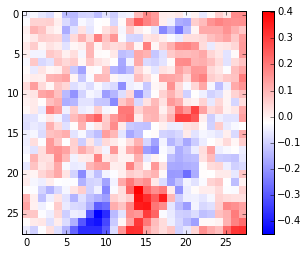

element 376


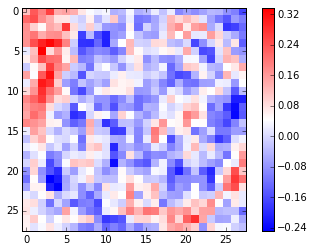

element 377


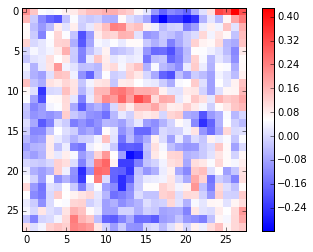

element 378


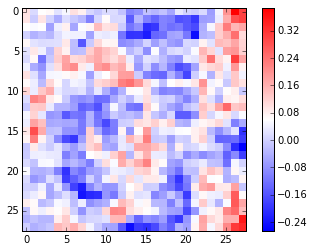

element 379


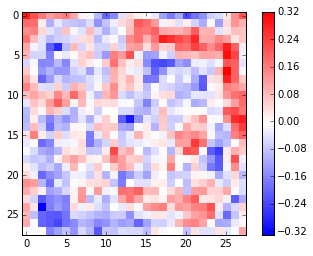

element 380


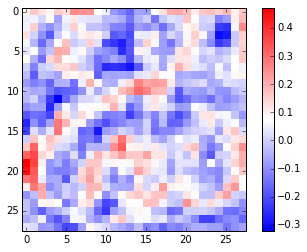

element 381


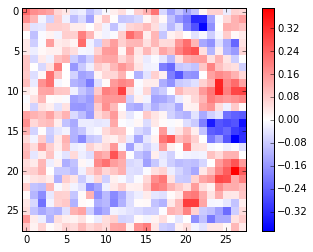

element 382


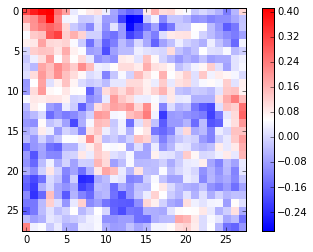

element 383


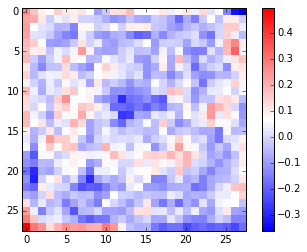

element 384


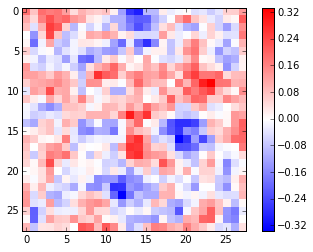

element 385


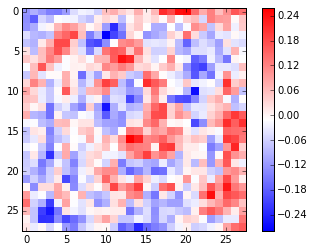

element 386


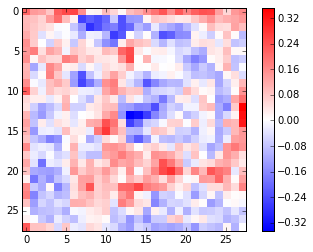

element 387


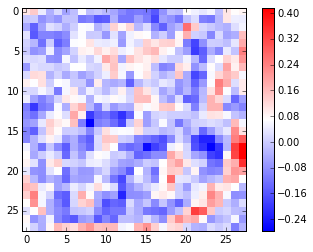

element 388


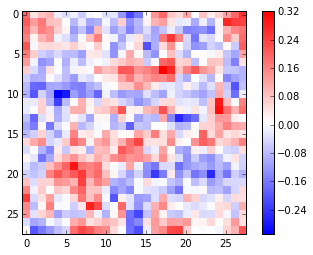

element 389


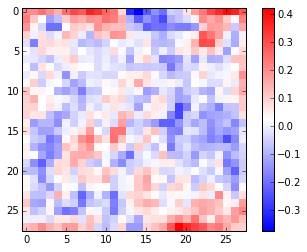

element 390


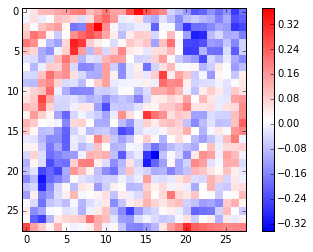

element 391


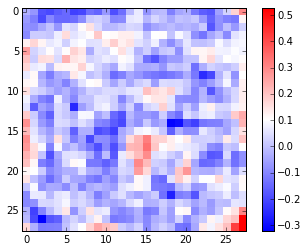

element 392


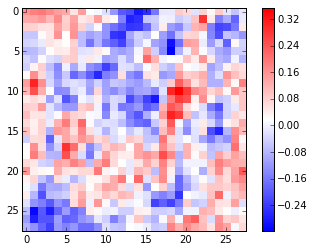

element 393


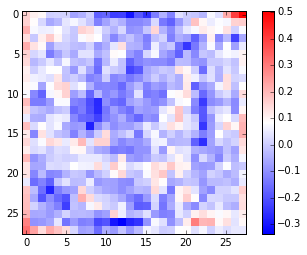

element 394


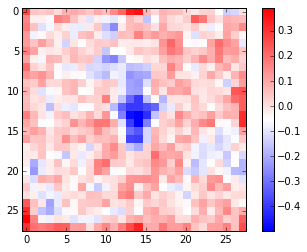

element 395


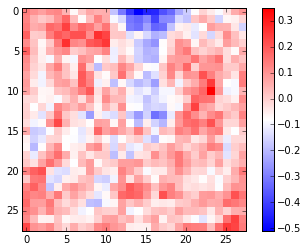

element 396


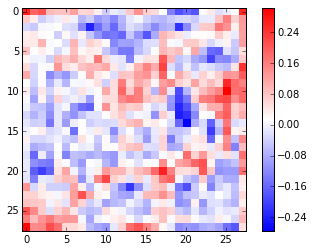

element 397


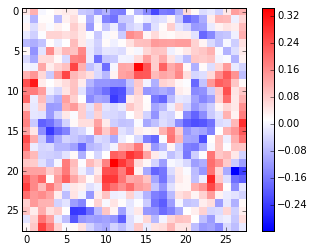

element 398


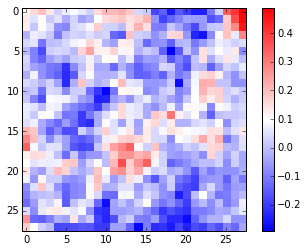

element 399


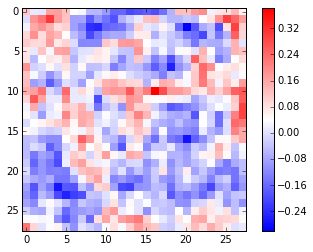

element 400


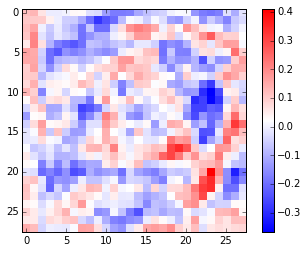

element 401


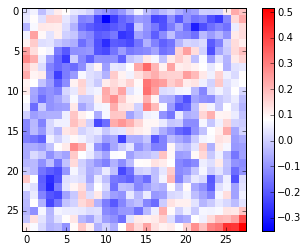

element 402


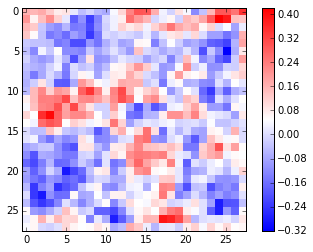

element 403


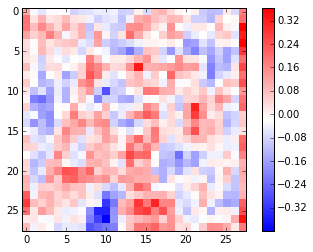

element 404


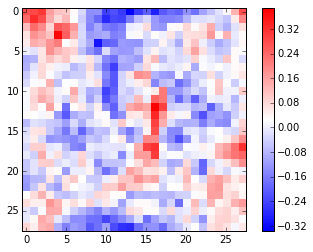

element 405


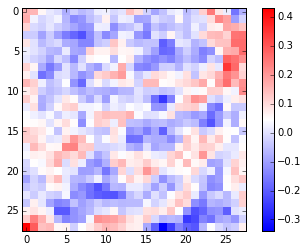

element 406


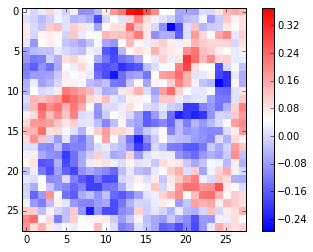

element 407


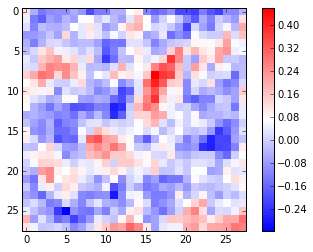

element 408


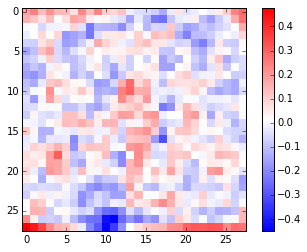

element 409


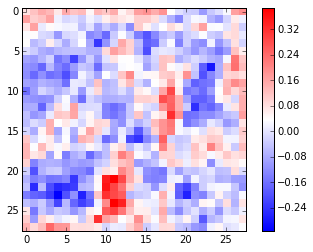

element 410


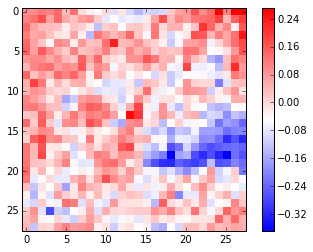

element 411


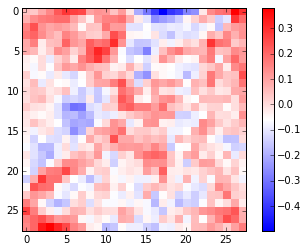

element 412


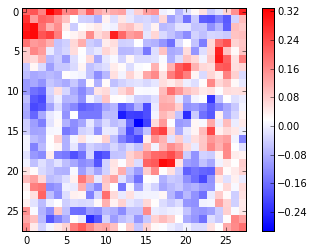

element 413


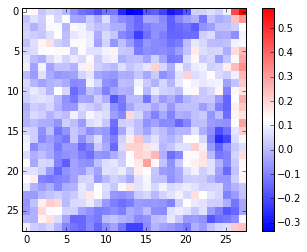

element 414


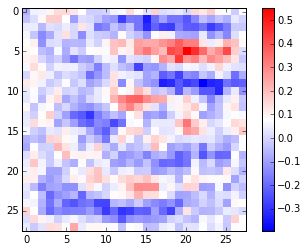

element 415


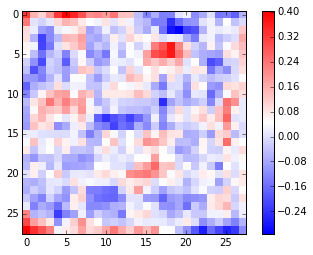

element 416


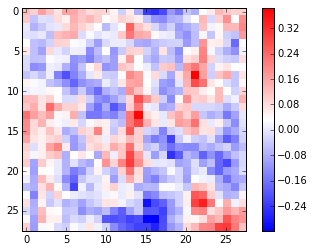

element 417


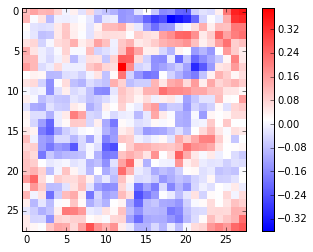

element 418


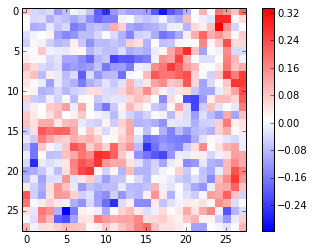

element 419


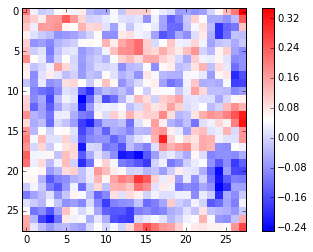

element 420


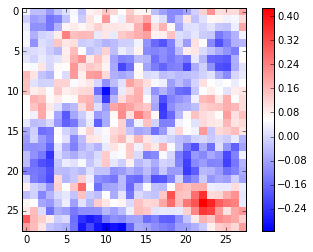

element 421


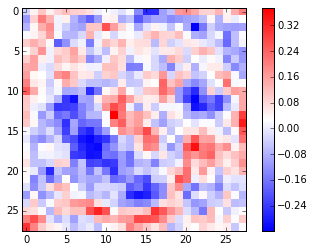

element 422


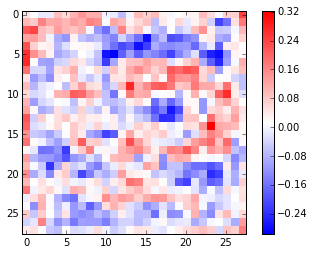

element 423


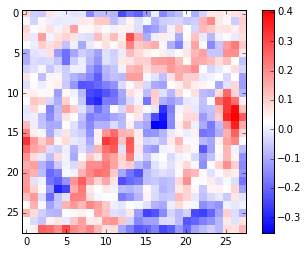

element 424


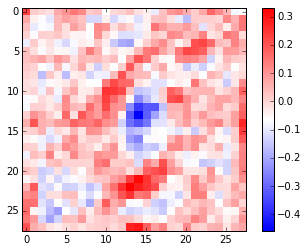

element 425


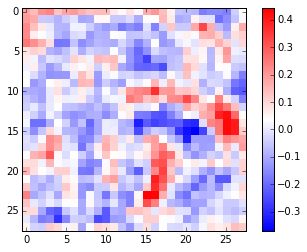

element 426


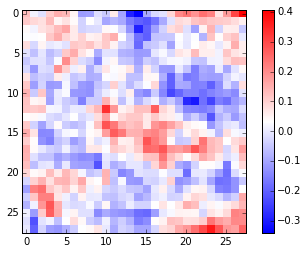

element 427


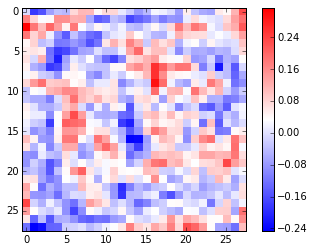

element 428


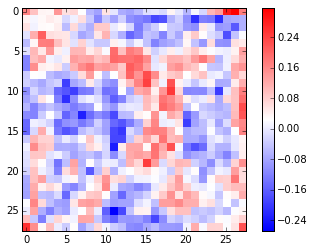

element 429


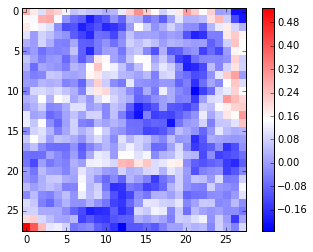

element 430


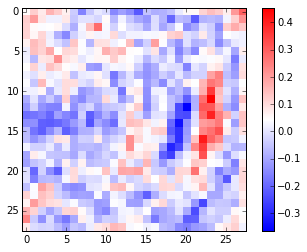

element 431


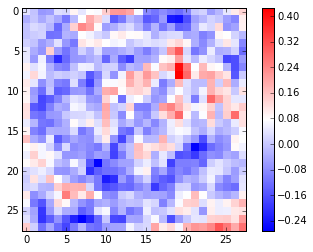

element 432


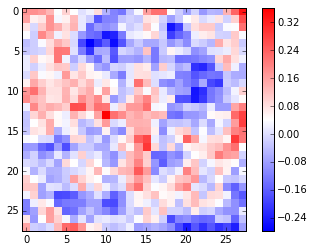

element 433


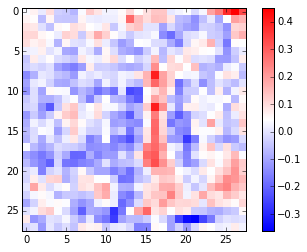

element 434


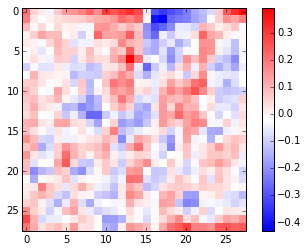

element 435


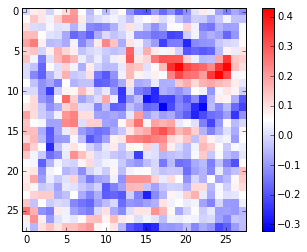

element 436


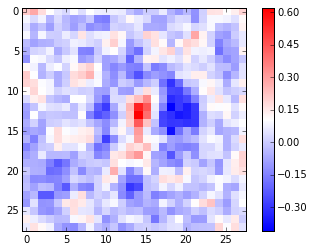

element 437


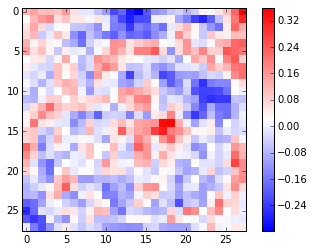

element 438


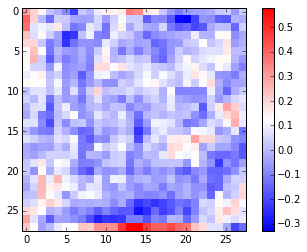

element 439


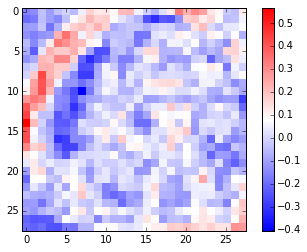

element 440


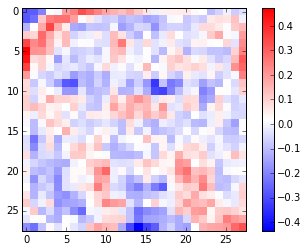

element 441


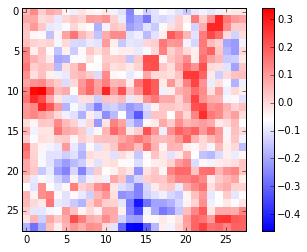

element 442


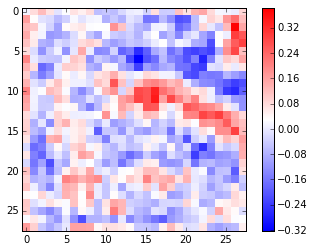

element 443


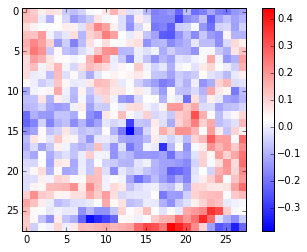

element 444


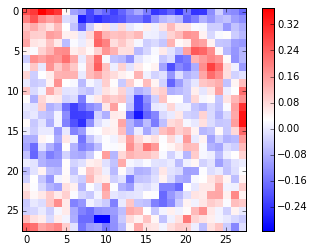

element 445


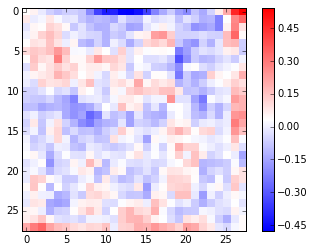

element 446


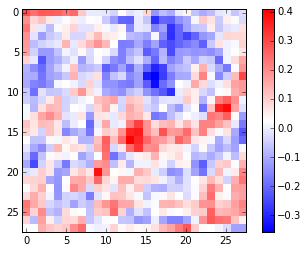

element 447


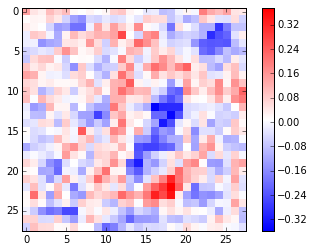

element 448


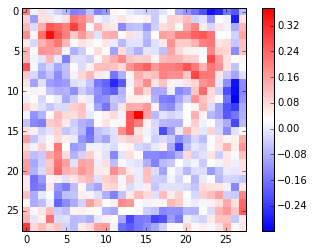

element 449


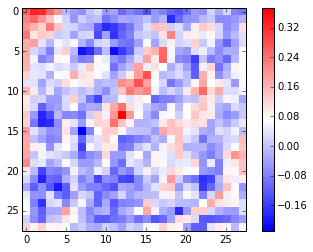

element 450


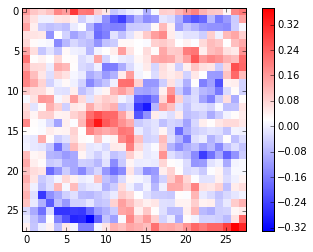

element 451


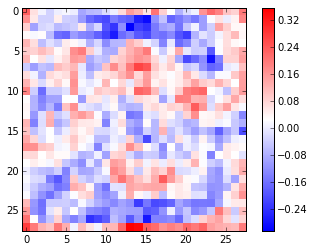

element 452


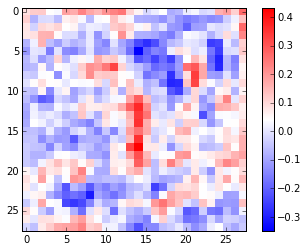

element 453


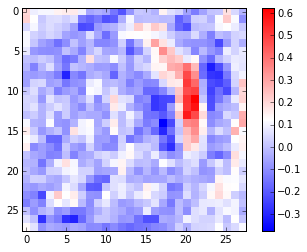

element 454


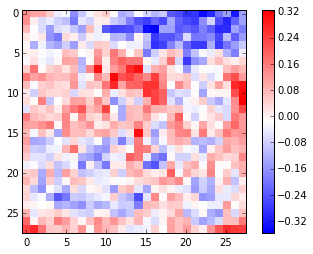

element 455


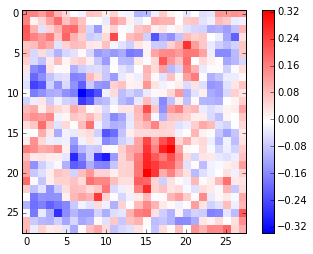

element 456


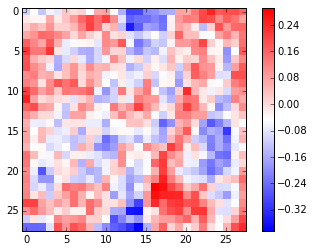

element 457


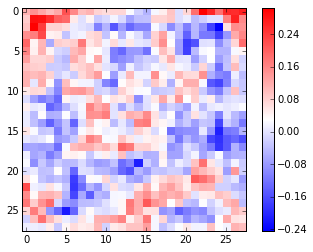

element 458


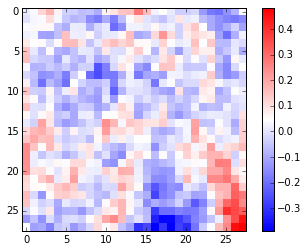

element 459


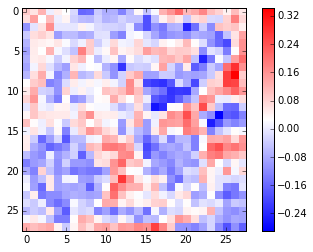

element 460


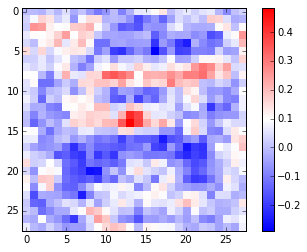

element 461


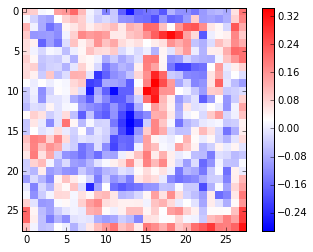

element 462


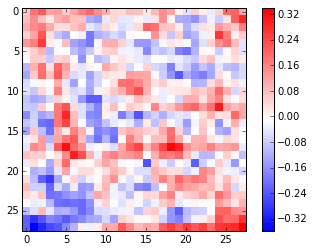

element 463


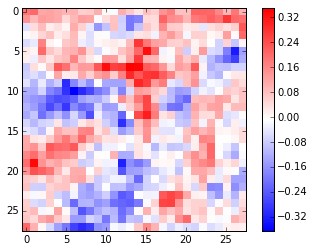

element 464


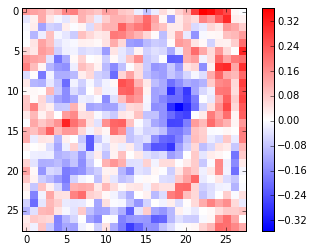

element 465


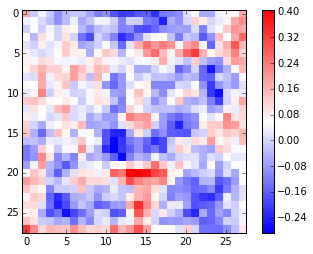

element 466


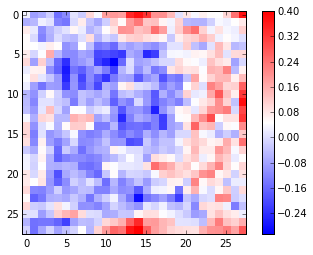

element 467


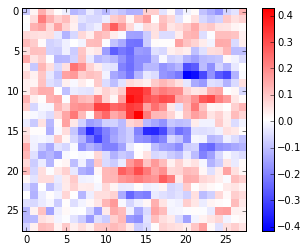

element 468


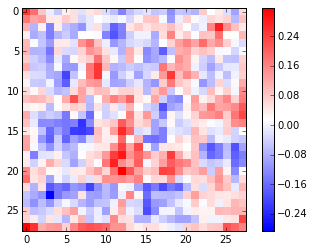

element 469


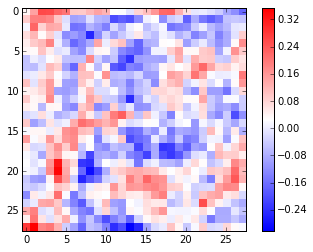

element 470


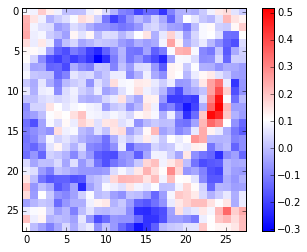

element 471


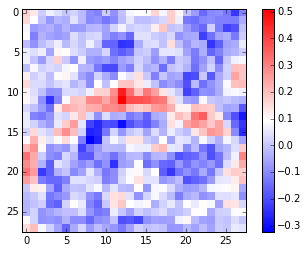

element 472


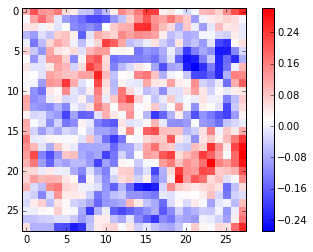

element 473


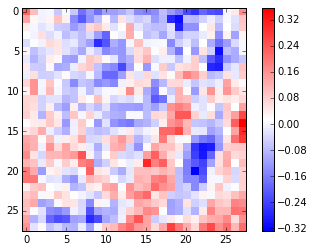

element 474


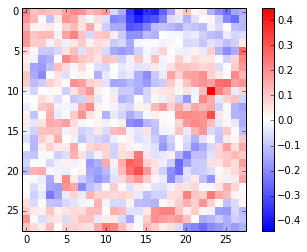

element 475


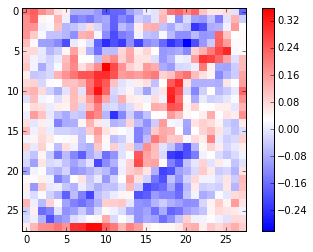

element 476


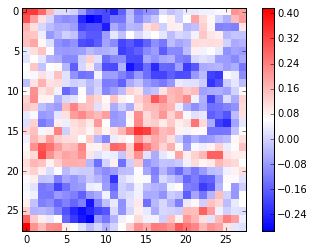

element 477


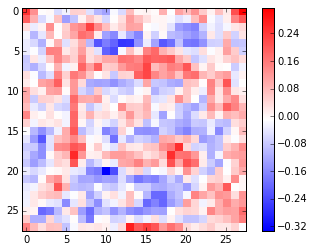

element 478


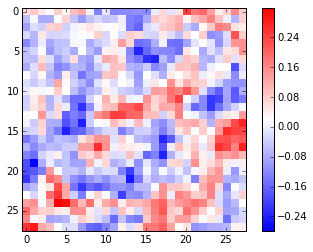

element 479


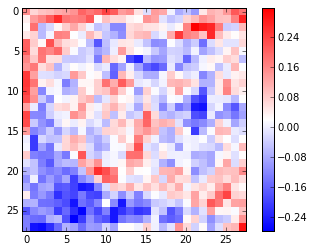

element 480


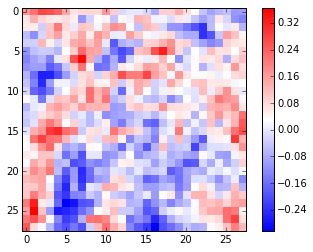

element 481


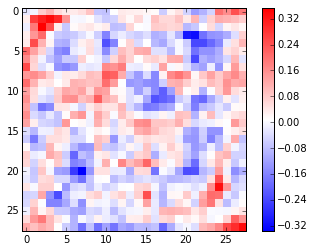

element 482


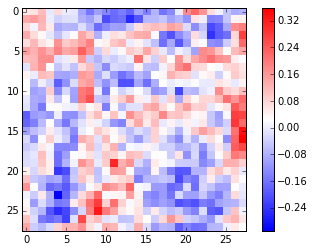

element 483


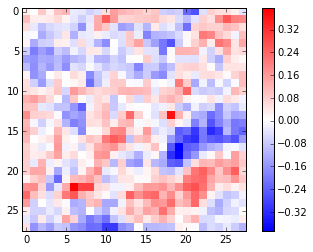

element 484


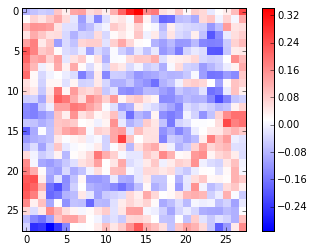

element 485


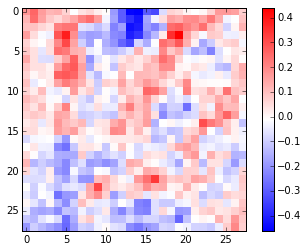

element 486


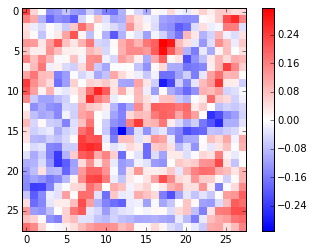

element 487


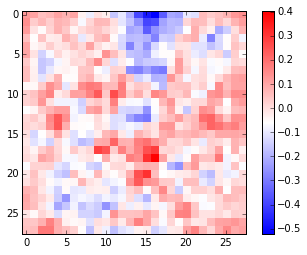

element 488


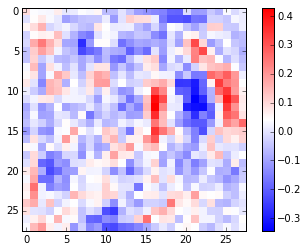

element 489


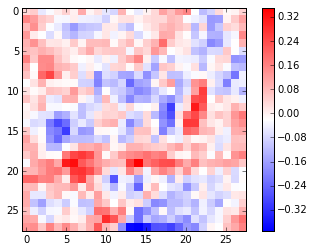

element 490


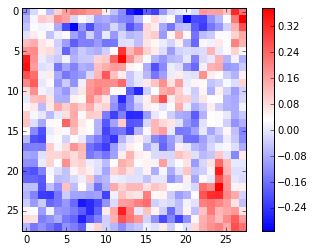

element 491


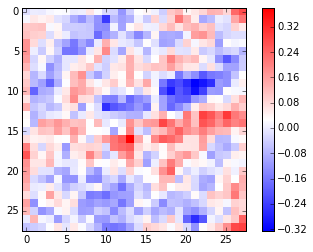

element 492


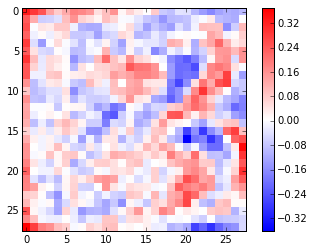

element 493


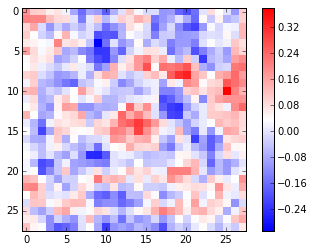

element 494


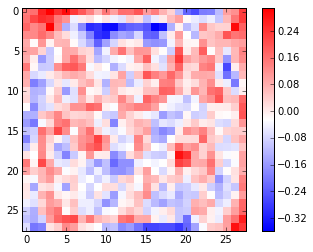

element 495


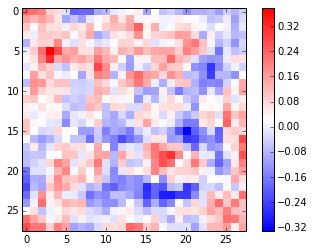

element 496


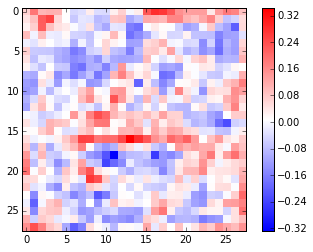

element 497


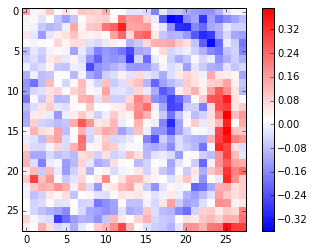

element 498


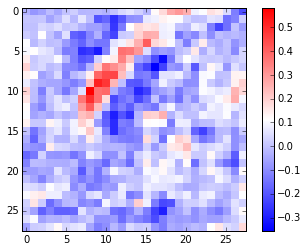

element 499


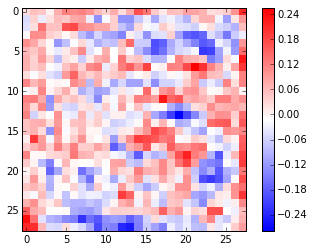

element 500


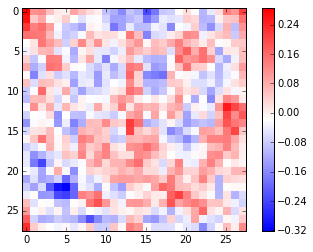

element 501


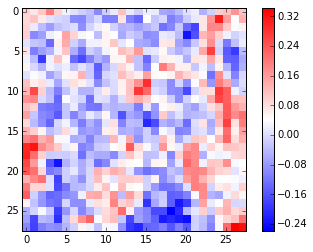

element 502


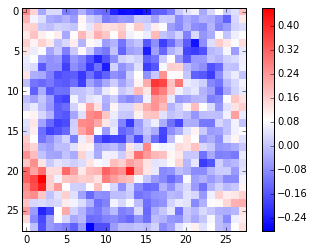

element 503


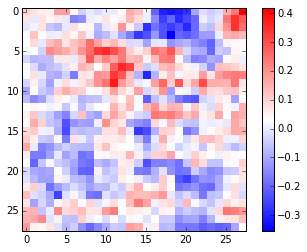

element 504


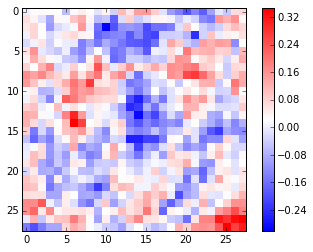

element 505


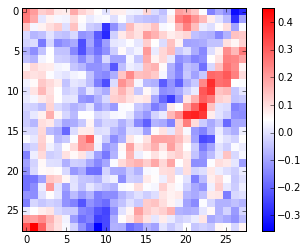

element 506


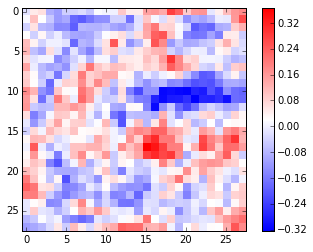

element 507


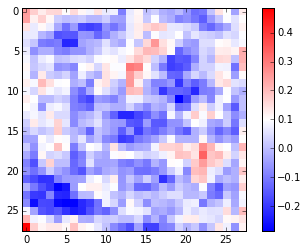

element 508


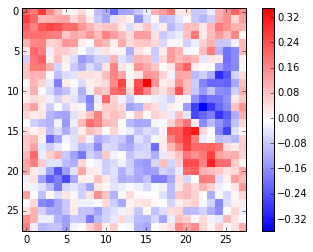

element 509


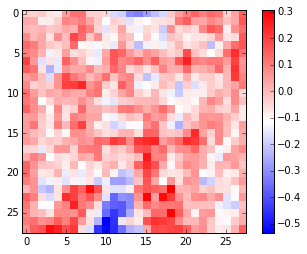

element 510


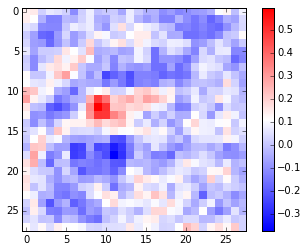

element 511


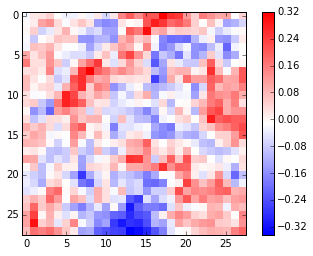

element 512


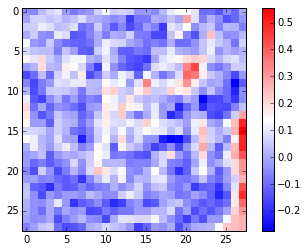

element 513


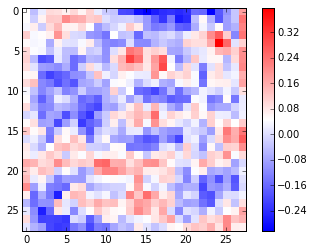

element 514


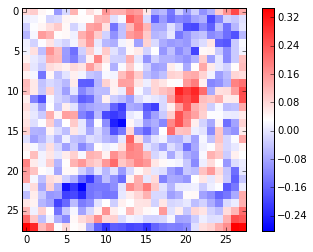

element 515


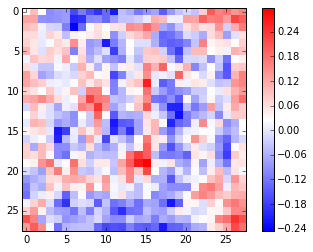

element 516


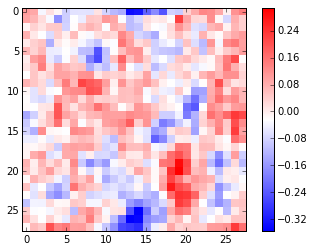

element 517


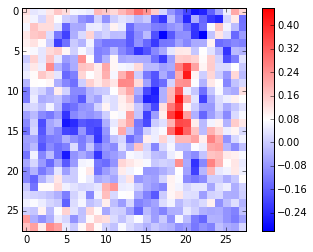

element 518


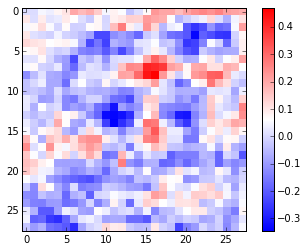

element 519


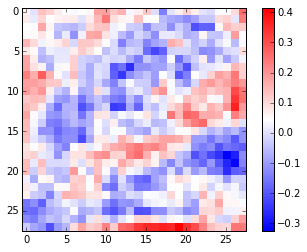

element 520


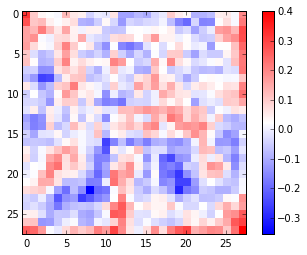

element 521


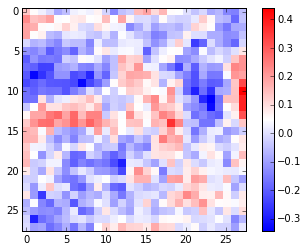

element 522


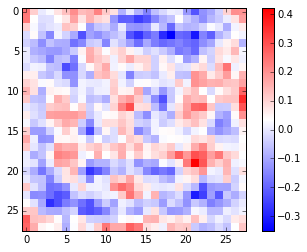

element 523


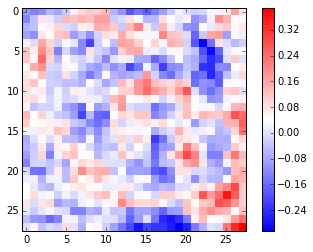

element 524


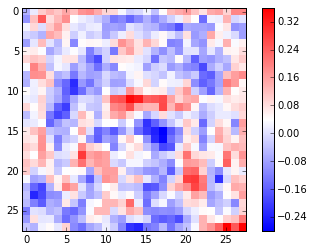

element 525


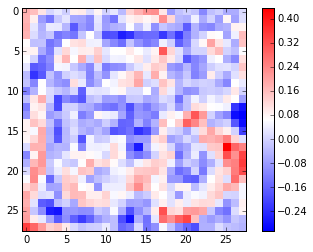

element 526


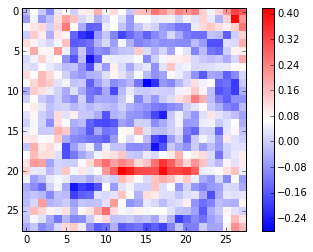

element 527


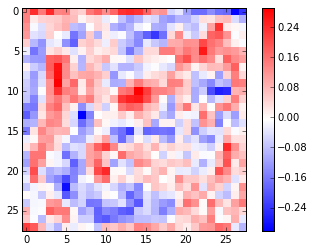

element 528


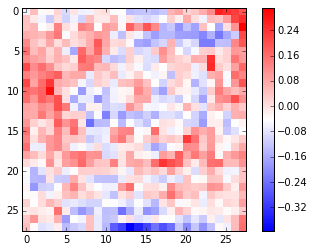

element 529


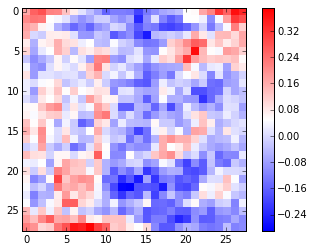

element 530


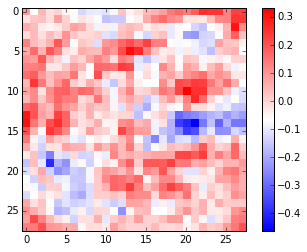

element 531


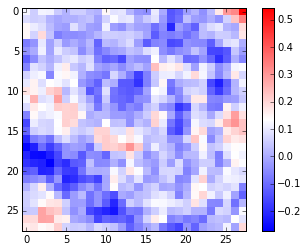

element 532


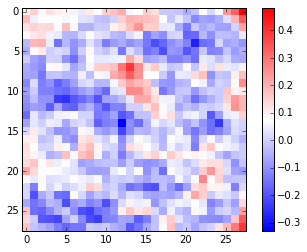

element 533


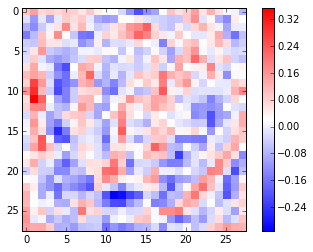

element 534


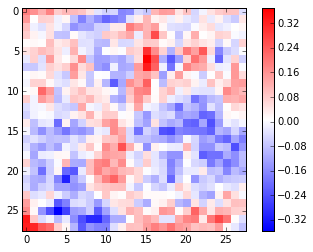

element 535


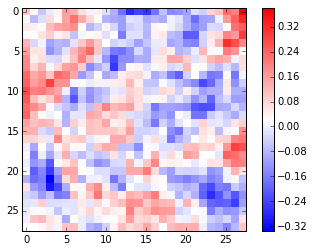

element 536


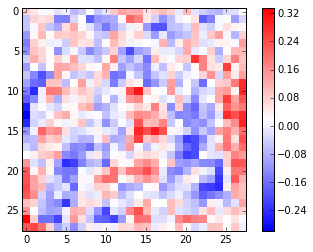

element 537


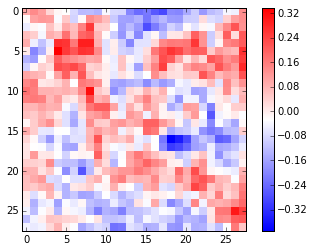

element 538


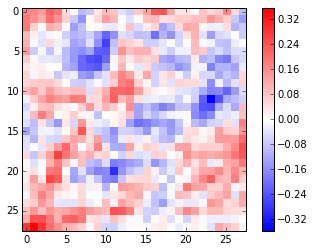

element 539


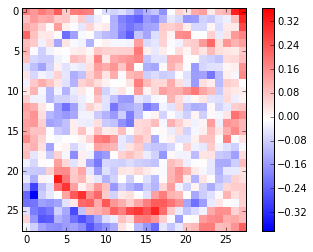

element 540


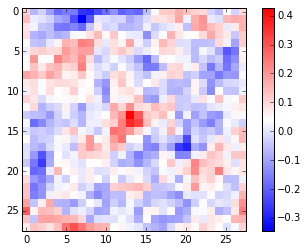

element 541


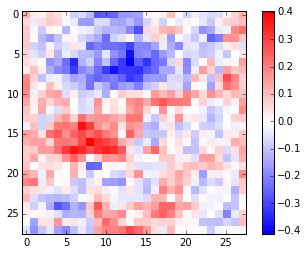

element 542


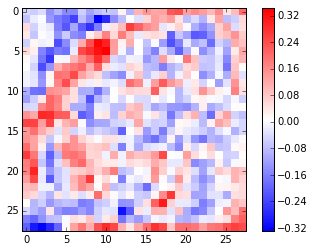

element 543


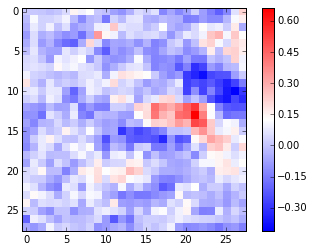

element 544


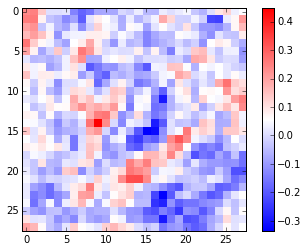

element 545


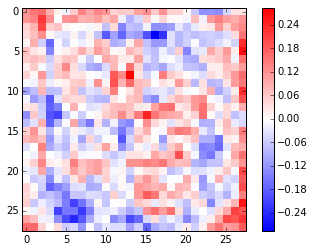

element 546


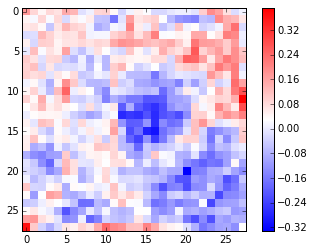

element 547


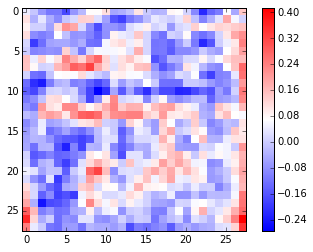

element 548


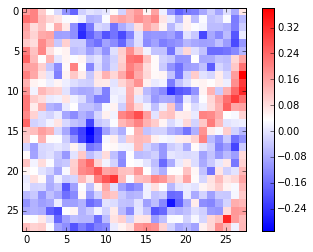

element 549


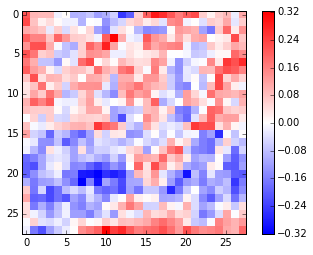

element 550


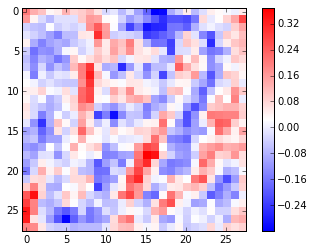

element 551


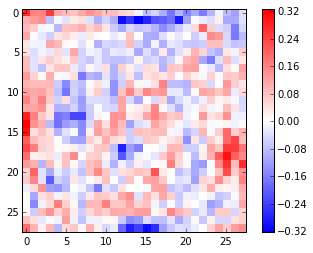

element 552


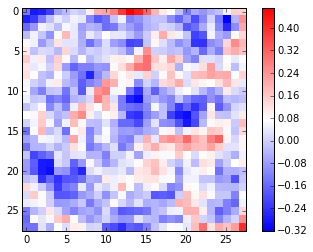

element 553


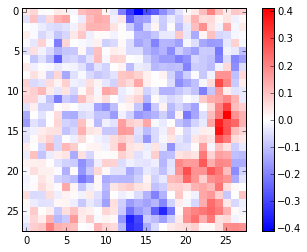

element 554


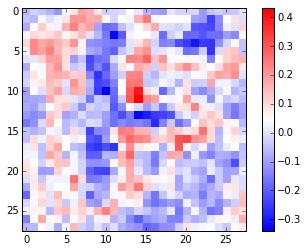

element 555


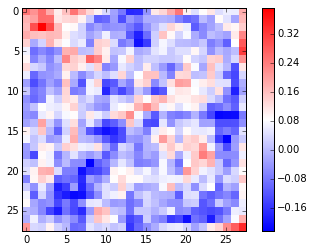

element 556


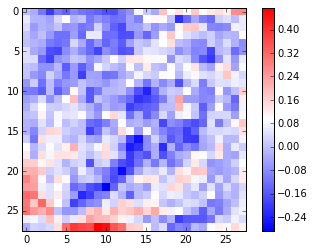

element 557


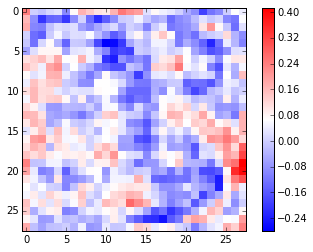

element 558


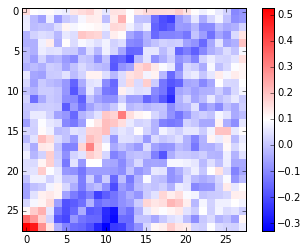

element 559


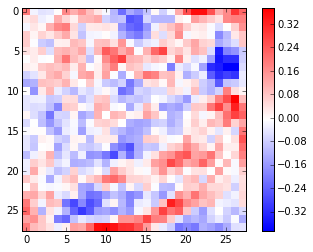

element 560


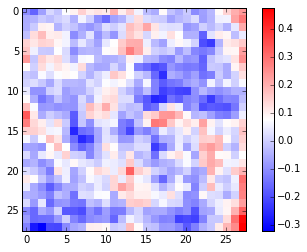

element 561


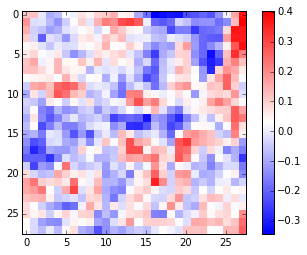

element 562


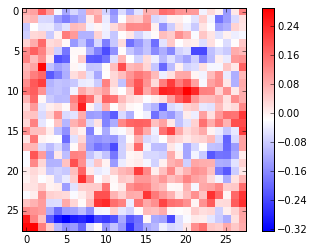

element 563


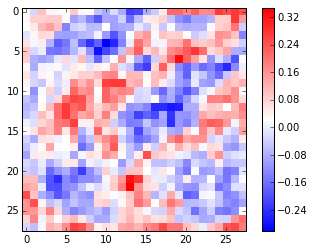

element 564


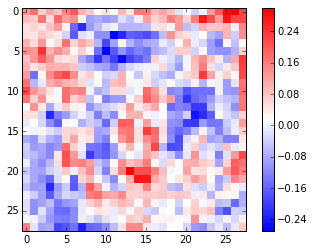

element 565


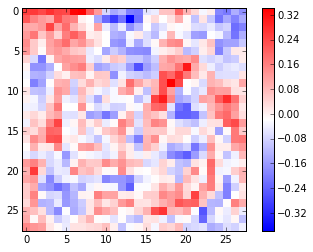

element 566


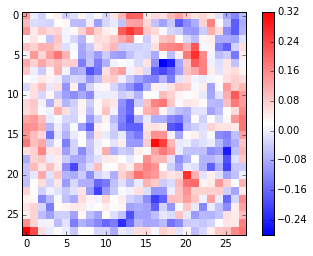

element 567


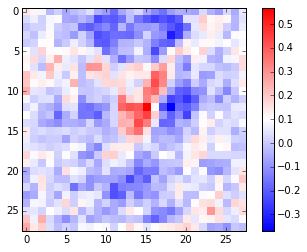

element 568


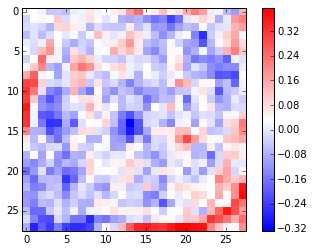

element 569


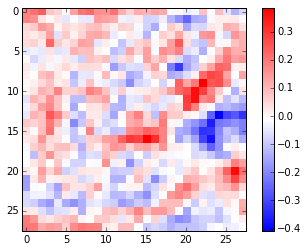

element 570


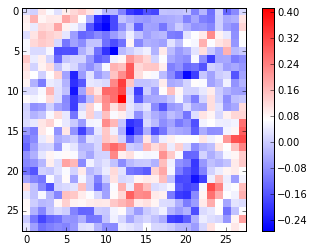

element 571


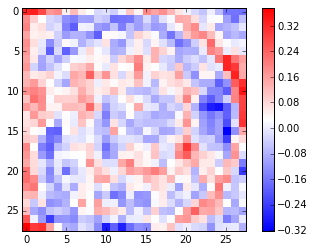

element 572


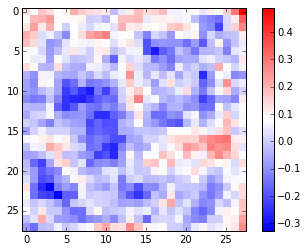

element 573


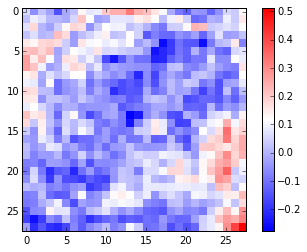

element 574


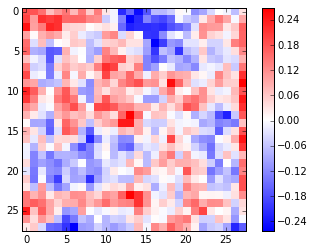

element 575


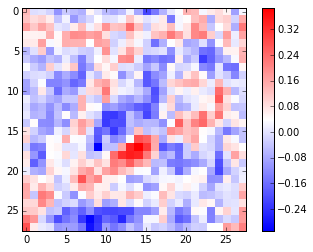

element 576


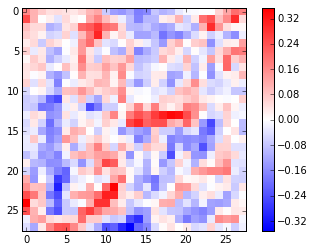

element 577


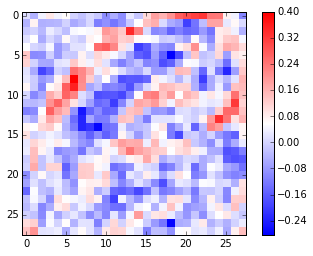

element 578


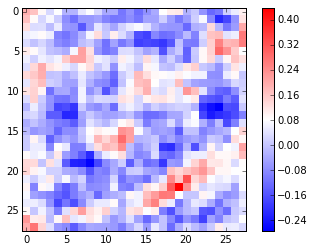

element 579


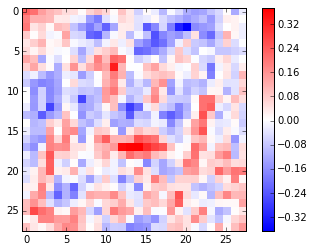

element 580


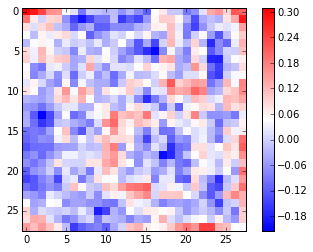

element 581


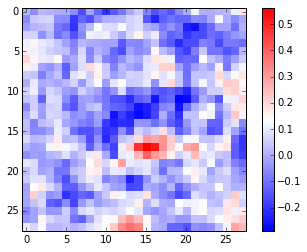

element 582


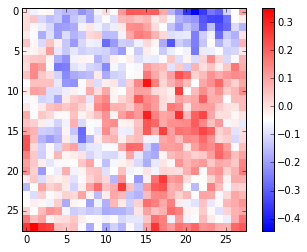

element 583


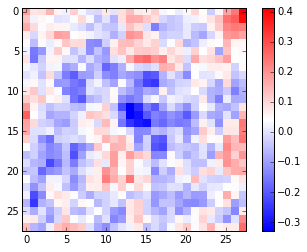

element 584


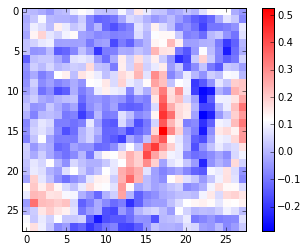

element 585


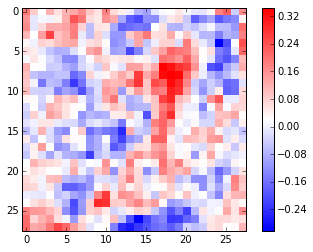

element 586


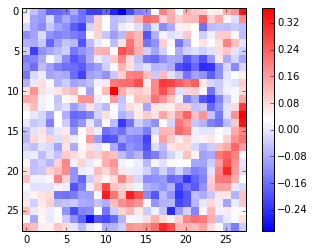

element 587


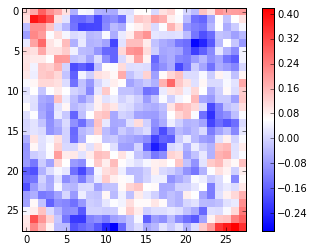

element 588


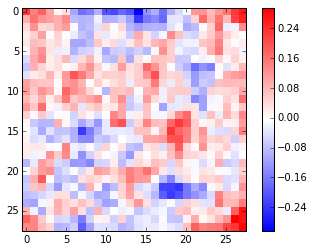

element 589


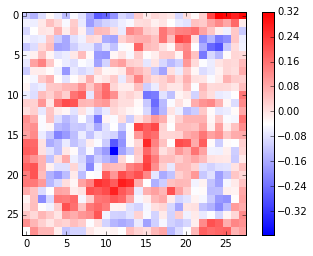

element 590


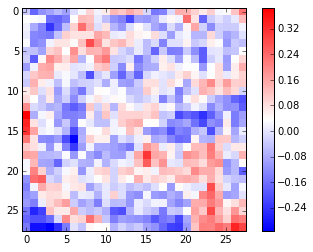

element 591


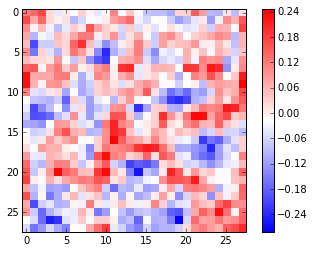

element 592


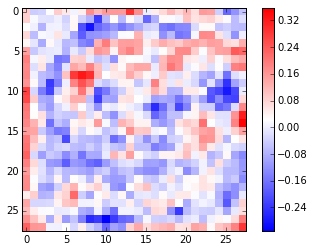

element 593


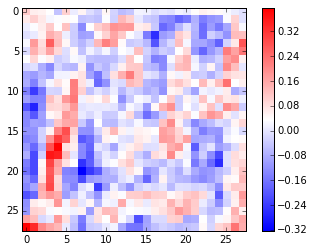

element 594


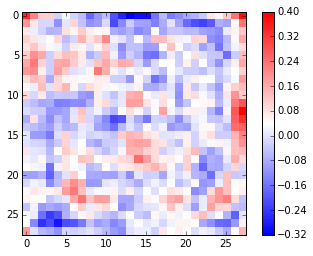

element 595


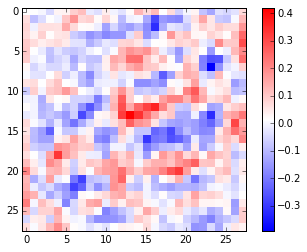

element 596


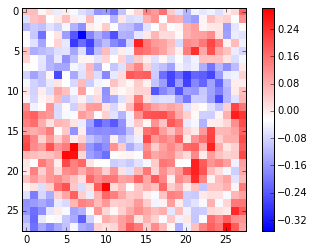

element 597


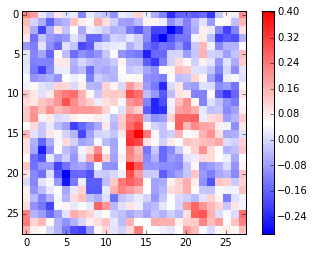

element 598


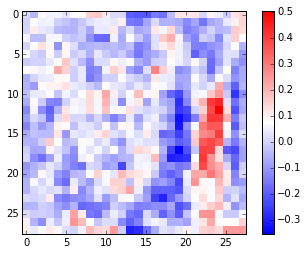

element 599


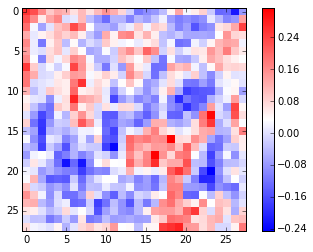

element 600


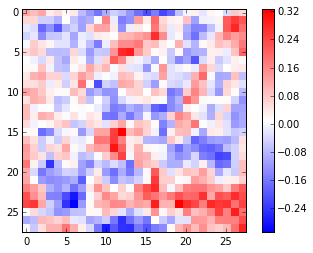

element 601


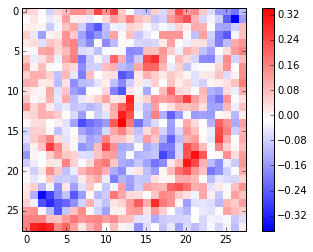

element 602


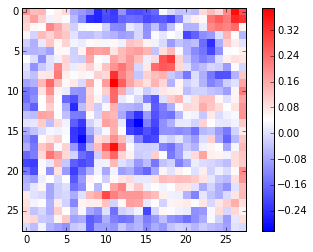

element 603


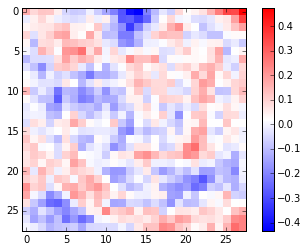

element 604


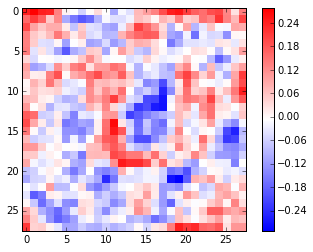

element 605


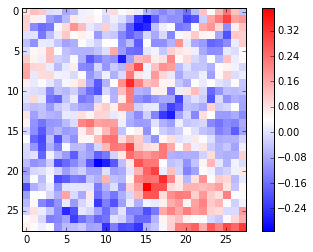

element 606


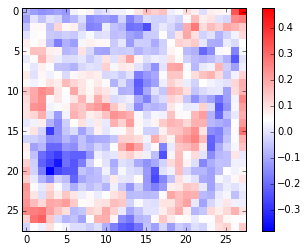

element 607


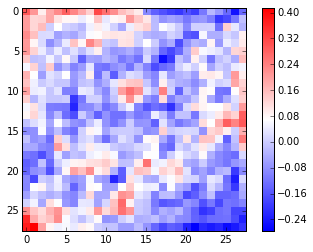

element 608


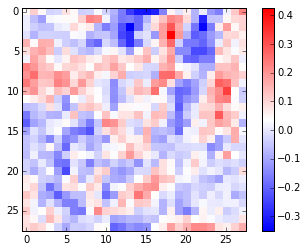

element 609


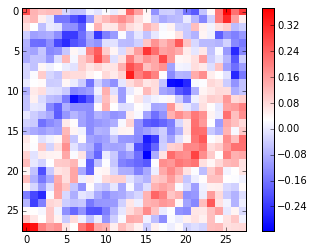

element 610


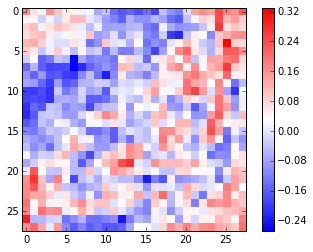

element 611


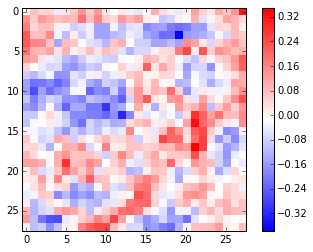

element 612


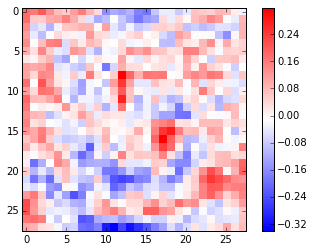

element 613


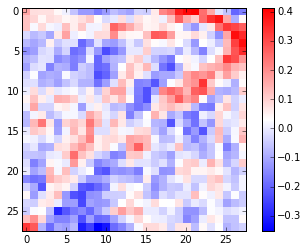

element 614


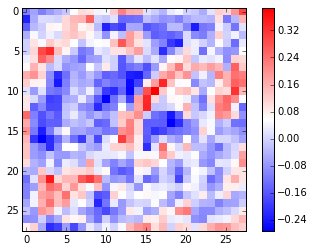

element 615


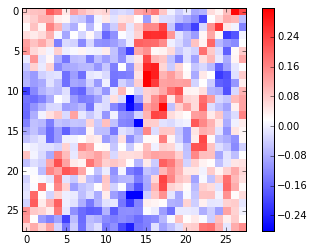

element 616


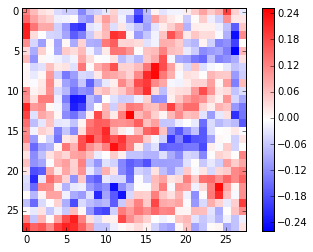

element 617


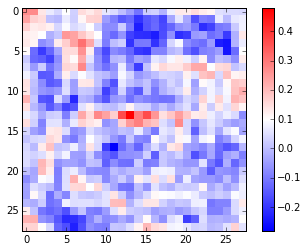

element 618


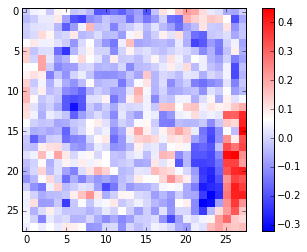

element 619


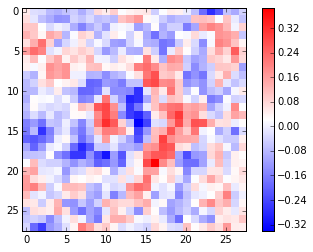

element 620


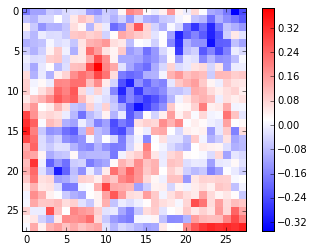

element 621


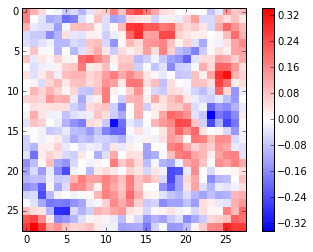

element 622


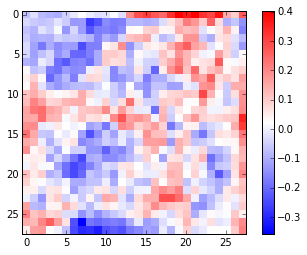

element 623


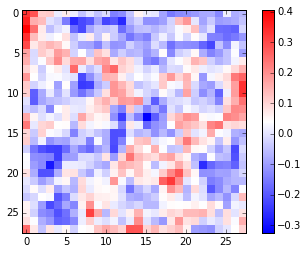

element 624


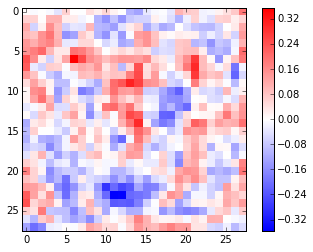

element 625


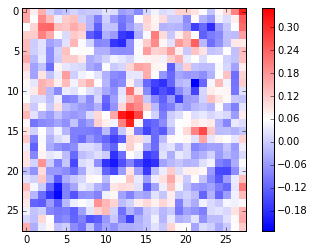

element 626


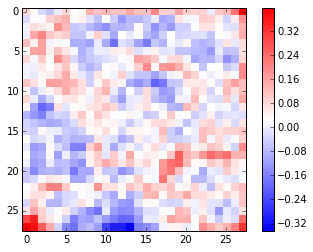

element 627


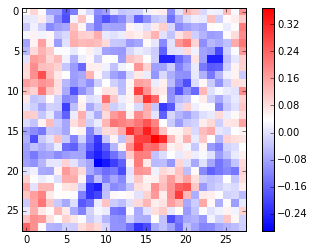

element 628


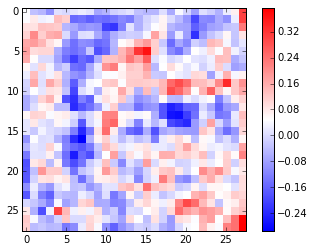

element 629


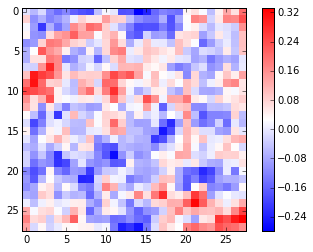

element 630


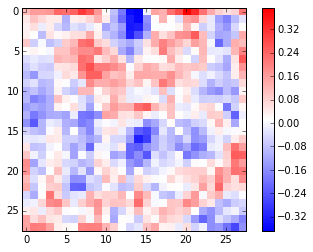

element 631


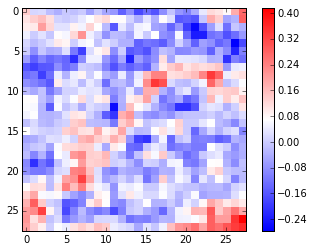

element 632


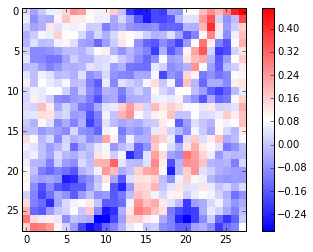

element 633


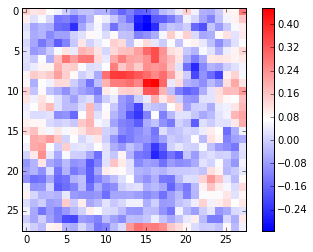

element 634


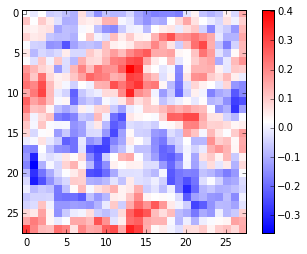

element 635


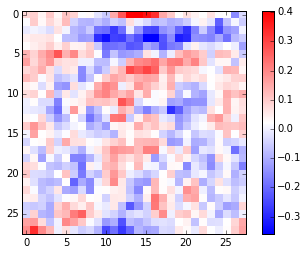

element 636


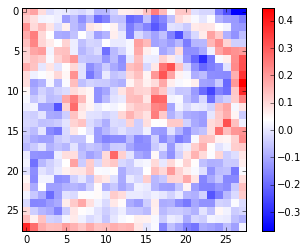

element 637


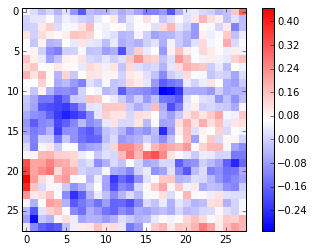

element 638


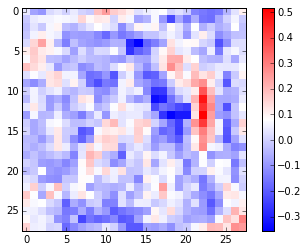

element 639


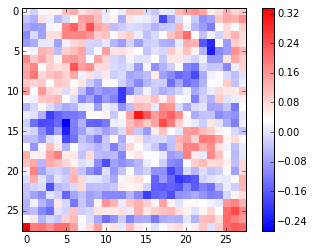

element 640


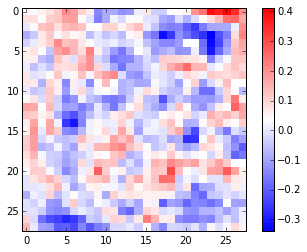

element 641


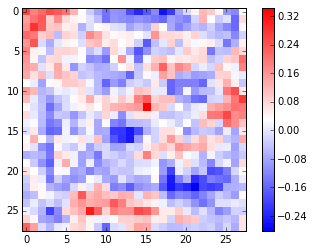

element 642


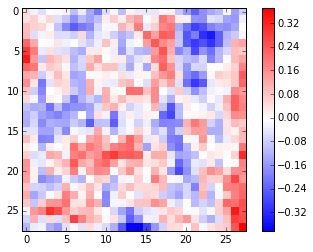

element 643


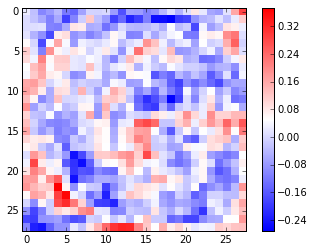

element 644


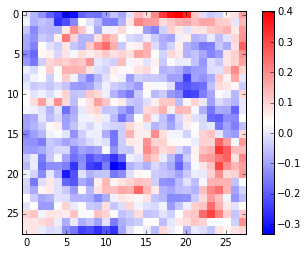

element 645


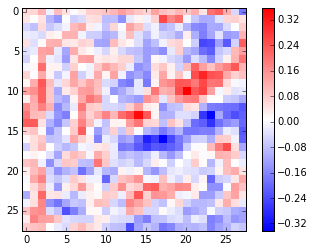

element 646


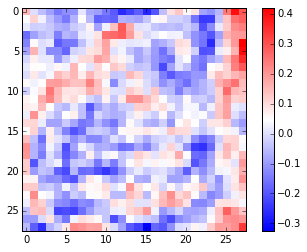

element 647


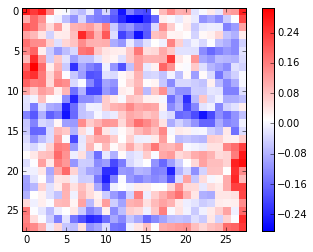

element 648


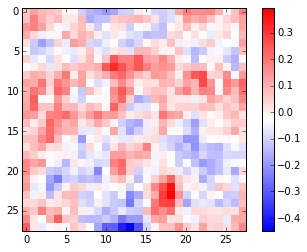

element 649


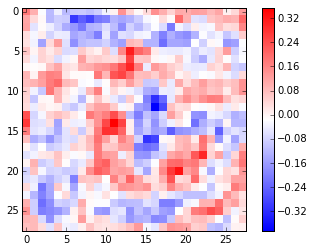

element 650


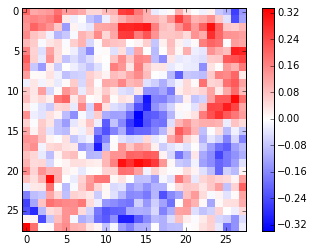

element 651


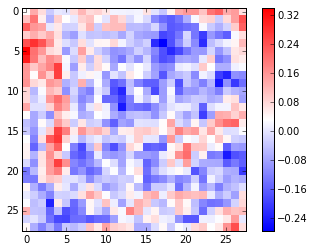

element 652


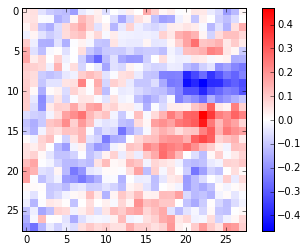

element 653


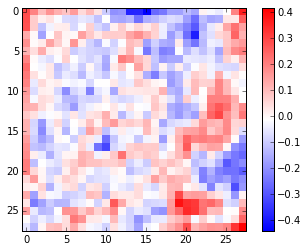

element 654


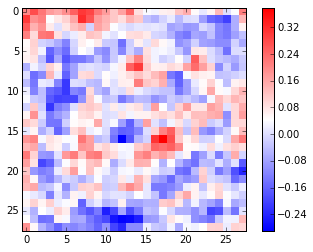

element 655


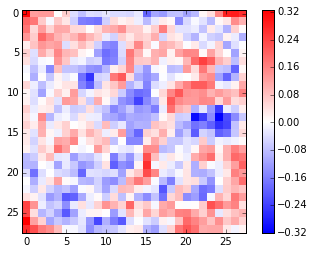

element 656


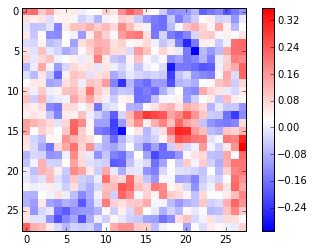

element 657


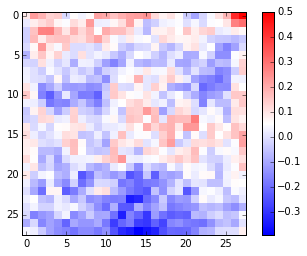

element 658


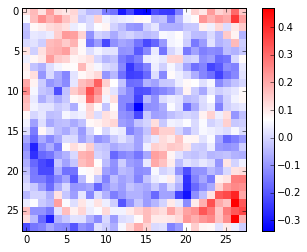

element 659


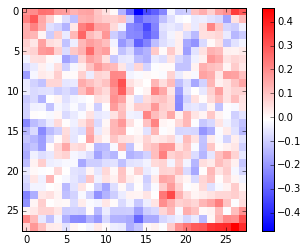

element 660


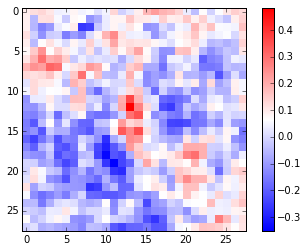

element 661


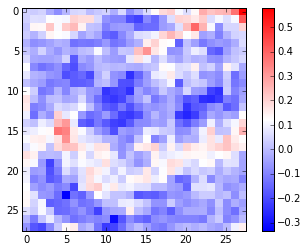

element 662


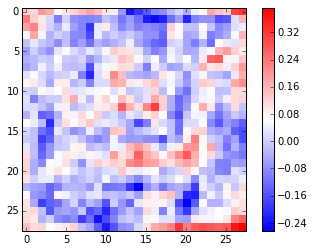

element 663


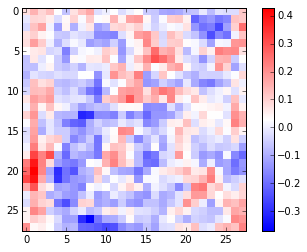

element 664


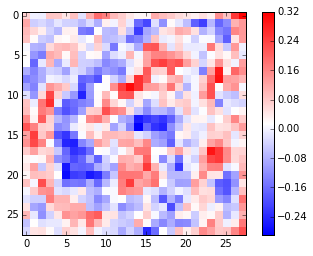

element 665


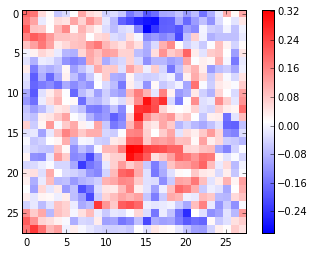

element 666


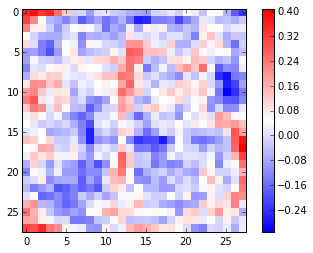

element 667


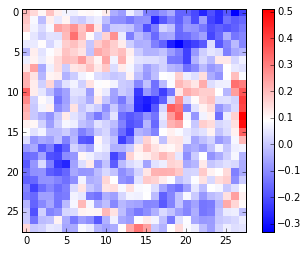

element 668


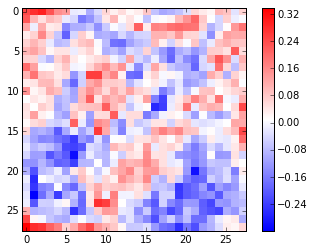

element 669


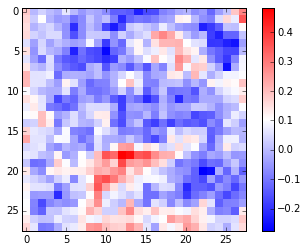

element 670


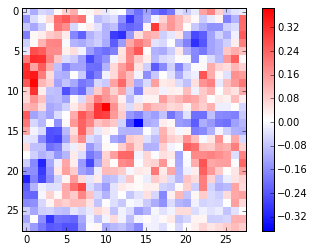

element 671


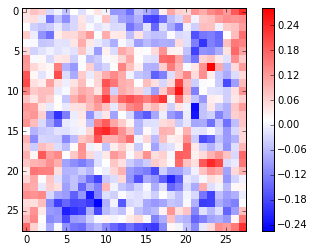

element 672


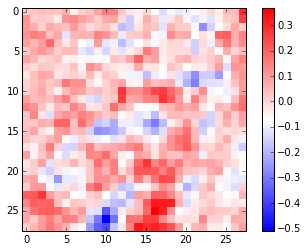

element 673


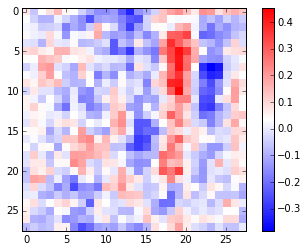

element 674


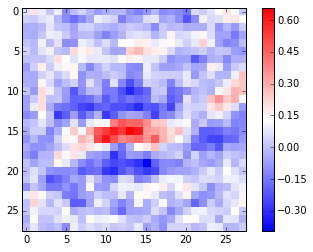

element 675


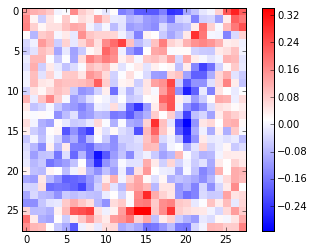

element 676


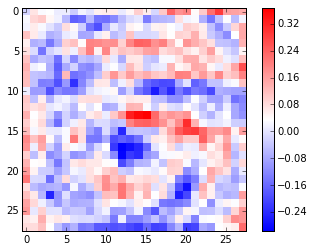

element 677


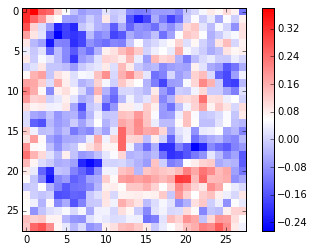

element 678


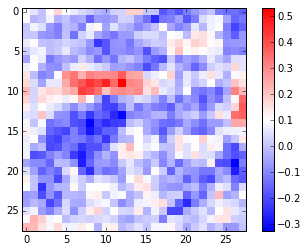

element 679


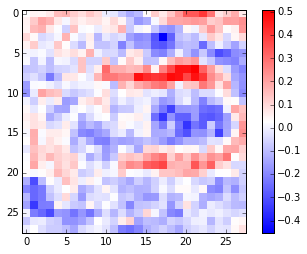

element 680


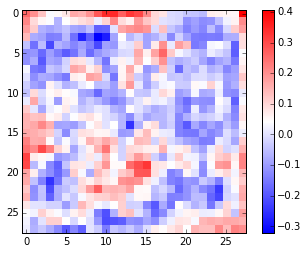

element 681


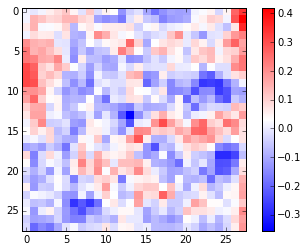

element 682


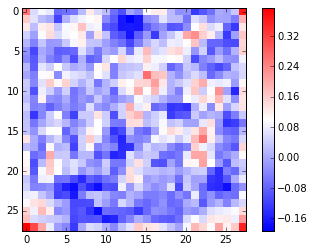

element 683


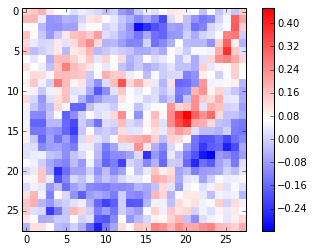

element 684


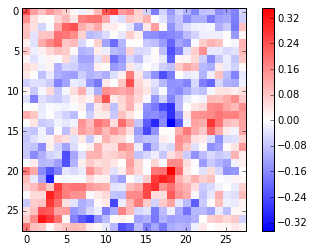

element 685


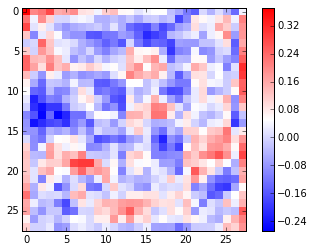

element 686


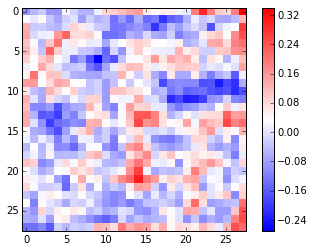

element 687


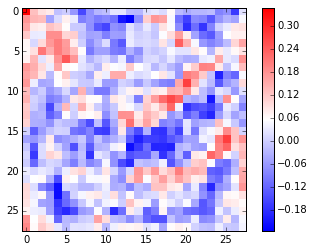

element 688


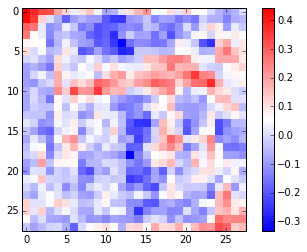

element 689


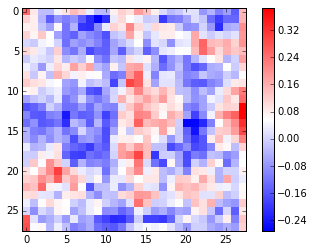

element 690


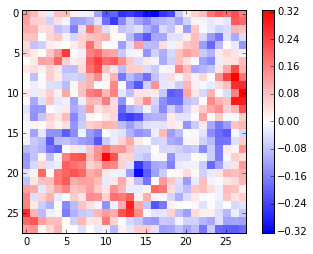

element 691


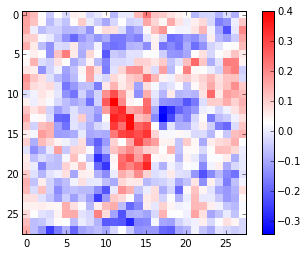

element 692


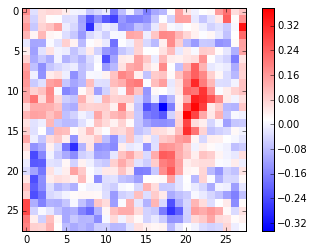

element 693


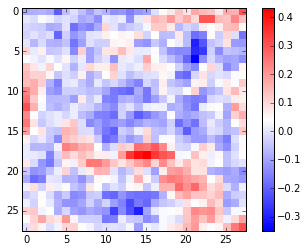

element 694


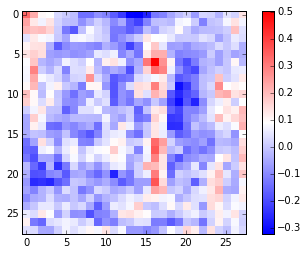

element 695


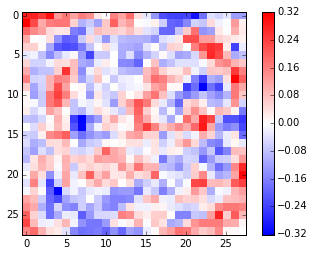

element 696


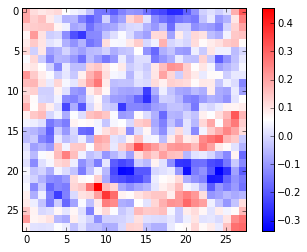

element 697


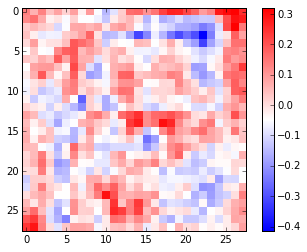

element 698


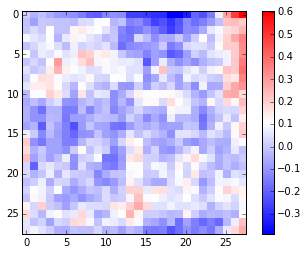

element 699


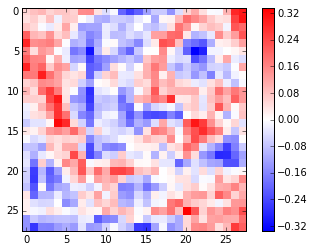

element 700


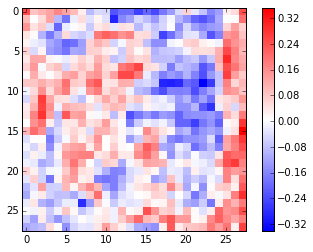

element 701


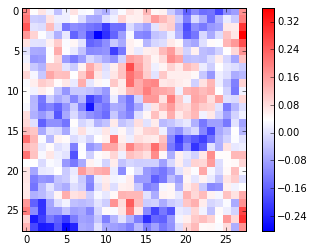

element 702


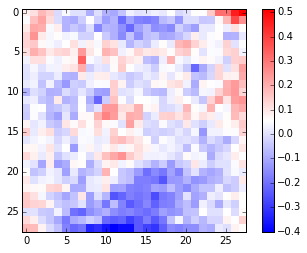

element 703


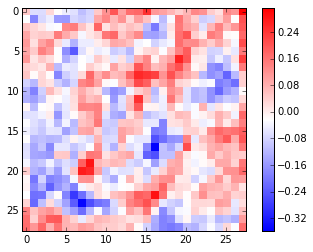

element 704


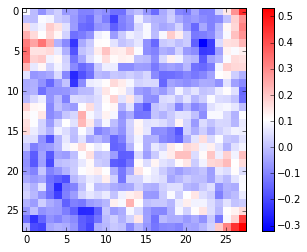

element 705


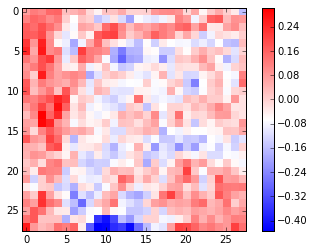

element 706


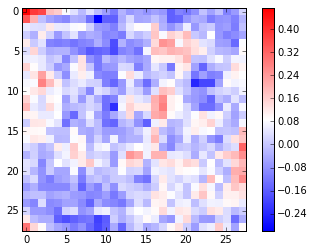

element 707


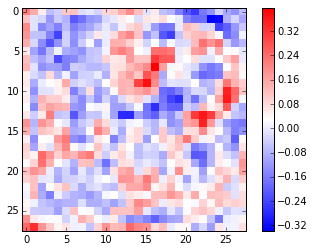

element 708


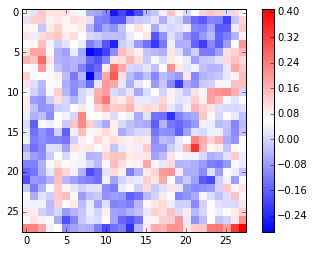

element 709


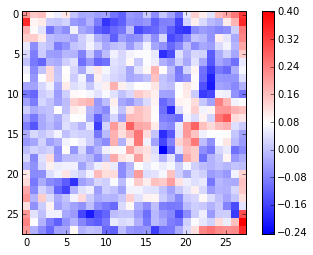

element 710


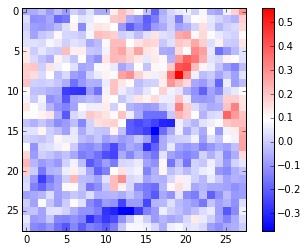

element 711


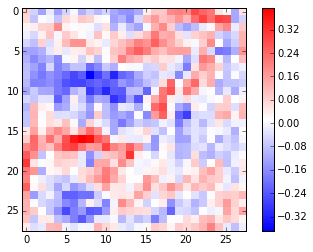

element 712


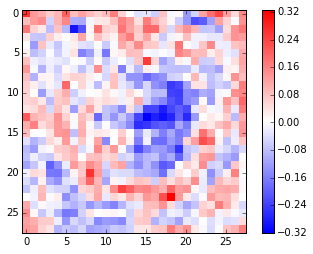

element 713


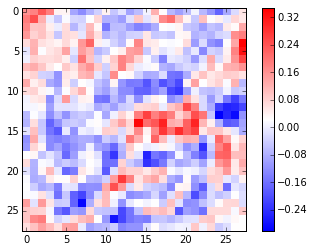

element 714


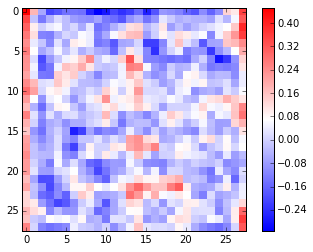

element 715


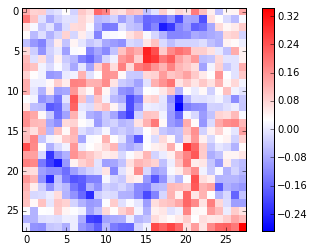

element 716


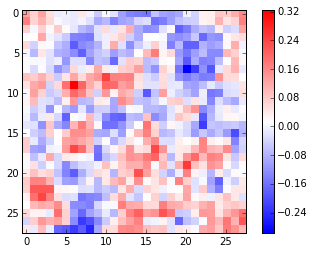

element 717


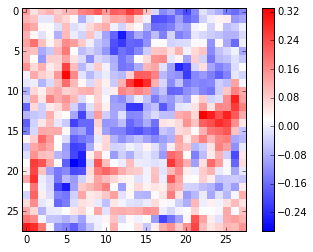

element 718


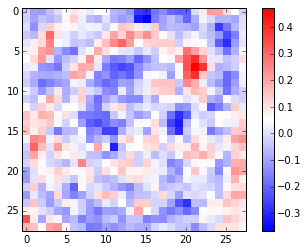

element 719


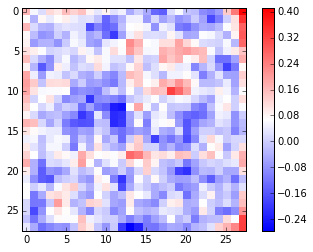

element 720


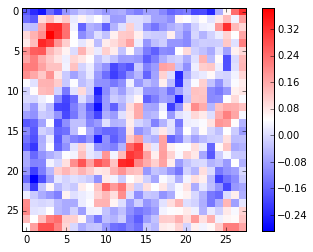

element 721


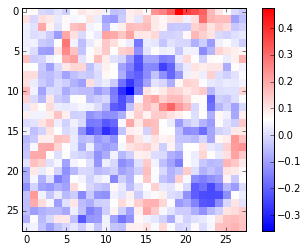

element 722


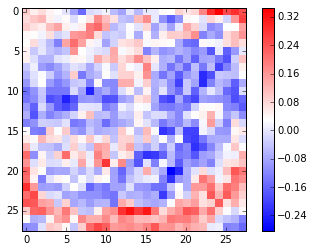

element 723


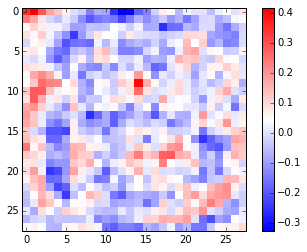

element 724


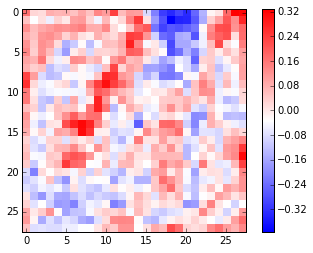

element 725


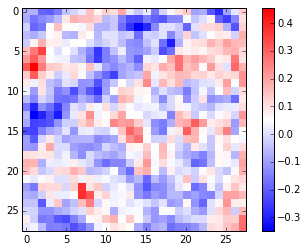

element 726


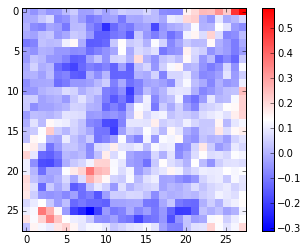

element 727


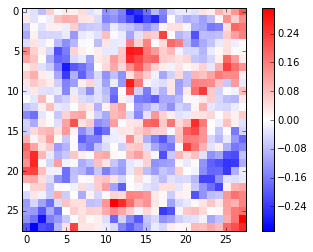

element 728


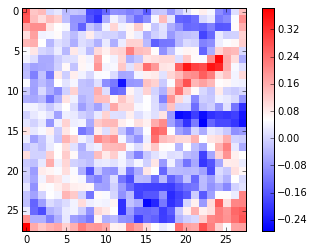

element 729


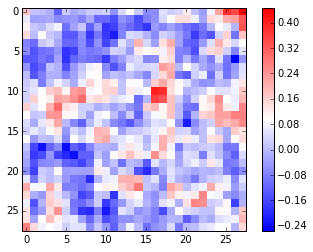

element 730


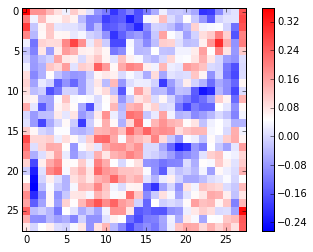

element 731


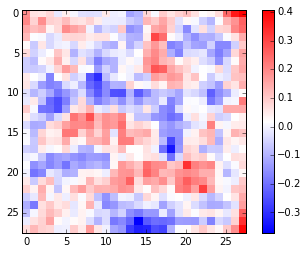

element 732


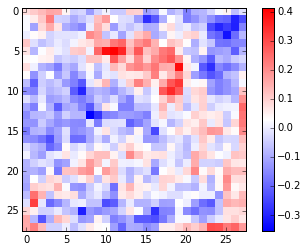

element 733


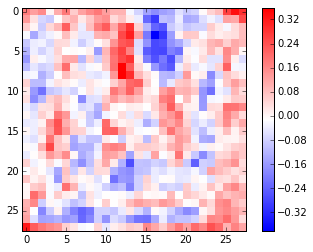

element 734


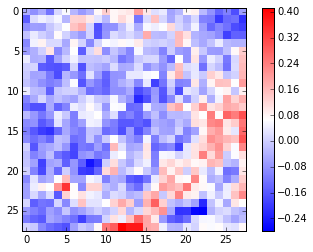

element 735


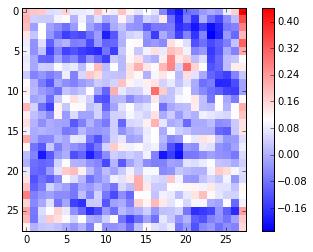

element 736


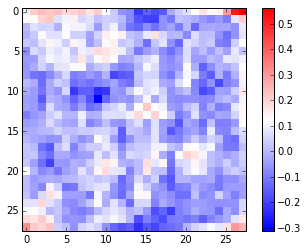

element 737


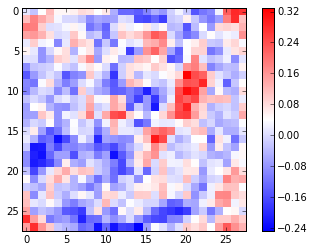

element 738


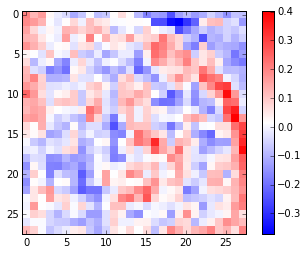

element 739


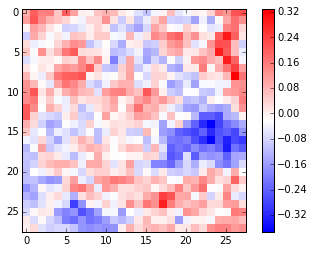

element 740


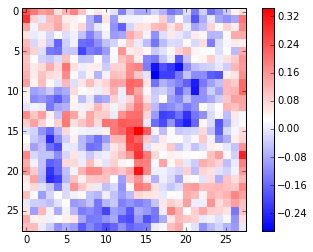

element 741


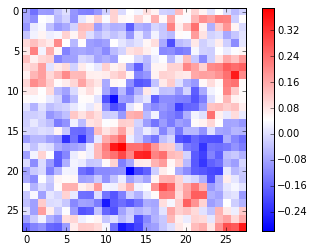

element 742


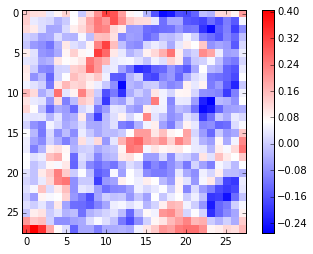

element 743


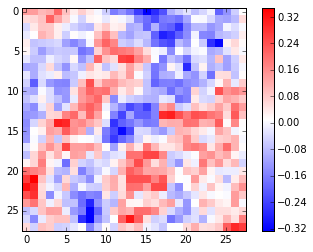

element 744


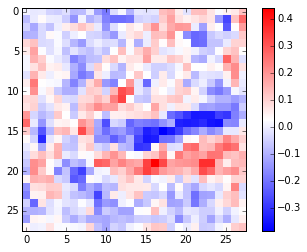

element 745


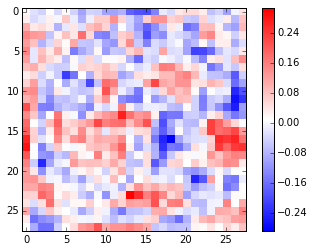

element 746


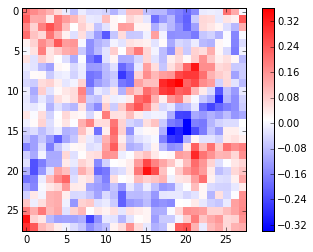

element 747


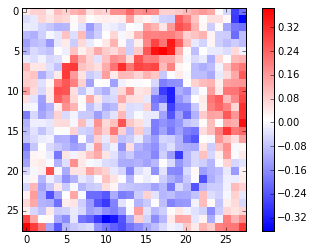

element 748


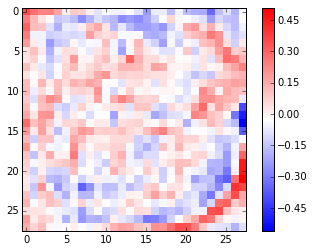

element 749


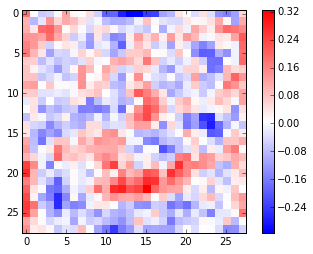

element 750


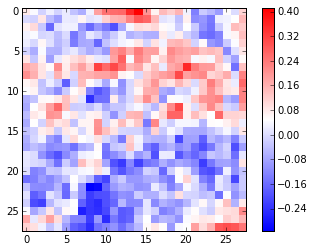

element 751


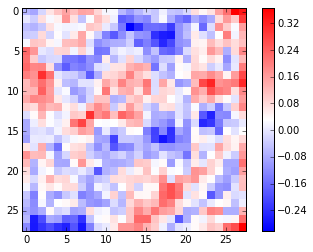

element 752


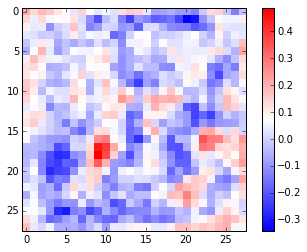

element 753


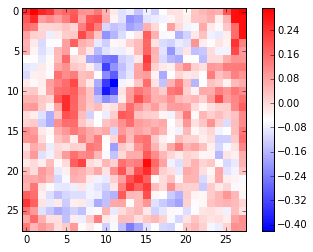

element 754


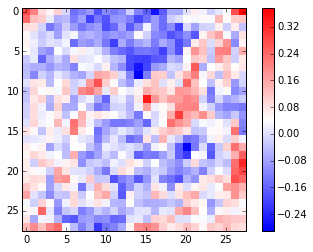

element 755


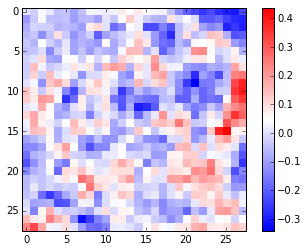

element 756


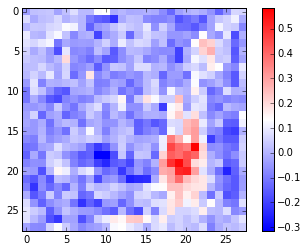

element 757


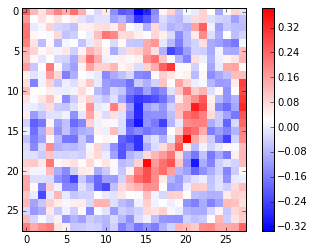

element 758


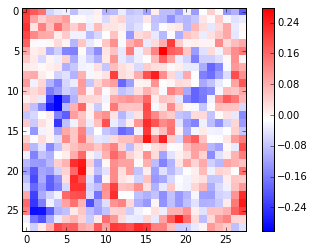

element 759


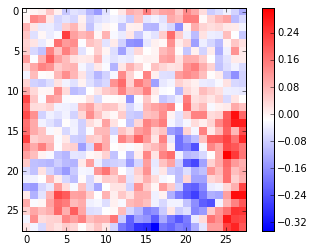

element 760


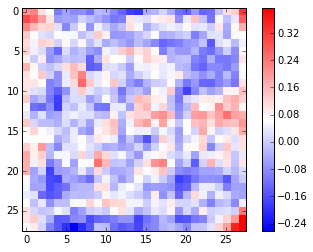

element 761


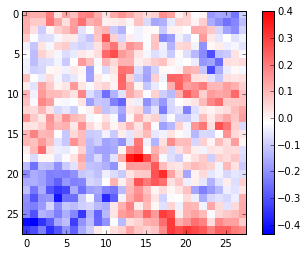

element 762


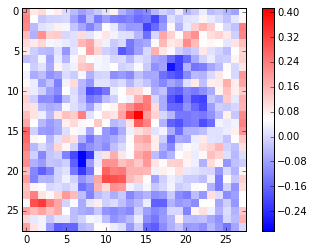

element 763


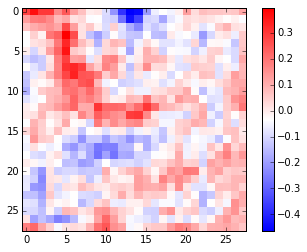

element 764


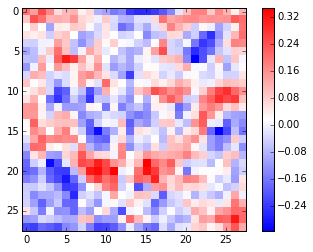

element 765


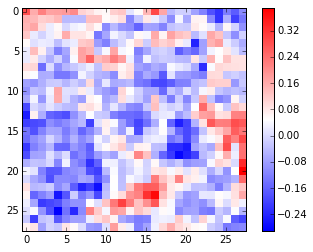

element 766


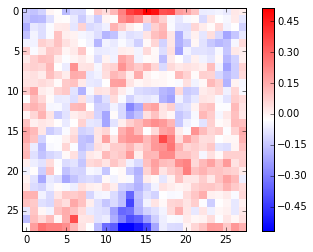

element 767


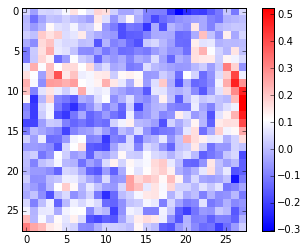

element 768


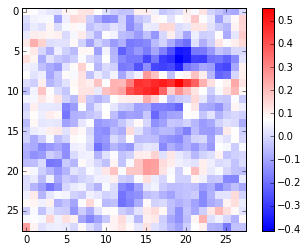

element 769


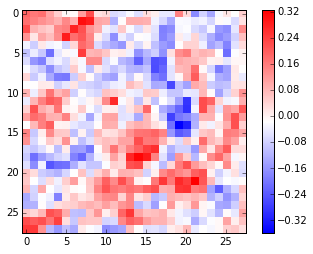

element 770


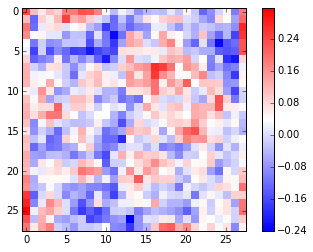

element 771


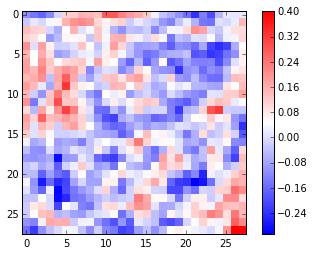

element 772


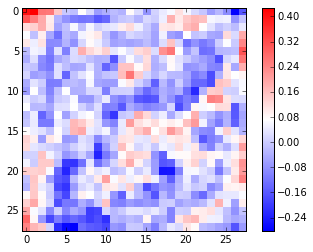

element 773


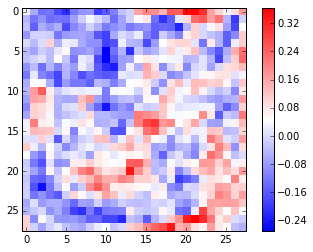

element 774


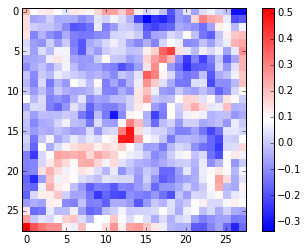

element 775


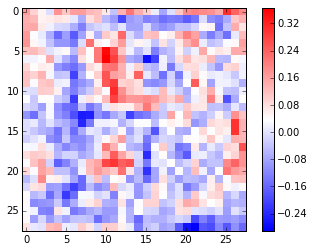

element 776


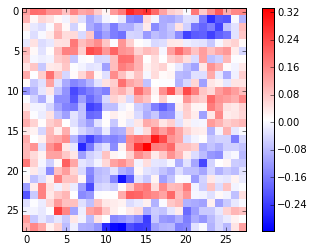

element 777


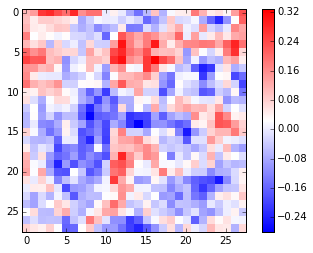

element 778


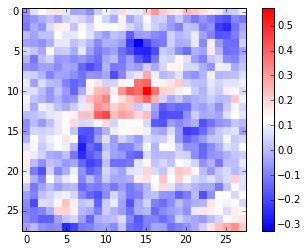

element 779


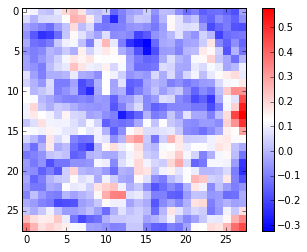

element 780


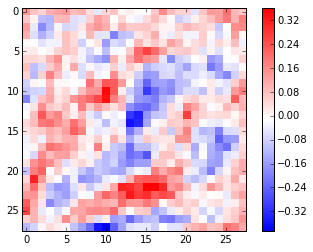

element 781


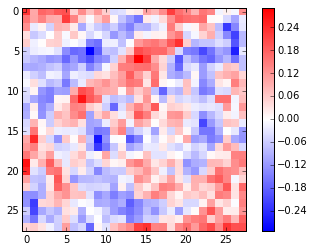

element 782


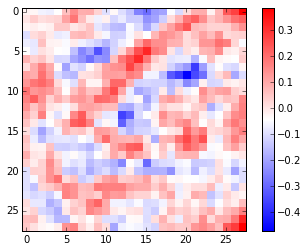

element 783


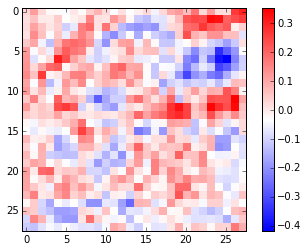

element 784


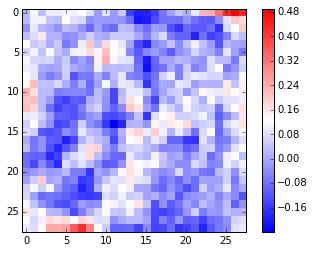

element 785


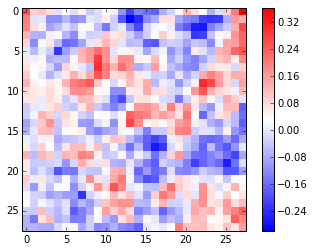

element 786


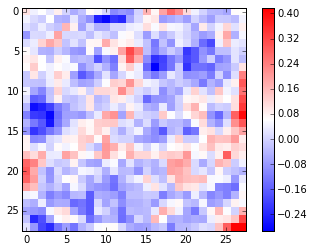

element 787


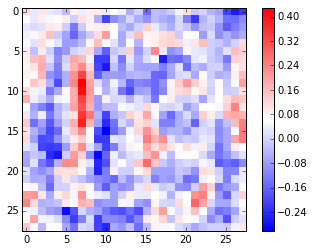

element 788


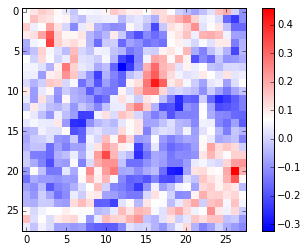

element 789


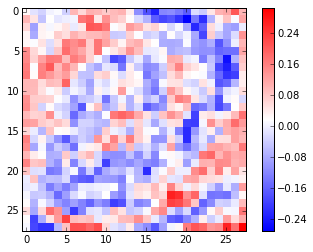

element 790


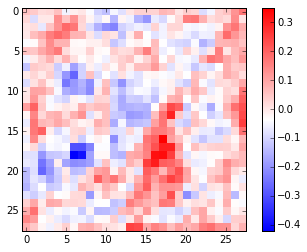

element 791


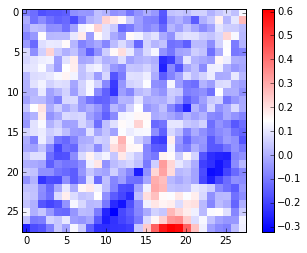

element 792


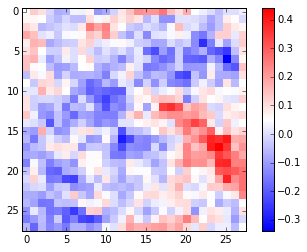

element 793


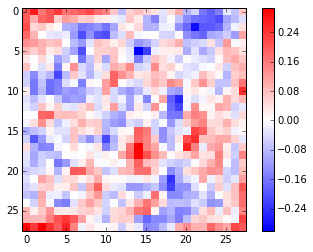

element 794


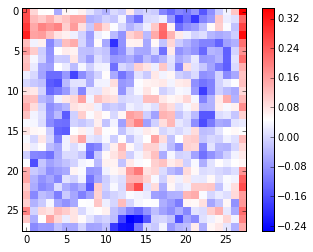

element 795


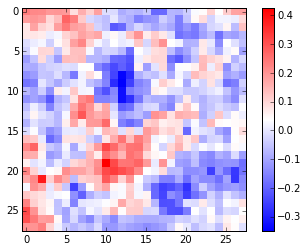

element 796


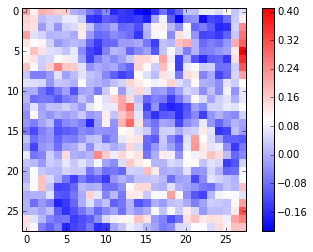

element 797


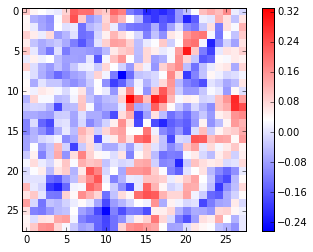

element 798


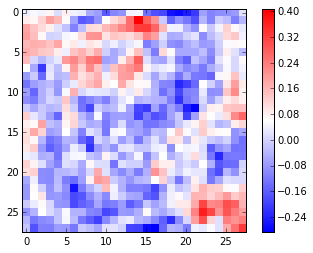

element 799


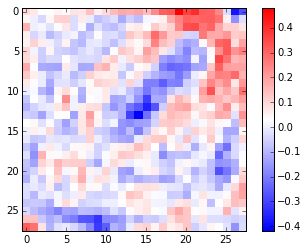

element 800


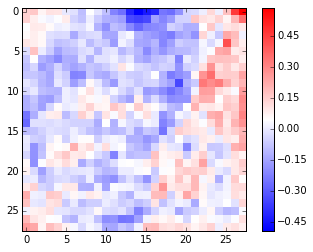

element 801


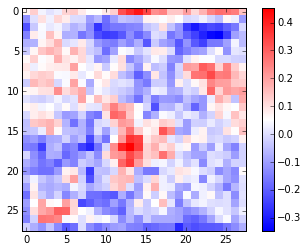

element 802


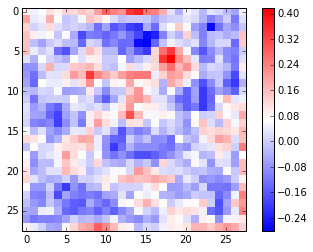

element 803


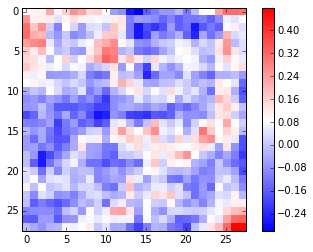

element 804


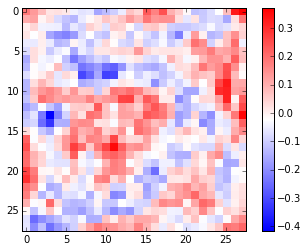

element 805


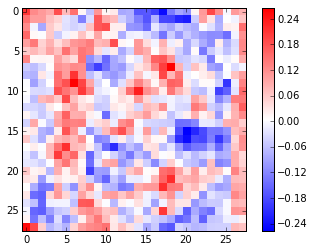

element 806


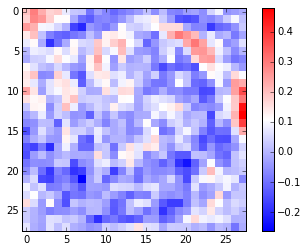

element 807


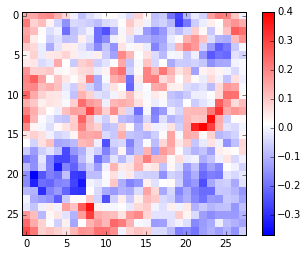

element 808


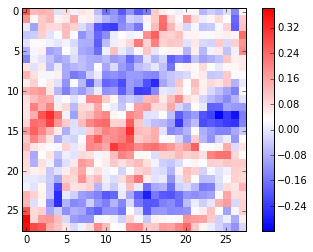

element 809


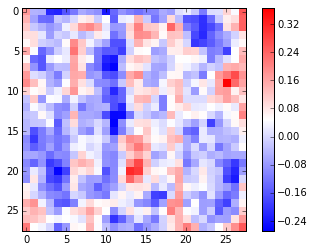

element 810


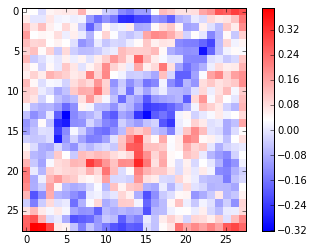

element 811


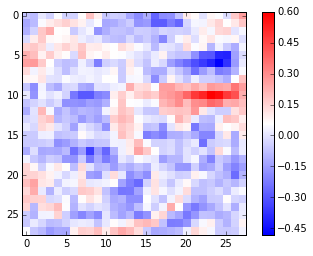

element 812


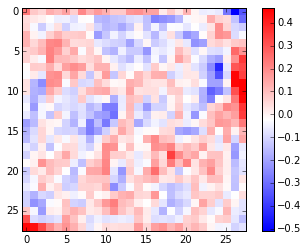

element 813


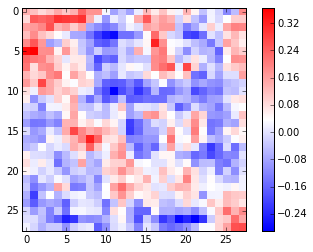

element 814


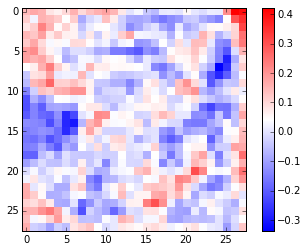

element 815


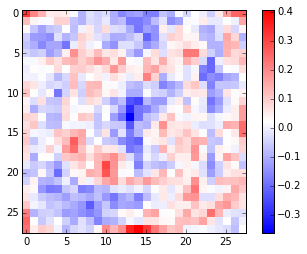

element 816


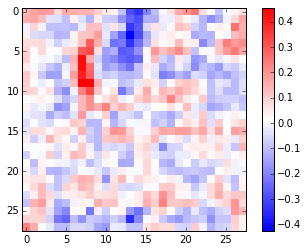

element 817


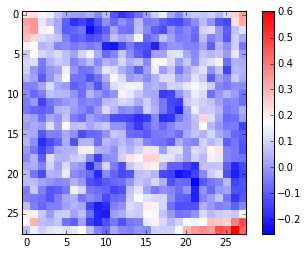

element 818


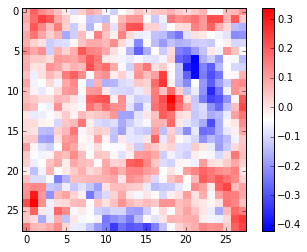

element 819


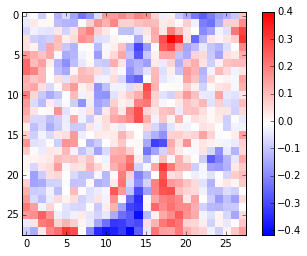

element 820


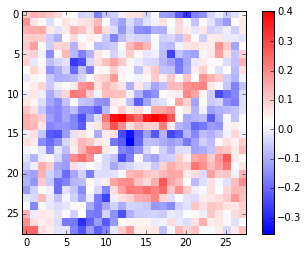

element 821


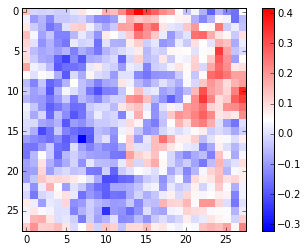

element 822


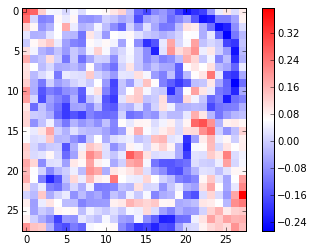

element 823


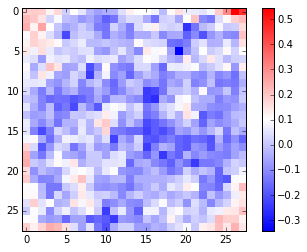

element 824


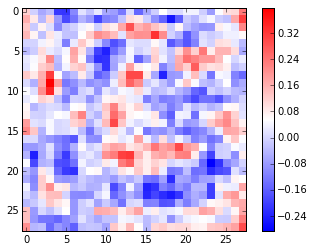

element 825


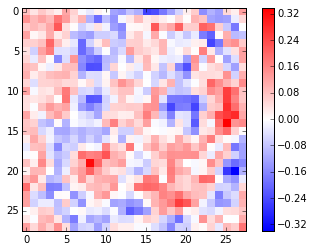

element 826


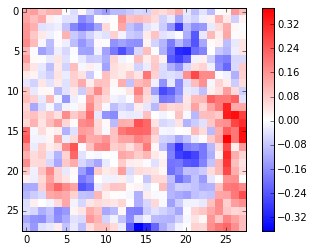

element 827


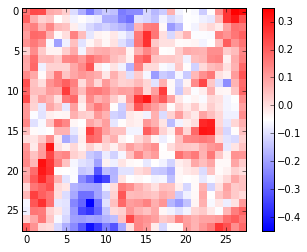

element 828


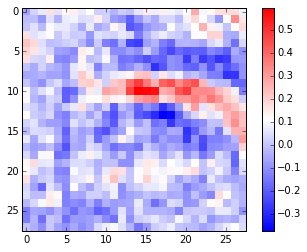

element 829


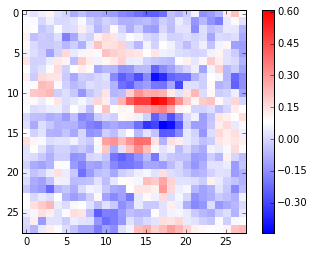

element 830


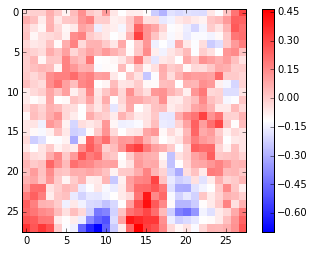

element 831


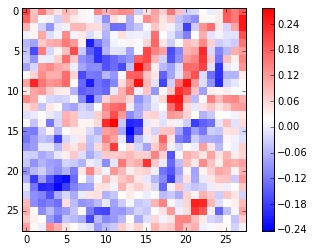

element 832


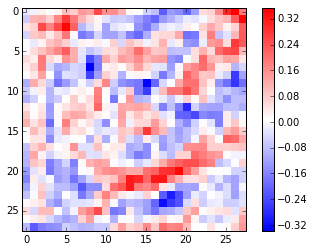

element 833


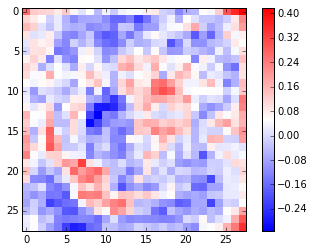

element 834


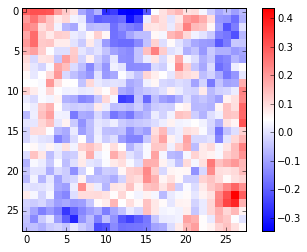

element 835


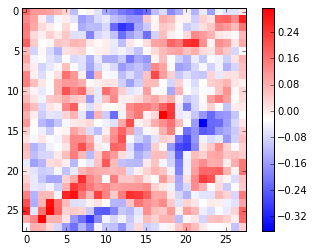

element 836


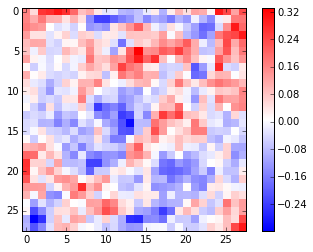

element 837


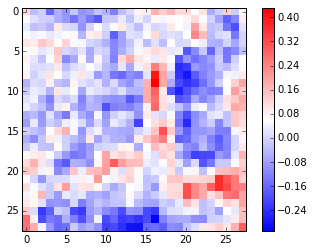

element 838


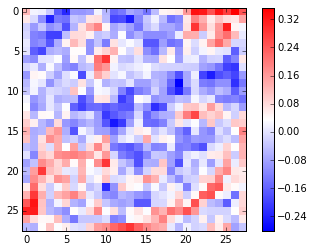

element 839


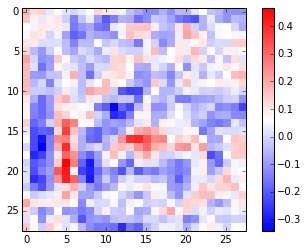

element 840


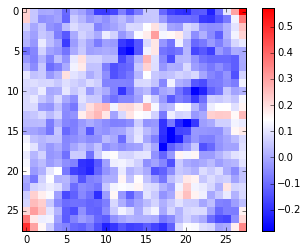

element 841


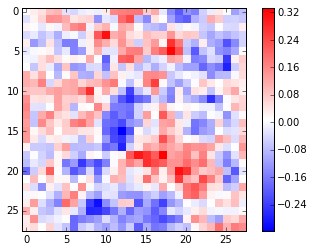

element 842


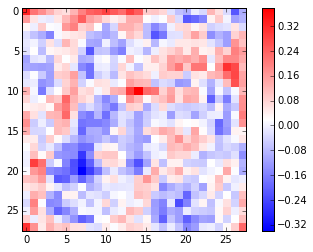

element 843


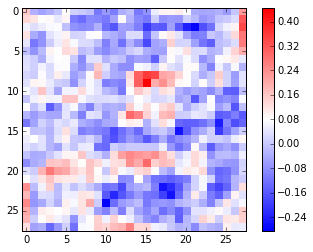

element 844


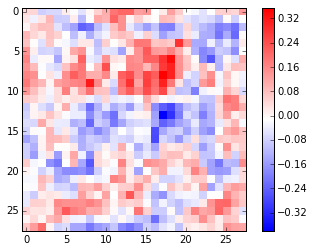

element 845


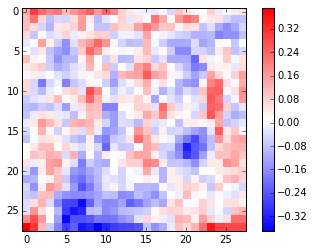

element 846


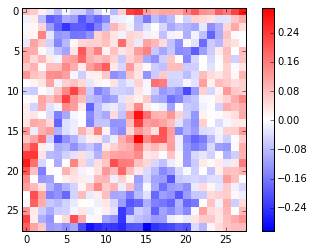

element 847


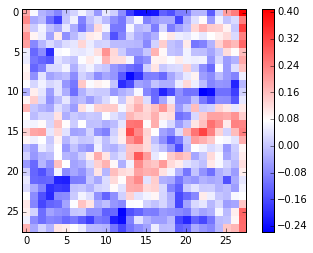

element 848


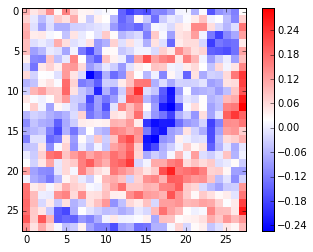

element 849


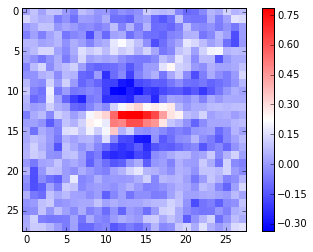

element 850


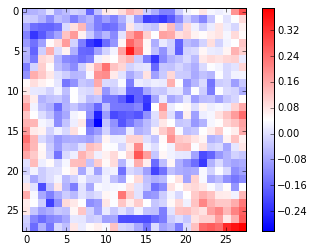

element 851


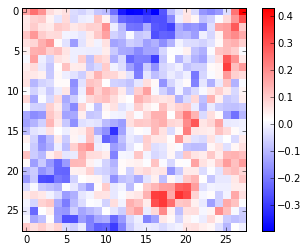

element 852


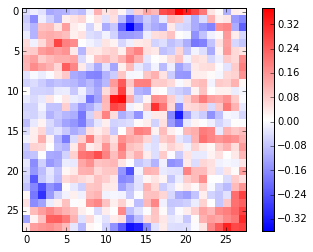

element 853


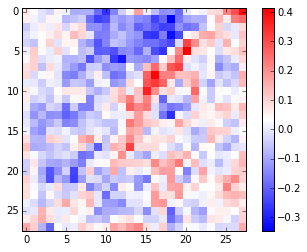

element 854


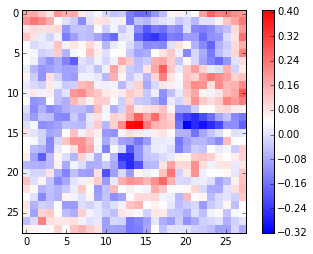

element 855


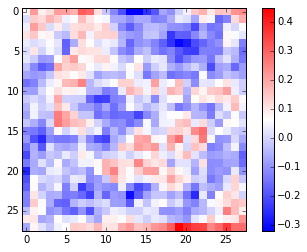

element 856


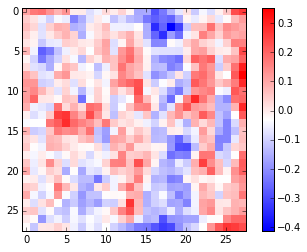

element 857


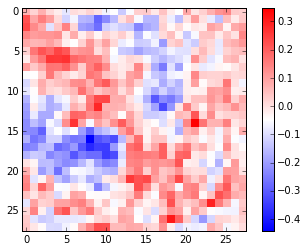

element 858


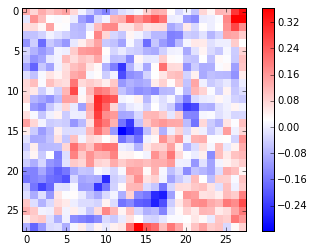

element 859


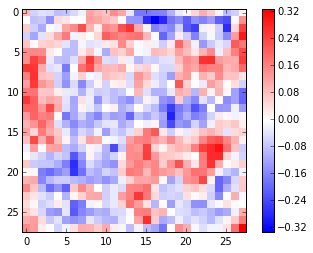

element 860


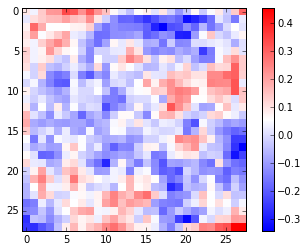

element 861


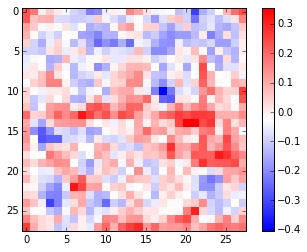

element 862


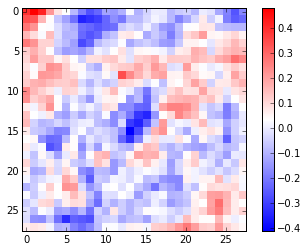

element 863


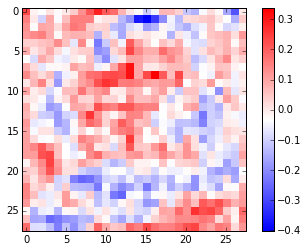

element 864


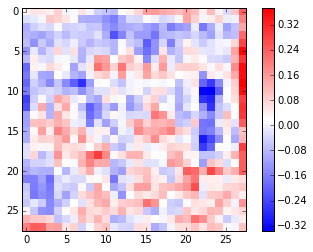

element 865


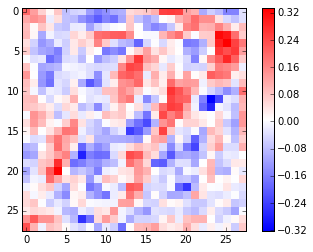

element 866


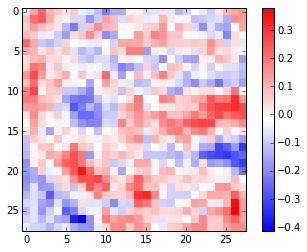

element 867


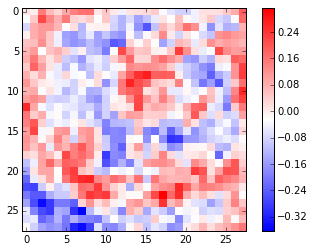

element 868


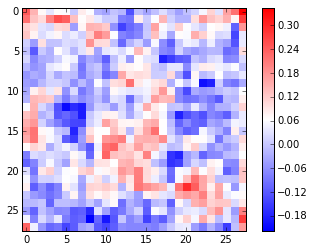

element 869


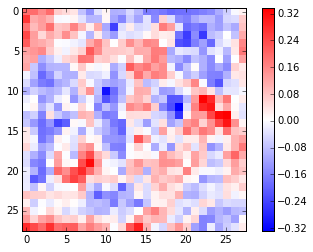

element 870


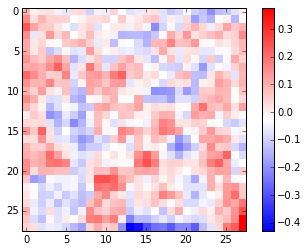

element 871


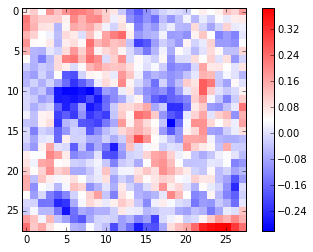

element 872


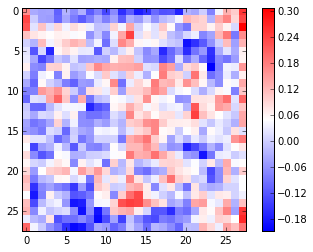

element 873


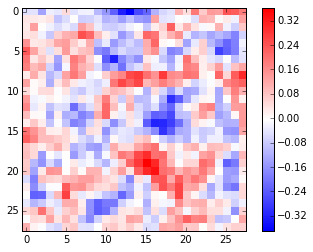

element 874


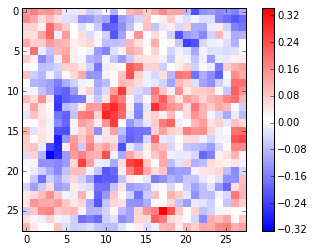

element 875


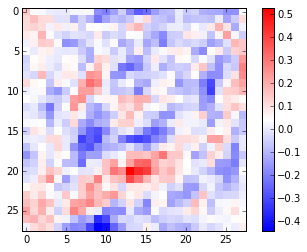

element 876


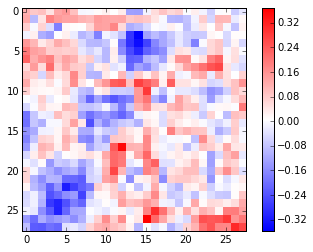

element 877


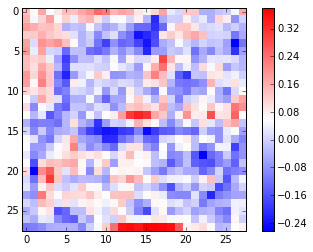

element 878


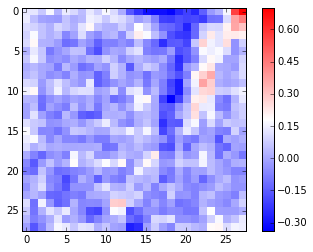

element 879


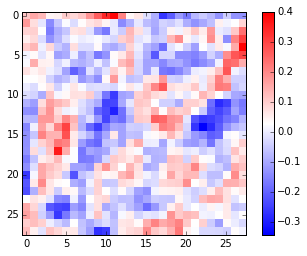

element 880


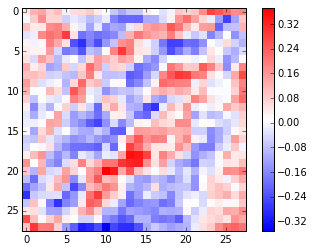

element 881


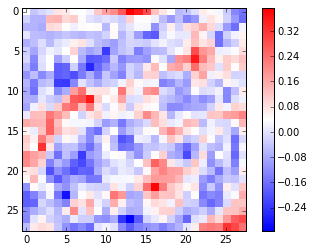

element 882


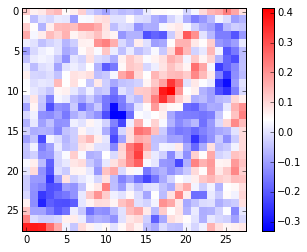

element 883


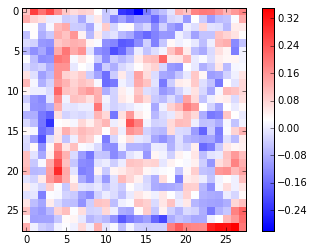

element 884


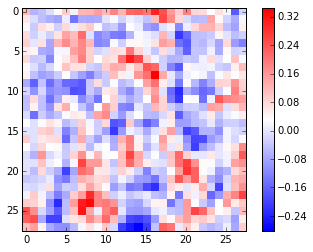

element 885


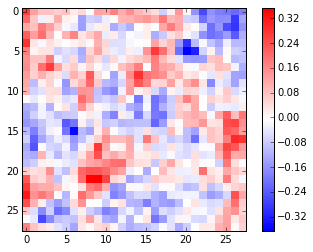

element 886


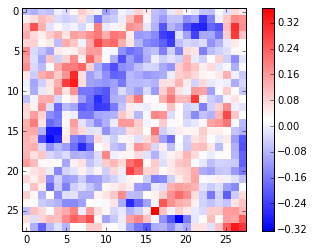

element 887


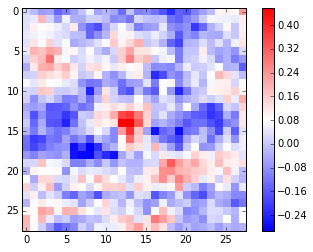

element 888


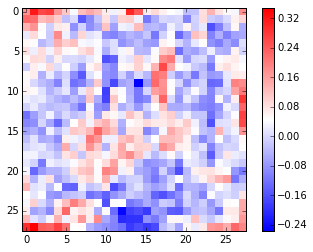

element 889


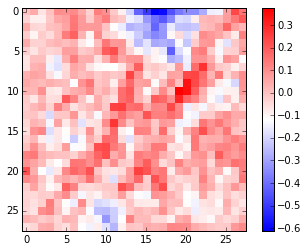

element 890


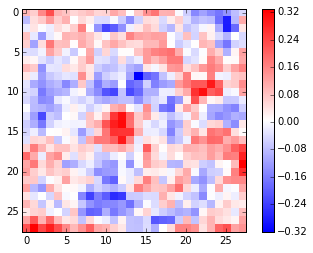

element 891


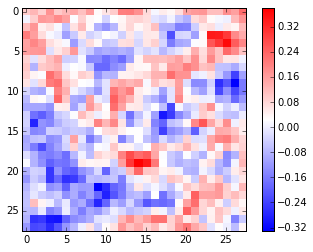

element 892


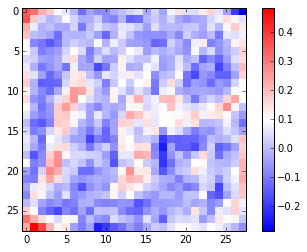

element 893


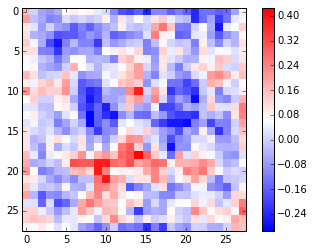

element 894


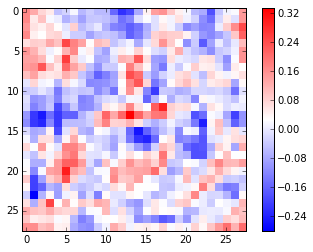

element 895


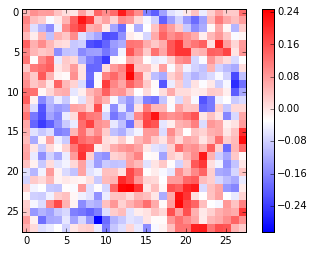

element 896


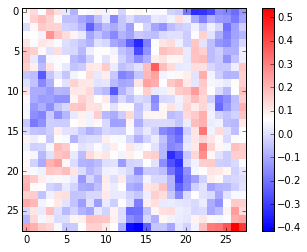

element 897


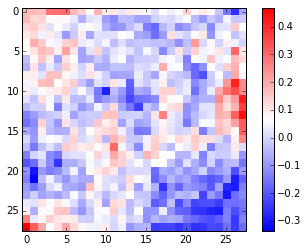

element 898


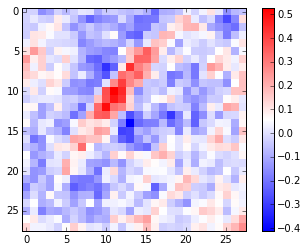

element 899


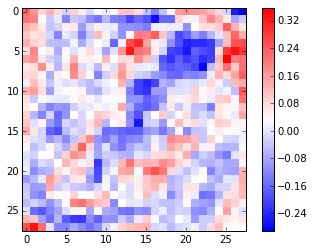

element 900


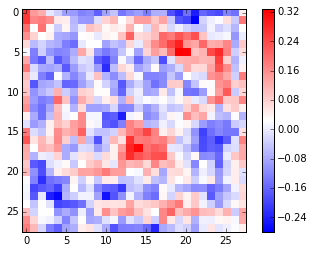

element 901


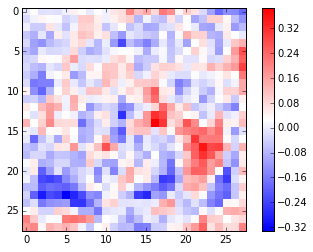

element 902


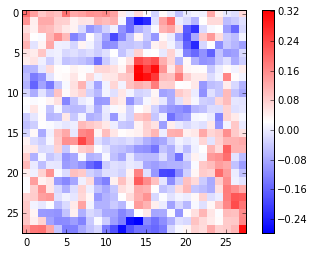

element 903


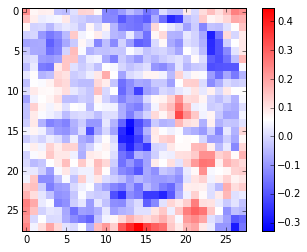

element 904


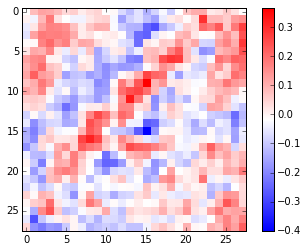

element 905


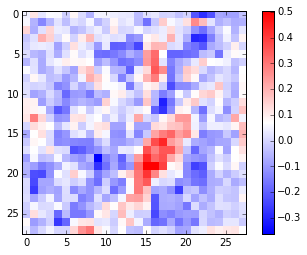

element 906


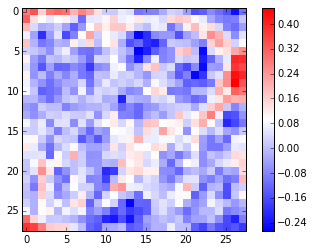

element 907


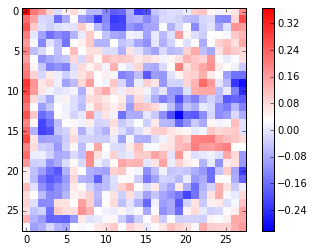

element 908


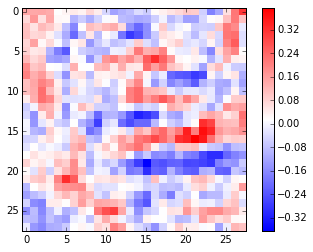

element 909


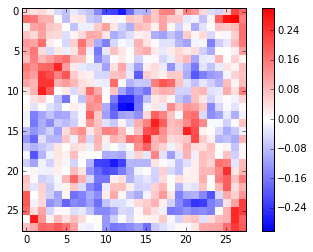

element 910


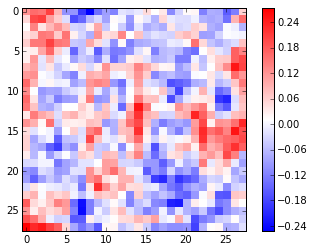

element 911


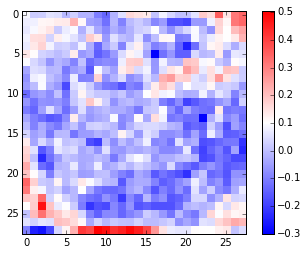

element 912


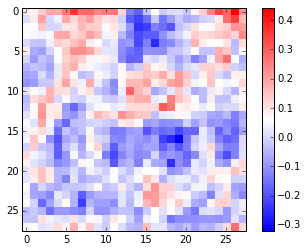

element 913


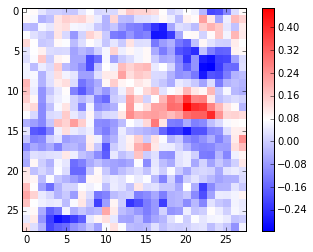

element 914


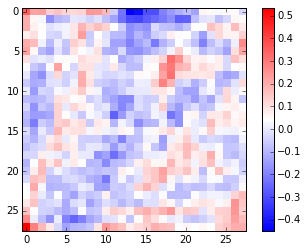

element 915


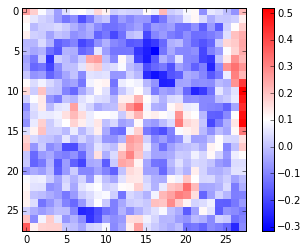

element 916


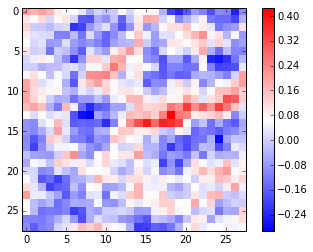

element 917


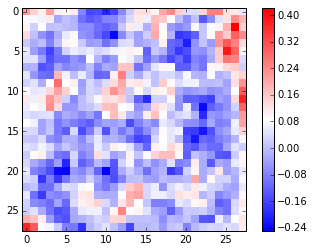

element 918


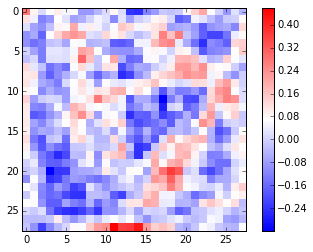

element 919


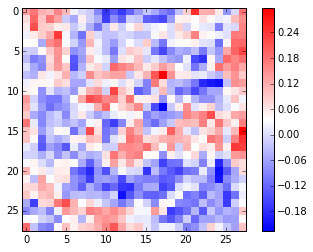

element 920


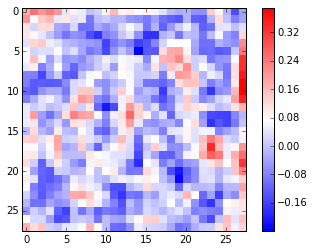

element 921


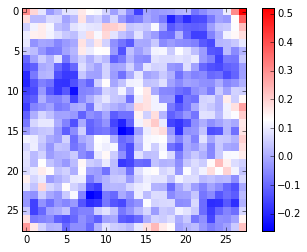

element 922


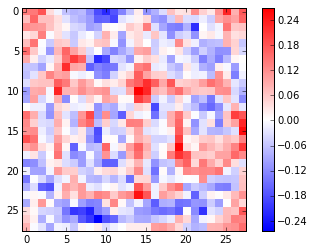

element 923


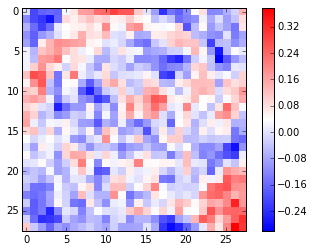

element 924


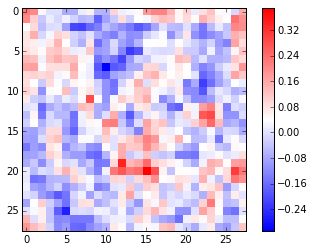

element 925


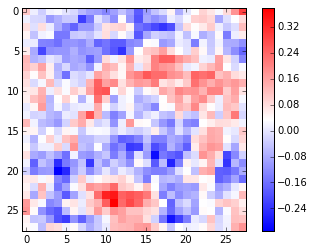

element 926


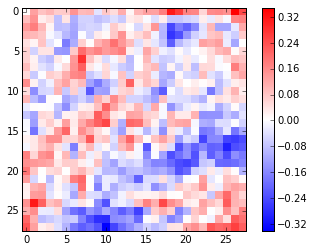

element 927


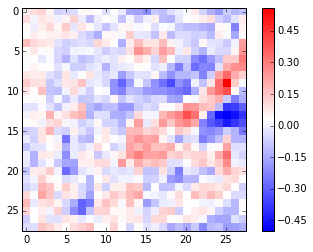

element 928


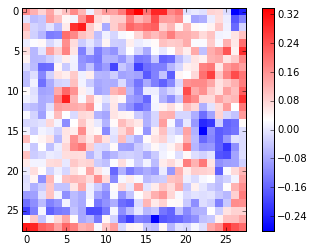

element 929


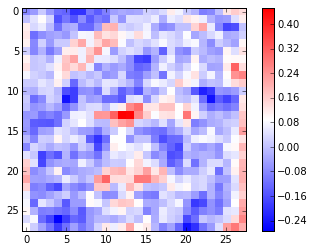

element 930


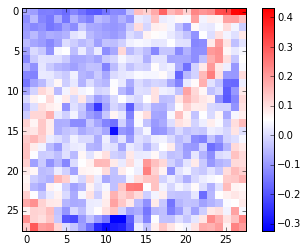

element 931


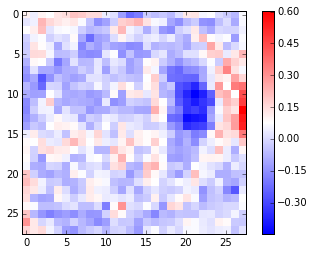

element 932


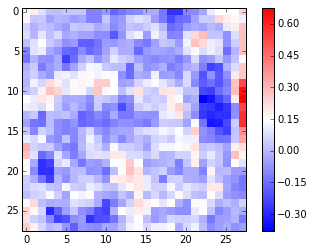

element 933


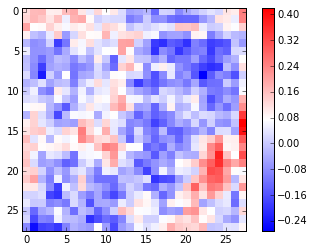

element 934


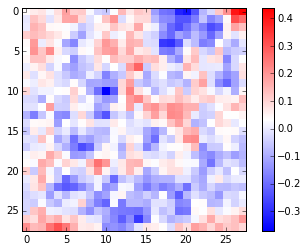

element 935


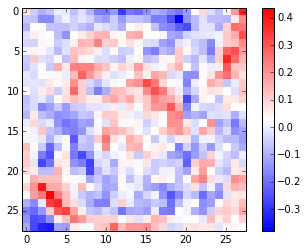

element 936


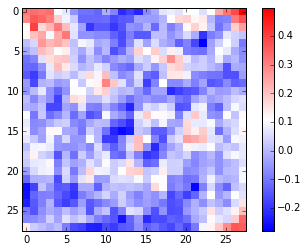

element 937


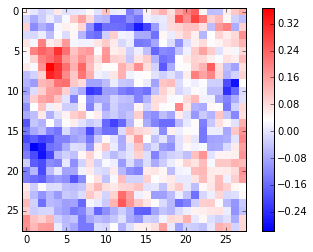

element 938


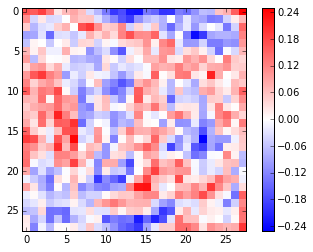

element 939


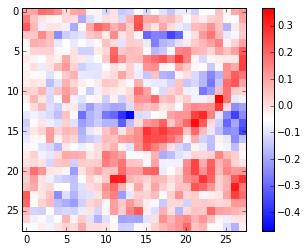

element 940


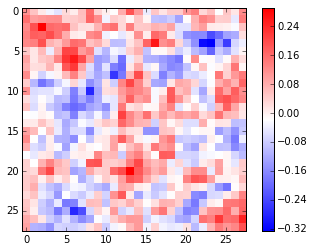

element 941


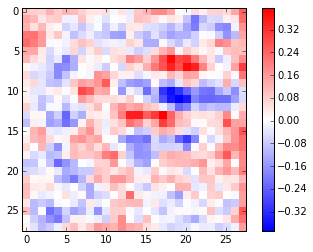

element 942


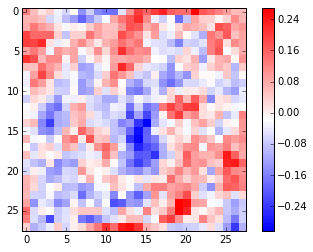

element 943


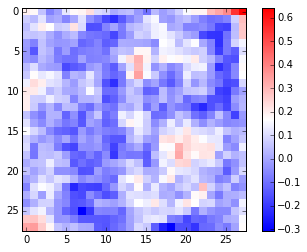

element 944


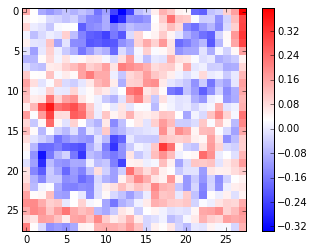

element 945


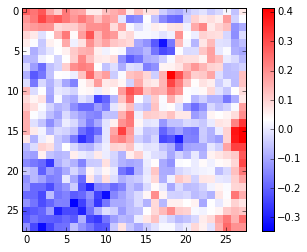

element 946


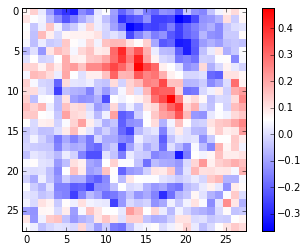

element 947


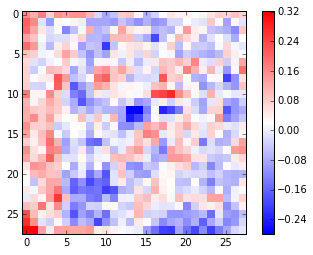

element 948


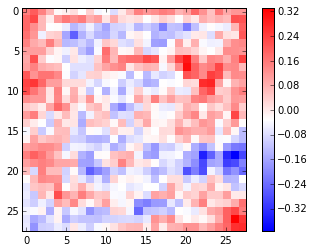

element 949


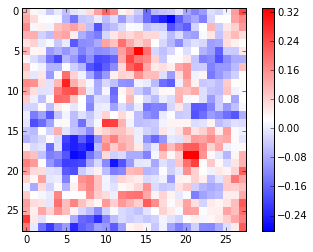

element 950


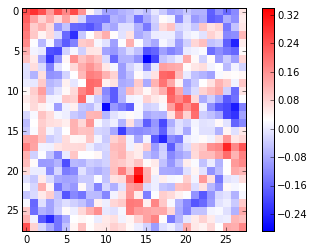

element 951


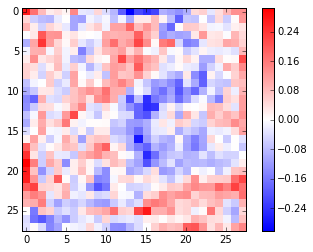

element 952


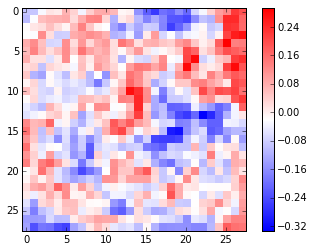

element 953


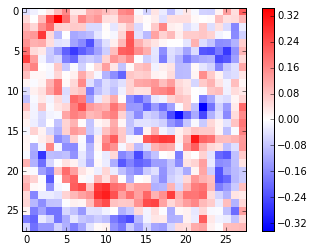

element 954


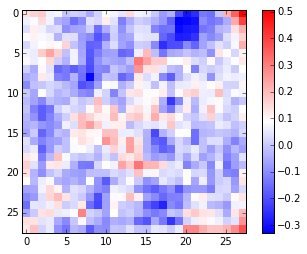

element 955


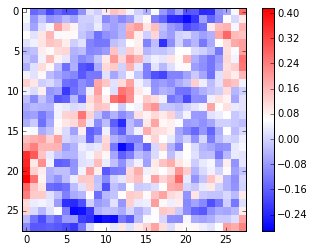

element 956


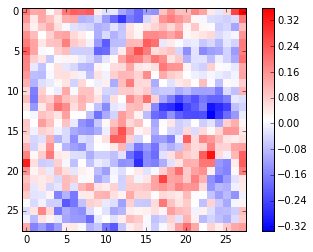

element 957


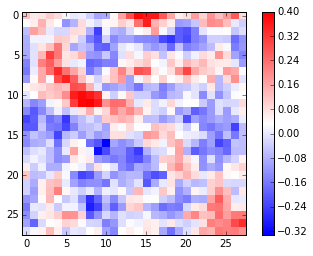

element 958


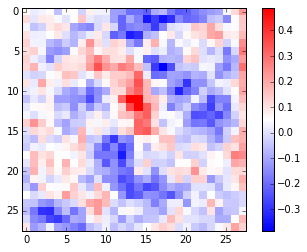

element 959


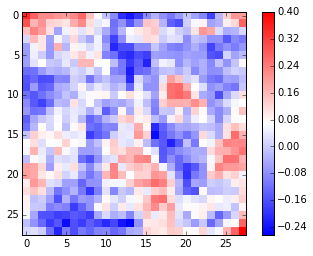

element 960


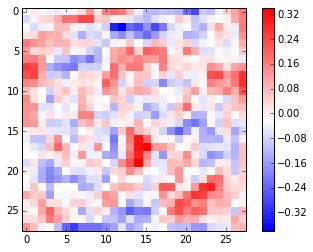

element 961


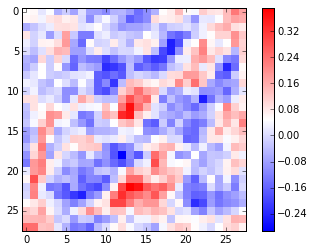

element 962


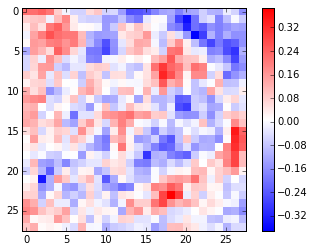

element 963


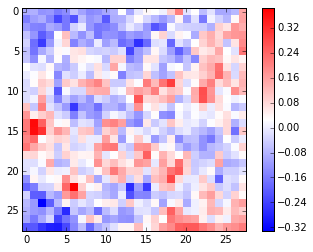

element 964


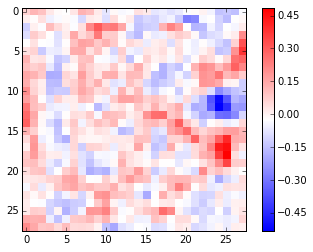

element 965


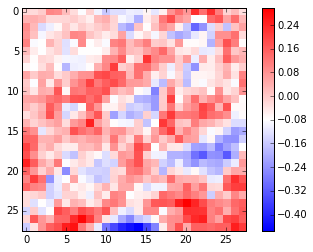

element 966


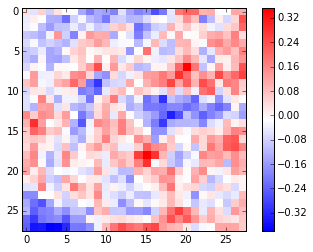

element 967


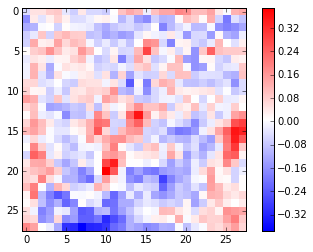

element 968


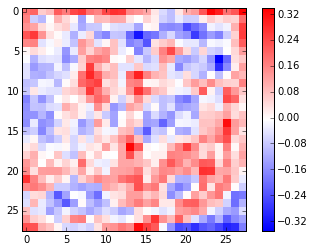

element 969


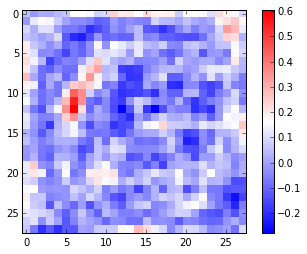

element 970


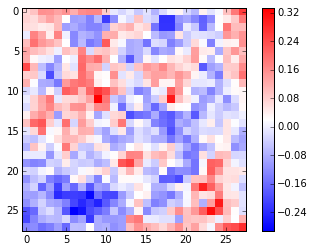

element 971


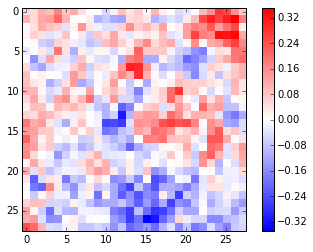

element 972


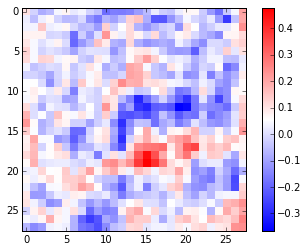

element 973


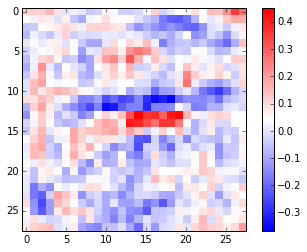

element 974


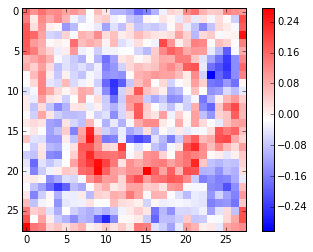

element 975


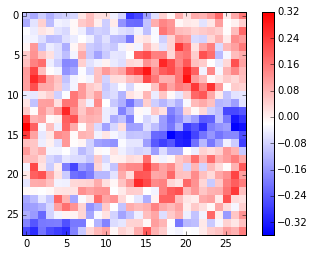

element 976


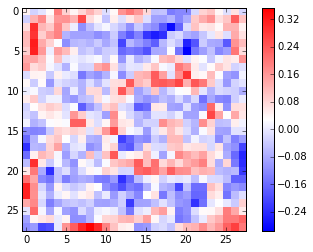

element 977


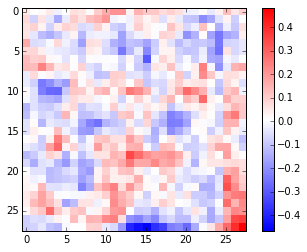

element 978


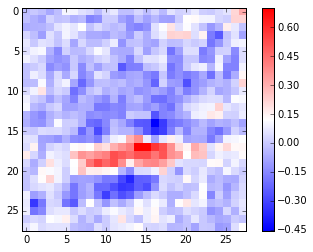

element 979


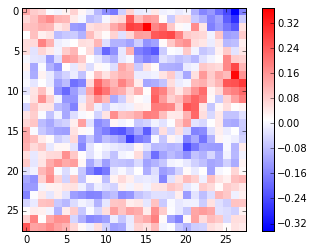

element 980


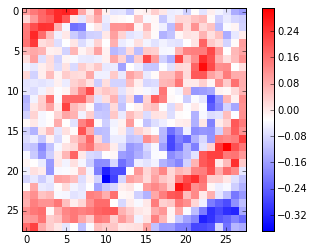

element 981


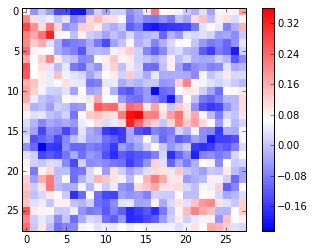

element 982


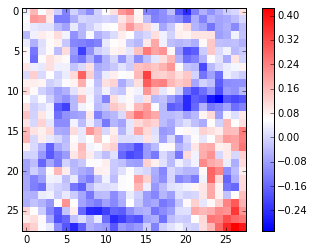

element 983


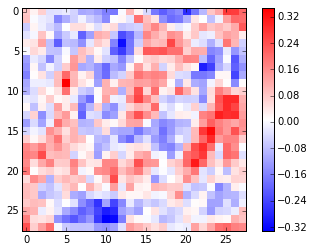

element 984


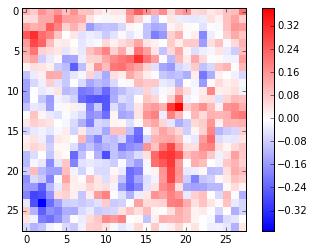

element 985


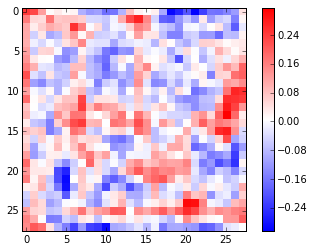

element 986


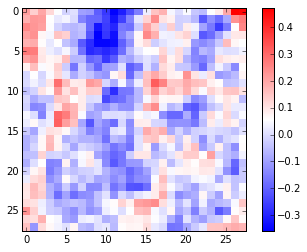

element 987


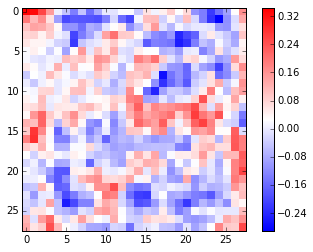

element 988


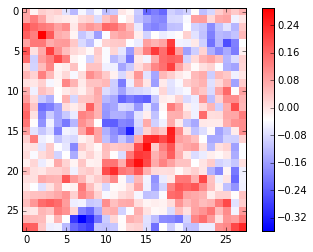

element 989


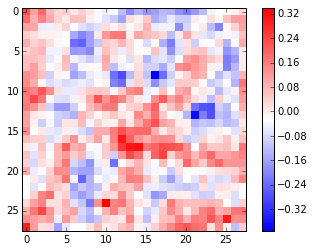

element 990


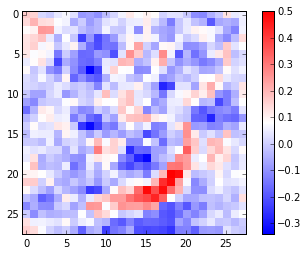

element 991


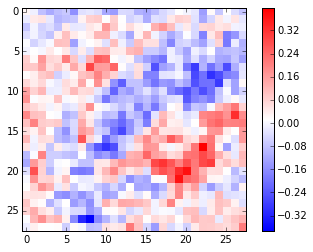

element 992


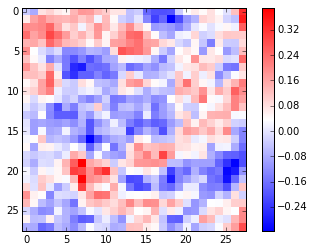

element 993


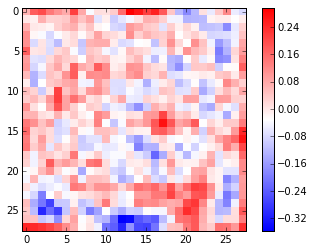

element 994


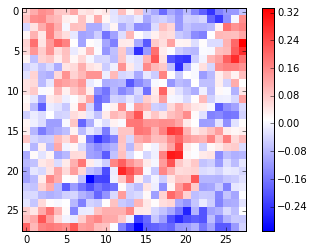

element 995


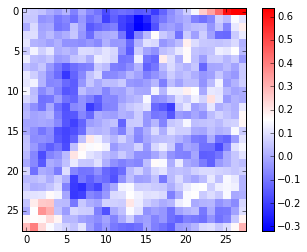

element 996


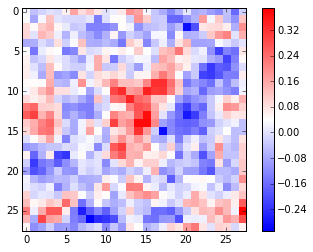

element 997


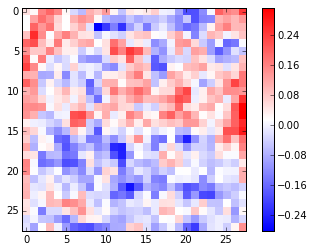

element 998


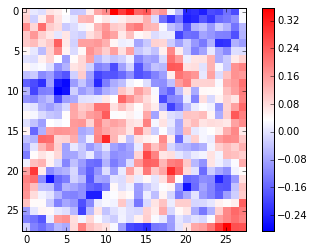

element 999


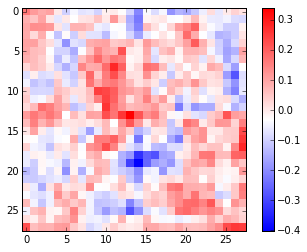

element 1000


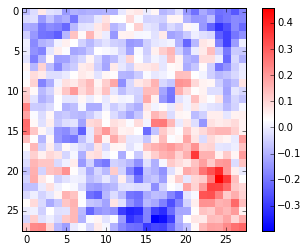

element 1001


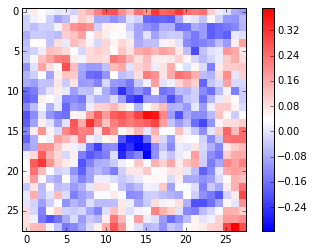

element 1002


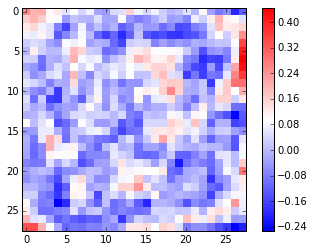

element 1003


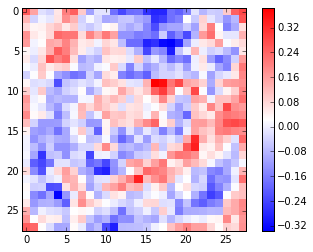

element 1004


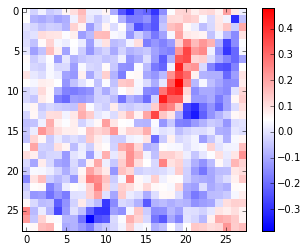

element 1005


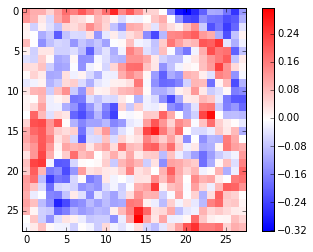

element 1006


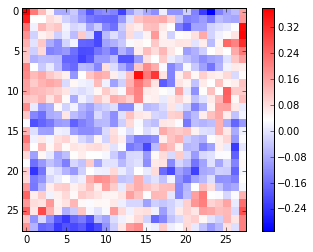

element 1007


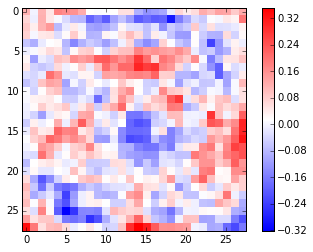

element 1008


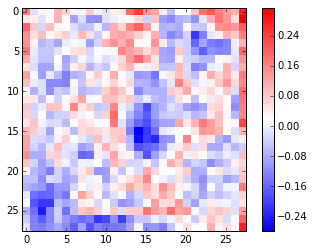

element 1009


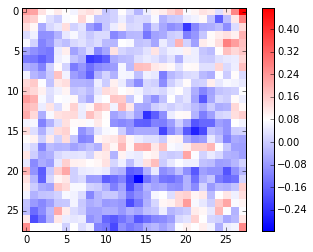

element 1010


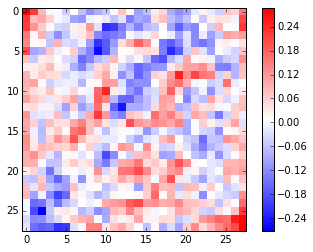

element 1011


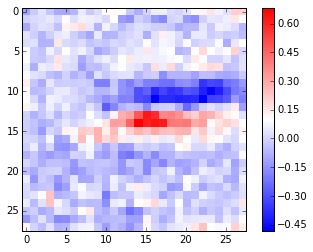

element 1012


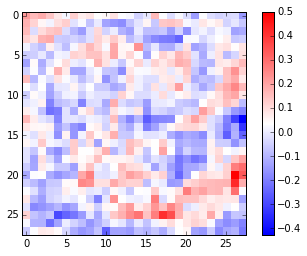

element 1013


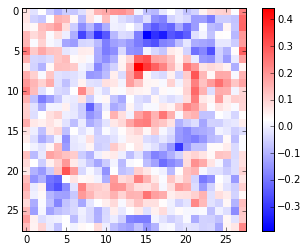

element 1014


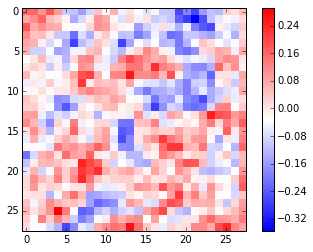

element 1015


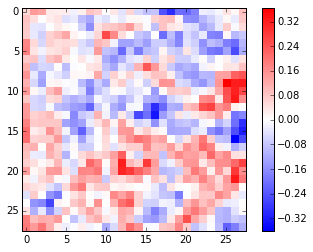

element 1016


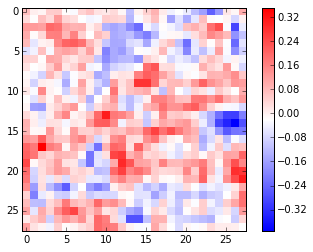

element 1017


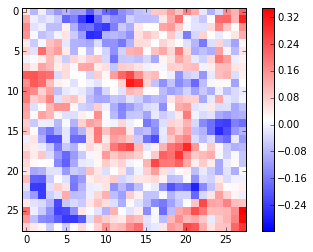

element 1018


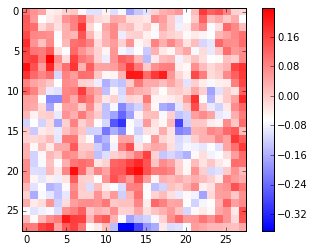

element 1019


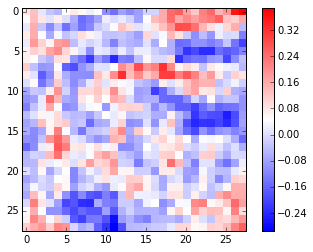

element 1020


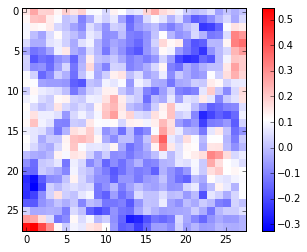

element 1021


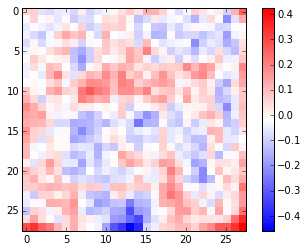

element 1022


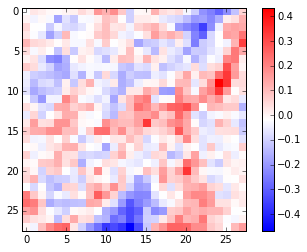

element 1023


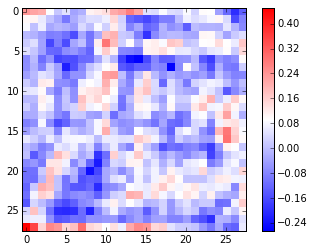

In [62]:
for i in range(0, 1024, 1):
    print 'element', i
    plt.imshow(local_w1[:, i].reshape(28, 28), interpolation='nearest', cmap=plt.cm.bwr)
    plt.colorbar()
    plt.show()